# 1.0 Introduction
This notebook provides step by step implementation of custom Batch normalizaation with enhanced green channel tensors in a custom CNN model. The whole process mainly is divided into 7 parts
1. Model Training Function
2. Model Evaluation Functions
3. Model implementation (22 types of model of which 18 are custom CNN)
4. Model Comparison and evaluation
5. Hyper parameter tuning
6. Final Model Training with best hyper parameter
7. Model Testing on Testset.

PlantVillage dataset provides 15 classes of images with more than 20k images in total. The Dataset was divided into 3 parts Training, validation and testing in 7:2:1 ratio. For the preliminary step a simple CNN was used with adam classifier to set as base. 10 epochs were used for the primary step.

The code was implemented on google colab. So in case it is implemented on differnt environment directory file needs to be changed.

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.utils.data import DataLoader
import torch.nn.functional as F
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import os
import numpy as np
import seaborn as sns
import pandas as pd
import pprint
import random
from torchvision import datasets, transforms
import copy
from torchvision.models import alexnet, densenet121, resnet18, vgg16
from google.colab import drive
import matplotlib.pyplot as plt
from PIL import Image





In [ ]:
# Set random seeds for reproducibility
seed = 42
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
np.random.seed(seed)
random.seed(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False


In [3]:
drive.mount('/content/drive')
!pip install git+https://github.com/jfilter/split-folders.git

import splitfolders

Mounted at /content/drive
  Cloning https://github.com/jfilter/split-folders.git to /tmp/pip-req-build-f0onm1d6
  Running command git clone --filter=blob:none --quiet https://github.com/jfilter/split-folders.git /tmp/pip-req-build-f0onm1d6
  Resolved https://github.com/jfilter/split-folders.git to commit c566dbd56a1097e1ddba2de5dfb93bd67eade54f
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for split_folders: filename=split_folders-0.5.1-py3-none-any.whl size=8395 sha256=1c02abbd3a68fc9f83f568f31d9de7639644ccee42bb95771c9abc9ef3d85ee3
  Stored in directory: /tmp/pip-ephem-wheel-cache-c_54cavj/wheels/0c/da/06/fcebe493adfe604ee9a1d4511e3932a6e63a044edb7a10dec8
Successfully built split_folders


Divide the database into two parts

In [4]:
main_input_folder = '/content/drive/My Drive/PlantVillage/'
main_db='/content/drive/My Drive/PV_Main_DB_02/'

input_folder=main_input_folder
output_folder = main_db
splitfolders.ratio(input_folder, output=output_folder, seed=42, ratio=(0.7, 0.2,0.1))

## 1.1 Data Analysis and display

In [ ]:
class_labels = sorted(os.listdir(output_folder + 'val'))


pprint.pprint(class_labels)
print(f'Total Classes {len(class_labels)}')

['Pepper__bell___Bacterial_spot',
 'Pepper__bell___healthy',
 'Potato___Early_blight',
 'Potato___Late_blight',
 'Potato___healthy',
 'Tomato_Bacterial_spot',
 'Tomato_Early_blight',
 'Tomato_Late_blight',
 'Tomato_Leaf_Mold',
 'Tomato_Septoria_leaf_spot',
 'Tomato_Spider_mites_Two_spotted_spider_mite',
 'Tomato__Target_Spot',
 'Tomato__Tomato_YellowLeaf__Curl_Virus',
 'Tomato__Tomato_mosaic_virus',
 'Tomato_healthy']
Total Classes 15


In [5]:
dira = '/content/drive/My Drive/PlantVillage'
subdirectories = [f for f in os.listdir(dira) if os.path.isdir(os.path.join(dira, f))]


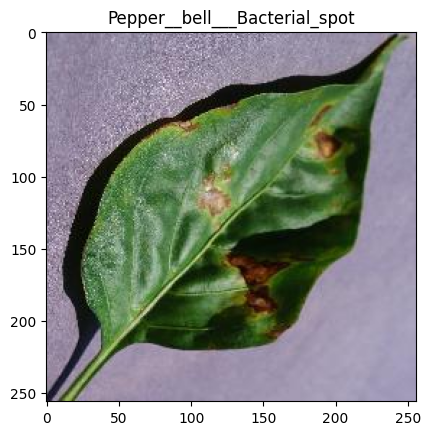

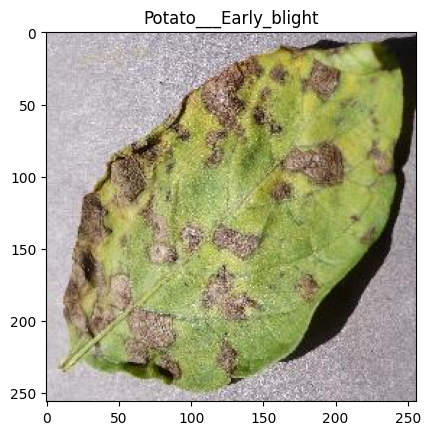

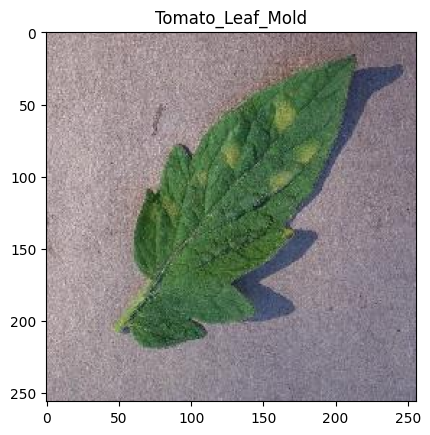

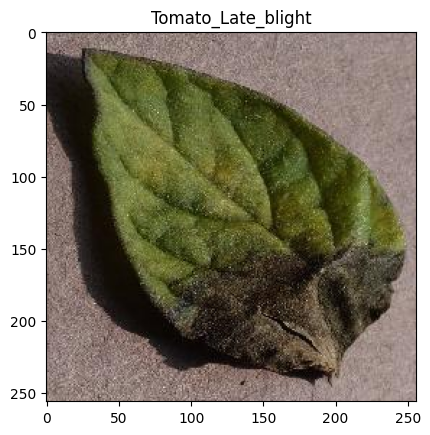

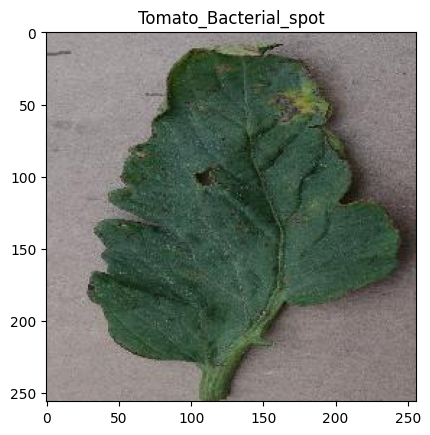

...

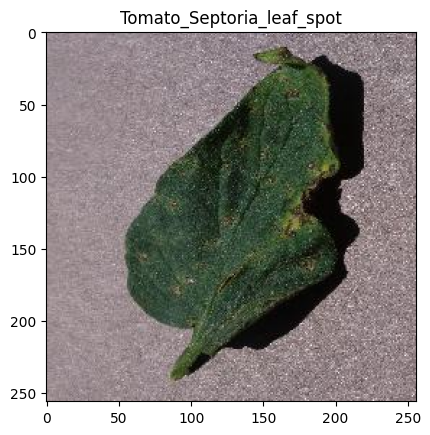

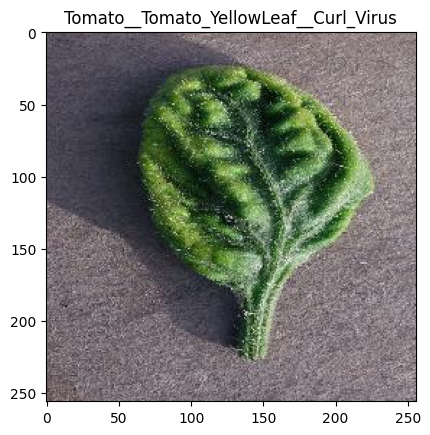

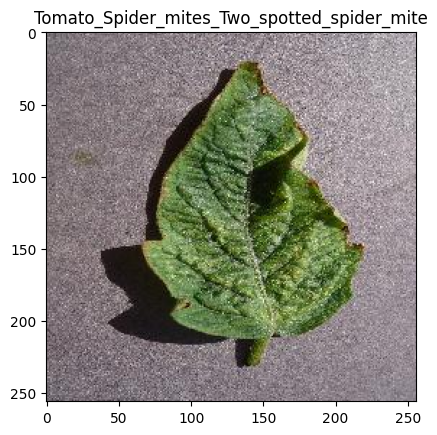

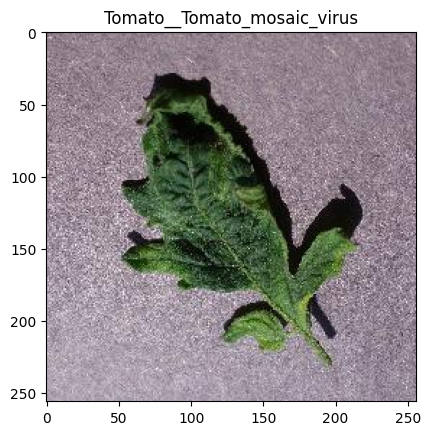

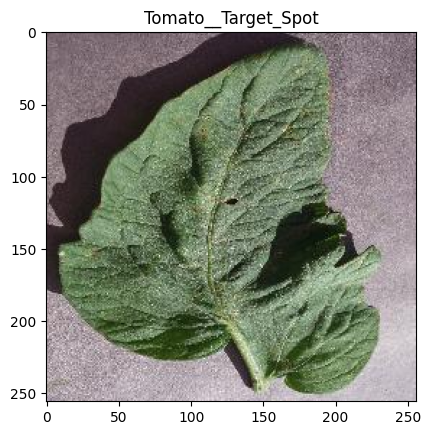

In [9]:
for folder in subdirectories:
    folder_path = os.path.join(dira, folder)
    images = [f for f in os.listdir(folder_path) if f.endswith('.JPG')]  # Change the file extension as needed
    if images:
        random_image = random.choice(images)
        random_image_path = os.path.join(folder_path, random_image)
        img = Image.open(random_image_path)
        plt.imshow(img)
        plt.title(folder)
        plt.show()


Model_Comparison list is considered for future reference.

In [ ]:
num_classes=15
class_label_dict={x:y for x,y in zip(range(0,num_classes),class_labels)}
Model_Comparison=[]

# 2.0 Sample Test Model

In [ ]:
class MD_1_CustomCNN(nn.Module):
    def __init__(self, num_classes):
        self.name='MD_1_CustomCNN'
        super(MD_1_CustomCNN, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )
        self.avgpool = nn.AdaptiveAvgPool2d((7, 7))  # Added adaptive average pooling
        self.classifier = nn.Sequential(
            nn.Linear(64 * 7 * 7, 4096),  # Adjusted input size
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)  # Apply adaptive average pooling
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

# 3.0 Model Training

In [ ]:
# Define transformations for data augmentation
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225))
])

# Load your training, validation and test datasets
train_dataset = datasets.ImageFolder(output_folder+'/train', transform=train_transform)
val_dataset = datasets.ImageFolder(output_folder+'/val', transform=train_transform)
test_dataset = datasets.ImageFolder(output_folder + '/test', transform=train_transform)

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=1, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False, num_workers=1, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=1, pin_memory=True)


In [ ]:
# Training loop
def training_model_old(model,epochs):

  train_accuracy_list = []
  val_accuracy_list = []
  for epoch in range(epochs):
      model.train()
      total_train = 0
      correct_train = 0

      for images, labels in train_loader:
          images, labels = images.to('cuda'), labels.to('cuda')
          optimizer.zero_grad()
          # print(images.shape)

          outputs = model(images)
          loss = criterion(outputs, labels)
          loss.backward()
          optimizer.step()

          _, predicted = torch.max(outputs.data, 1)
          total_train += labels.size(0)
          correct_train += (predicted == labels).sum().item()

      train_accuracy = 100 * correct_train / total_train
      train_accuracy_list.append(train_accuracy)

      # Validation
      model.eval()
      correct_val = 0
      total_val = 0

      with torch.no_grad():
          for images, labels in val_loader:
              images, labels = images.to('cuda'), labels.to('cuda')
              outputs = model(images)
              _, predicted = torch.max(outputs.data, 1)
              total_val += labels.size(0)
              correct_val += (predicted == labels).sum().item()

      val_accuracy = 100 * correct_val / total_val
      val_accuracy_list.append(val_accuracy)

      print(f'Epoch [{epoch+1}/{epochs}] - Loss: {loss.item():.4f}, Training Accuracy: {train_accuracy:.2f}%, Validation Accuracy: {val_accuracy:.2f}%')


In [ ]:
def training_model(model, params, info=''):
    best_model=model
    best_val_acc=0
    epochs=params['epochs']
    criterion=params['criterion']


    train_accuracy_list = []
    val_accuracy_list = []
    train_loss_list = []
    val_loss_list = []

    for epoch in range(epochs):
        model.train()
        total_train = 0
        correct_train = 0
        train_loss = 0  # Initialize training loss

        for images, labels in train_loader:
            images, labels = images.to('cuda'), labels.to('cuda')
            optimizer.zero_grad()

            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            _, predicted = torch.max(outputs.data, 1)
            total_train += labels.size(0)
            correct_train += (predicted == labels).sum().item()

            train_loss += loss.item()  # Accumulate training loss

        train_accuracy = 100 * correct_train / total_train
        train_accuracy_list.append(train_accuracy)
        train_loss_list.append(train_loss / len(train_loader))  # Calculate average training loss

        # Validation
        model.eval()
        correct_val = 0
        total_val = 0
        val_loss = 0  # Initialize validation loss

        with torch.no_grad():
            for images, labels in val_loader:
                images, labels = images.to('cuda'), labels.to('cuda')
                outputs = model(images)
                _, predicted = torch.max(outputs.data, 1)
                total_val += labels.size(0)
                correct_val += (predicted == labels).sum().item()
                val_loss += criterion(outputs, labels).item()  # Accumulate validation loss

        val_accuracy = 100 * correct_val / total_val
        val_accuracy_list.append(val_accuracy)
        val_loss_list.append(val_loss / len(val_loader))  # Calculate average validation loss
        if(val_accuracy>best_val_acc):
            best_model=model
            best_val_acc=val_accuracy
            result={
                  'Name':model.name,
                  'Info':info,
                  'Training_Loss':train_loss_list[-1],
                  'Validation_Loss':val_loss_list[-1],
                  'Training_Accuracy':train_accuracy,
                  'Validation_Accuracy': val_accuracy,
                  'train_accuracy_list':train_accuracy_list,
                  'val_accuracy_list':val_accuracy_list,
                  'train_loss_list':train_loss_list,
                  'val_loss_list':val_loss_list
              }
        print(f'Epoch [{epoch + 1}/{epochs}] -Training Loss: {train_loss_list[-1]:.4f}, Validation Loss: {val_loss_list[-1]:.4f}, Training Accuracy: {train_accuracy:.2f}%, Validation Accuracy: {val_accuracy:.2f}%')


    model=best_model
    return result

Once model trainng is done the required parameters will be stored in Model_comparison list

# 4.0 Model Evaluation
This functions provide graphs of model performance for personal evaluation.

In [ ]:
def plot_training_history(train_acc, val_acc):
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, len(train_acc) + 1), train_acc, label='Training Accuracy', marker='o')
    plt.plot(range(1, len(val_acc) + 1), val_acc, label='Validation Accuracy', marker='o')
    plt.title('Training and Validation Accuracy Over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy (%)')
    plt.legend()
    plt.grid(True)
    plt.show()


In [ ]:
true_labels_test = np.array([label for _, label in test_dataset])
true_labels_val = np.array([label for _, label in val_dataset])
predicted_classes_test=None
predicted_classes_val=None
def generate_pred_vs_actual(model):
    global true_labels_test
    global true_labels_val
    global predicted_classes_test
    global predicted_classes_val
    predicted_labels_test = []
    predicted_labels_val = []



    with torch.no_grad():
      for images, labels in test_loader:
          images, labels = images.to('cuda'), labels.to('cuda')
          outputs = model(images)
          predicted_labels_test.extend(outputs.cpu().numpy())

      for images, labels in val_loader:
          images, labels = images.to('cuda'), labels.to('cuda')
          outputs = model(images)
          predicted_labels_val.extend(outputs.cpu().numpy())
    # Convert predicted labels to class indices
    predicted_classes_test = np.argmax(predicted_labels_test, axis=1)
    predicted_classes_val = np.argmax(predicted_labels_val, axis=1)

    # Get the true labels from one-hot encoded format
    true_labels_test = np.array([label for _, label in test_dataset])
    true_labels_val = np.array([label for _, label in val_dataset])


In [ ]:
def class_accuracy(trues, predicteds, num_classes):

    class_accuracy = {i: 0 for i in range(num_classes)}
    for true, predicted in zip(trues, predicteds):
        if true == predicted:
            class_accuracy[true] += 1

    total_samples_per_class = np.bincount(trues)
    accuracy_percentage_per_class = [(accuracy / total_samples) * 100
                                     for accuracy, total_samples in zip(class_accuracy.values(), total_samples_per_class)]

    class_names = [class_label_dict.get(i) for i in range(num_classes)]

    accuracy_data = {
        'Class_names': class_names,
        'Accuracy (%)': accuracy_percentage_per_class
    }

    accuracy_df = pd.DataFrame(accuracy_data)

    # Create a horizontal bar graph
    plt.figure(figsize=(10, 6))  # Adjust the figure size as needed
    plt.barh(class_names, accuracy_percentage_per_class)
    plt.xlabel('Accuracy (%)')
    plt.ylabel('Class Names')
    plt.title('Class Accuracy')
    plt.xlim(0, 100)  # Set the x-axis limit from 0 to 100 for percentages
    plt.show()

    return accuracy_df

In [ ]:
# Function to generate and plot the confusion matrix
def plot_confusion_matrix(model, data_loader, class_labels):
    # model.eval()
    all_preds = []
    all_targets = []

    with torch.no_grad():
        for images, labels in data_loader:
            images, labels = images.cuda(), labels.cuda()
            outputs = model(images)
            _, predicted = torch.max(outputs, 1)
            all_preds.extend(predicted.cpu().numpy())
            all_targets.extend(labels.cpu().numpy())

    cm = confusion_matrix(all_targets, all_preds)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_labels)
    disp.plot(cmap=plt.cm.inferno, values_format='.4g')
    plt.title("Confusion Matrix")
    plt.xticks(rotation=90)
    plt.show()


The following evaluation() function provide
1. Training vs validation accuracy over epochs
2. Individual Class accuracy
3. Confusion Matrix for all class.  

In [ ]:
def evaluation(model,data_loader,class_labels,train_acc,val_acc,trues, predicteds, num_classes):
  generate_pred_vs_actual(model)
  plot_training_history(train_acc, val_acc)
  print(class_accuracy(trues, predicteds, num_classes))
  plot_confusion_matrix(model, data_loader, class_labels)


# 5.0 Model Implementation and Training

After Testing the sample model other models are implemented.

Epoch [1/10] -Training Loss: 2.2164, Validation Loss: 1.7401, Training Accuracy: 30.87%, Validation Accuracy: 46.83%
Epoch [2/10] -Training Loss: 1.5550, Validation Loss: 1.4392, Training Accuracy: 51.24%, Validation Accuracy: 56.34%
Epoch [3/10] -Training Loss: 1.2914, Validation Loss: 1.2574, Training Accuracy: 60.64%, Validation Accuracy: 60.73%
Epoch [4/10] -Training Loss: 1.1610, Validation Loss: 1.1924, Training Accuracy: 62.91%, Validation Accuracy: 61.71%
Epoch [5/10] -Training Loss: 1.0213, Validation Loss: 1.0745, Training Accuracy: 66.99%, Validation Accuracy: 65.12%
Epoch [6/10] -Training Loss: 0.9526, Validation Loss: 1.0223, Training Accuracy: 69.89%, Validation Accuracy: 66.34%
Epoch [7/10] -Training Loss: 0.8730, Validation Loss: 0.9465, Training Accuracy: 72.58%, Validation Accuracy: 70.98%
Epoch [8/10] -Training Loss: 0.7909, Validation Loss: 0.9087, Training Accuracy: 74.79%, Validation Accuracy: 71.22%
Epoch [9/10] -Training Loss: 0.7341, Validation Loss: 0.8869, Tr

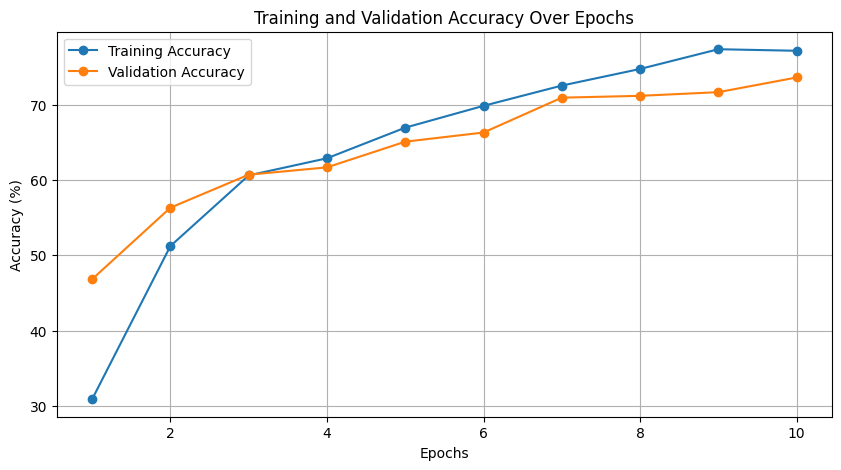

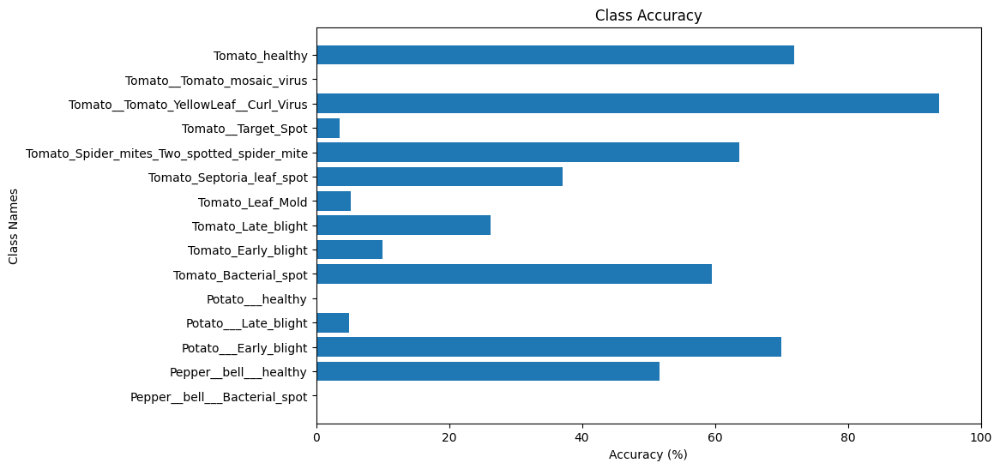

                                    Class_names  Accuracy (%)
0                 Pepper__bell___Bacterial_spot      0.000000
1                        Pepper__bell___healthy     51.724138
2                         Potato___Early_blight     70.000000
3                          Potato___Late_blight      5.000000
4                              Potato___healthy      0.000000
5                         Tomato_Bacterial_spot     59.523810
6                           Tomato_Early_blight     10.000000
7                            Tomato_Late_blight     26.315789
8                              Tomato_Leaf_Mold      5.263158
9                     Tomato_Septoria_leaf_spot     37.142857
10  Tomato_Spider_mites_Two_spotted_spider_mite     63.636364
11                          Tomato__Target_Spot      3.571429
12        Tomato__Tomato_YellowLeaf__Curl_Virus     93.750000
13                  Tomato__Tomato_mosaic_virus      0.000000
14                               Tomato_healthy     71.875000


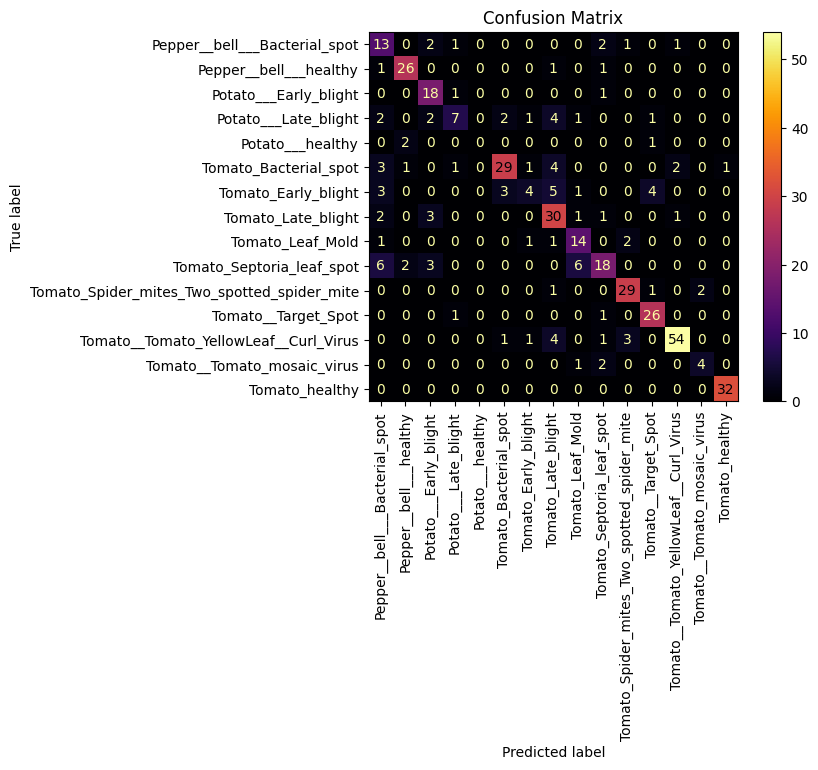

In [ ]:
model = MD_1_CustomCNN(num_classes=15).cuda()

params={
    'epochs':10,
    'criterion':nn.CrossEntropyLoss(),
    'lr':0.0001,
    'momentum':0.1
}
optimizer = optim.Adam(model.parameters(), lr=params['lr'])

result=training_model(model,params)
Model_Comparison.append(result)

evaluation(model,val_loader,class_labels,result['train_accuracy_list'],result['val_accuracy_list'],true_labels_val, predicted_classes_val, num_classes)

## 5.1 CNN Models (Layer Customization)


### Model 2
Few Layers added

In [ ]:
class MD_2_CustomCNN(nn.Module):
    def __init__(self, num_classes):
        self.name='MD_2_CustomCNN'
        super(MD_2_CustomCNN, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )
        self.avgpool = nn.AdaptiveAvgPool2d((7, 7))  # Added adaptive average pooling
        self.classifier = nn.Sequential(
            nn.Linear(128 * 7 * 7, 4096),  # Adjusted input size
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)  # Apply adaptive average pooling
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

Epoch [1/10] -Training Loss: 2.2620, Validation Loss: 1.7825, Training Accuracy: 27.69%, Validation Accuracy: 45.61%
Epoch [2/10] -Training Loss: 1.5751, Validation Loss: 1.3932, Training Accuracy: 49.24%, Validation Accuracy: 55.61%
Epoch [3/10] -Training Loss: 1.3058, Validation Loss: 1.2571, Training Accuracy: 57.39%, Validation Accuracy: 59.76%
Epoch [4/10] -Training Loss: 1.1427, Validation Loss: 1.0798, Training Accuracy: 62.09%, Validation Accuracy: 66.34%
Epoch [5/10] -Training Loss: 1.0016, Validation Loss: 1.0757, Training Accuracy: 67.06%, Validation Accuracy: 66.83%
Epoch [6/10] -Training Loss: 0.9020, Validation Loss: 1.0210, Training Accuracy: 71.27%, Validation Accuracy: 69.02%
Epoch [7/10] -Training Loss: 0.8225, Validation Loss: 0.8972, Training Accuracy: 73.34%, Validation Accuracy: 70.24%
Epoch [8/10] -Training Loss: 0.7250, Validation Loss: 0.9190, Training Accuracy: 74.86%, Validation Accuracy: 72.44%
Epoch [9/10] -Training Loss: 0.6703, Validation Loss: 0.8649, Tr

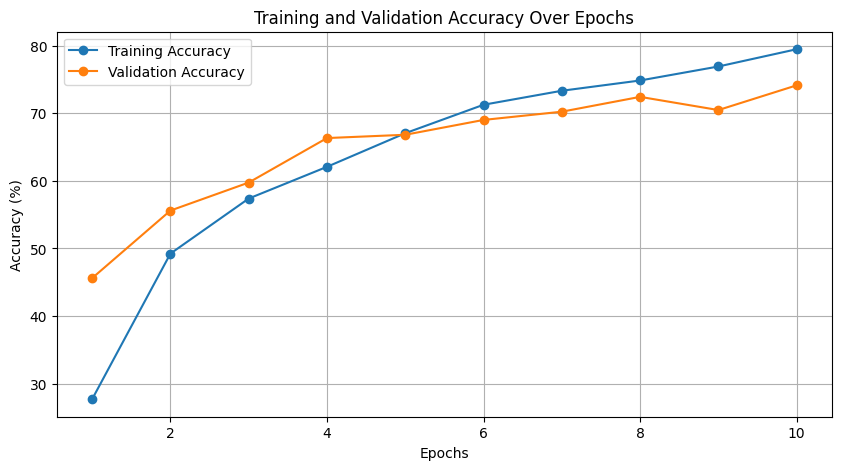

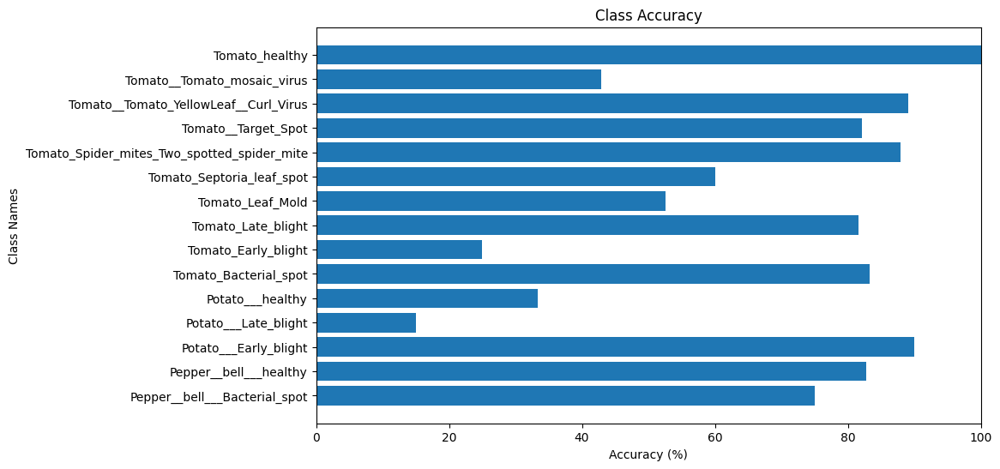

                                    Class_names  Accuracy (%)
0                 Pepper__bell___Bacterial_spot     75.000000
1                        Pepper__bell___healthy     82.758621
2                         Potato___Early_blight     90.000000
3                          Potato___Late_blight     15.000000
4                              Potato___healthy     33.333333
5                         Tomato_Bacterial_spot     83.333333
6                           Tomato_Early_blight     25.000000
7                            Tomato_Late_blight     81.578947
8                              Tomato_Leaf_Mold     52.631579
9                     Tomato_Septoria_leaf_spot     60.000000
10  Tomato_Spider_mites_Two_spotted_spider_mite     87.878788
11                          Tomato__Target_Spot     82.142857
12        Tomato__Tomato_YellowLeaf__Curl_Virus     89.062500
13                  Tomato__Tomato_mosaic_virus     42.857143
14                               Tomato_healthy    100.000000


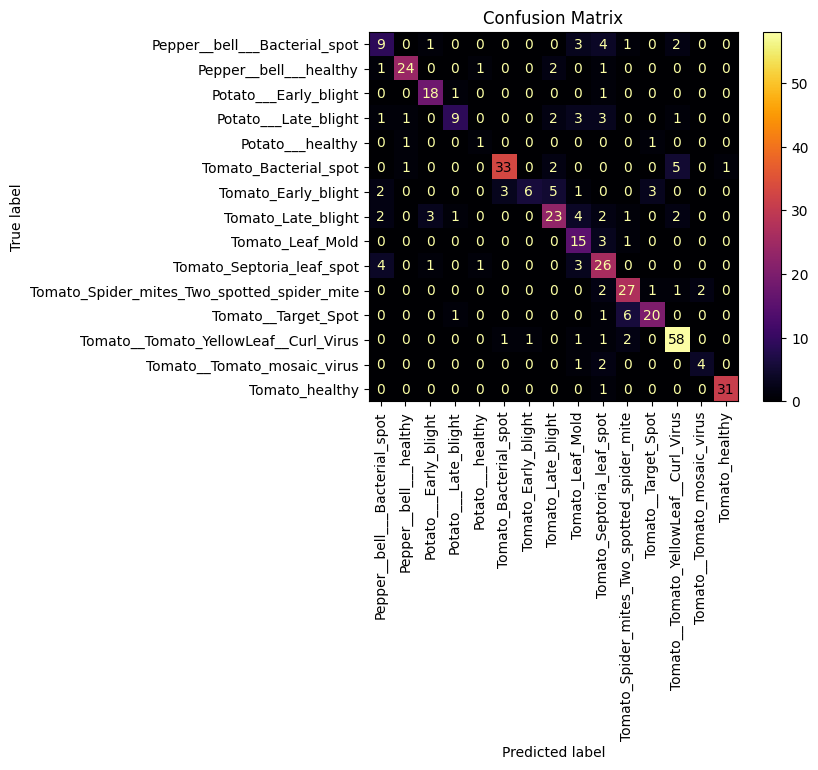

In [ ]:
model = MD_2_CustomCNN(num_classes=15).cuda()

params={
    'epochs':10,
    'criterion':nn.CrossEntropyLoss(),
    'lr':0.0001,
    'momentum':0.1
}
optimizer = optim.Adam(model.parameters(), lr=params['lr'])

result=training_model(model,params)
Model_Comparison.append(result)

evaluation(model,val_loader,class_labels,result['train_accuracy_list'],result['val_accuracy_list'],true_labels_val, predicted_classes_val, num_classes)

### Model 3
More layers added

In [ ]:
class MD_3_CustomCNN(nn.Module):
    def __init__(self, num_classes):
        self.name='MD_3_CustomCNN'
        super(MD_3_CustomCNN, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

        )
        self.avgpool = nn.AdaptiveAvgPool2d((7, 7))  # Added adaptive average pooling
        self.classifier = nn.Sequential(
            nn.Linear(256 * 7 * 7, 4096),  # Adjusted input size
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)  # Apply adaptive average pooling
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

Epoch [1/10] -Training Loss: 2.5655, Validation Loss: 2.3525, Training Accuracy: 13.40%, Validation Accuracy: 17.80%
Epoch [2/10] -Training Loss: 2.1448, Validation Loss: 1.9154, Training Accuracy: 27.62%, Validation Accuracy: 36.59%
Epoch [3/10] -Training Loss: 1.8558, Validation Loss: 1.6582, Training Accuracy: 38.26%, Validation Accuracy: 45.37%
Epoch [4/10] -Training Loss: 1.5096, Validation Loss: 1.5847, Training Accuracy: 50.35%, Validation Accuracy: 45.37%
Epoch [5/10] -Training Loss: 1.3521, Validation Loss: 1.1912, Training Accuracy: 55.39%, Validation Accuracy: 61.95%
Epoch [6/10] -Training Loss: 1.1949, Validation Loss: 1.1966, Training Accuracy: 60.70%, Validation Accuracy: 60.24%
Epoch [7/10] -Training Loss: 1.1234, Validation Loss: 1.1133, Training Accuracy: 62.43%, Validation Accuracy: 63.66%
Epoch [8/10] -Training Loss: 1.0419, Validation Loss: 1.0506, Training Accuracy: 64.43%, Validation Accuracy: 65.37%
Epoch [9/10] -Training Loss: 0.9331, Validation Loss: 1.1196, Tr

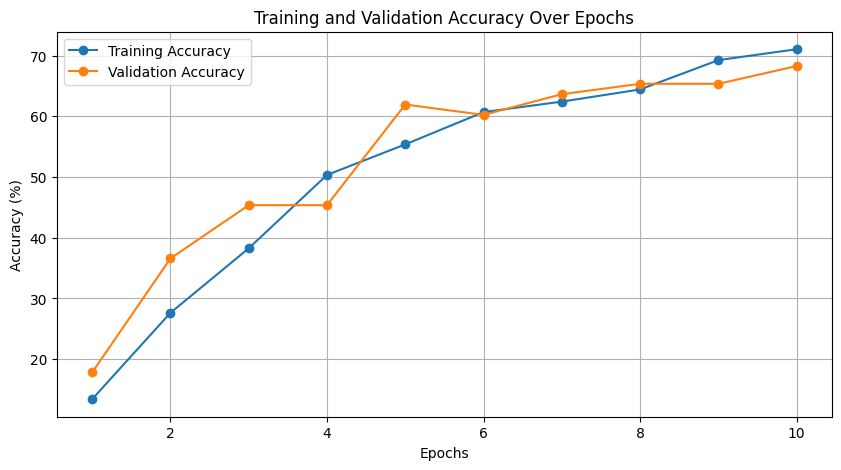

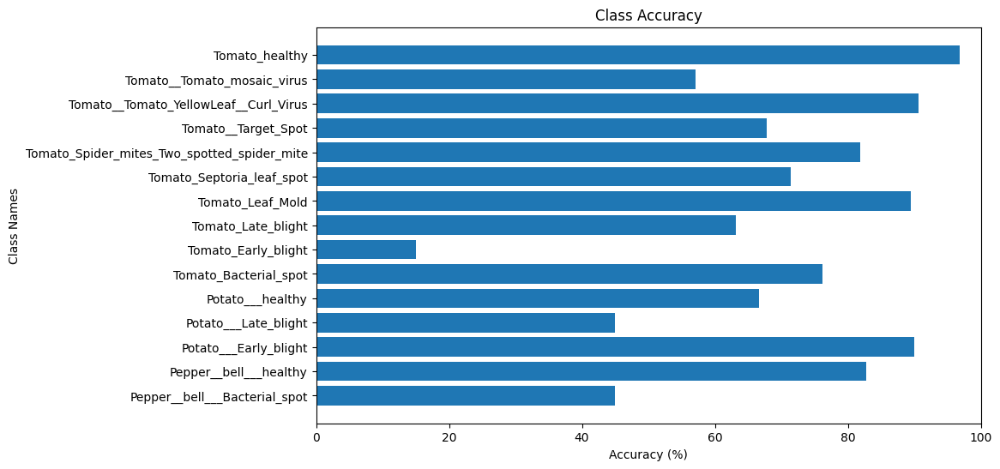

                                    Class_names  Accuracy (%)
0                 Pepper__bell___Bacterial_spot     45.000000
1                        Pepper__bell___healthy     82.758621
2                         Potato___Early_blight     90.000000
3                          Potato___Late_blight     45.000000
4                              Potato___healthy     66.666667
5                         Tomato_Bacterial_spot     76.190476
6                           Tomato_Early_blight     15.000000
7                            Tomato_Late_blight     63.157895
8                              Tomato_Leaf_Mold     89.473684
9                     Tomato_Septoria_leaf_spot     71.428571
10  Tomato_Spider_mites_Two_spotted_spider_mite     81.818182
11                          Tomato__Target_Spot     67.857143
12        Tomato__Tomato_YellowLeaf__Curl_Virus     90.625000
13                  Tomato__Tomato_mosaic_virus     57.142857
14                               Tomato_healthy     96.875000


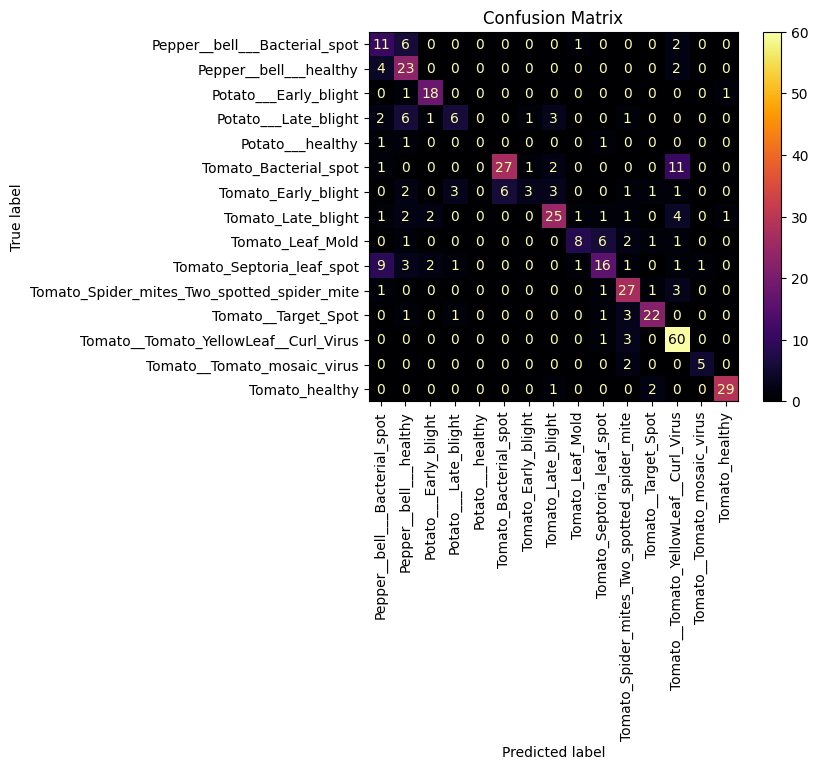

In [ ]:
model = MD_3_CustomCNN(num_classes=15).cuda()

params={
    'epochs':10,
    'criterion':nn.CrossEntropyLoss(),
    'lr':0.0001,
    'momentum':0.1
}
optimizer = optim.Adam(model.parameters(), lr=params['lr'])

result=training_model(model,params)
Model_Comparison.append(result)

evaluation(model,val_loader,class_labels,result['train_accuracy_list'],result['val_accuracy_list'],true_labels_val, predicted_classes_val, num_classes)

### Model 4

In [ ]:
class MD_4_CustomCNN(nn.Module):
    def __init__(self, num_classes):
        self.name='MD_4_CustomCNN'
        super(MD_4_CustomCNN, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )
        self.avgpool = nn.AdaptiveAvgPool2d((7, 7))  # Added adaptive average pooling
        self.classifier = nn.Sequential(
            nn.Linear(512 * 7 * 7, 4096),  # Adjusted input size
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)  # Apply adaptive average pooling
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

Epoch [1/10] -Training Loss: 2.5605, Validation Loss: 2.4057, Training Accuracy: 15.47%, Validation Accuracy: 15.61%
Epoch [2/10] -Training Loss: 2.3196, Validation Loss: 2.1391, Training Accuracy: 19.89%, Validation Accuracy: 28.05%
Epoch [3/10] -Training Loss: 2.1281, Validation Loss: 2.1490, Training Accuracy: 26.66%, Validation Accuracy: 26.34%
Epoch [4/10] -Training Loss: 2.0270, Validation Loss: 1.9349, Training Accuracy: 30.39%, Validation Accuracy: 33.90%
Epoch [5/10] -Training Loss: 1.9111, Validation Loss: 1.7463, Training Accuracy: 34.88%, Validation Accuracy: 44.15%
Epoch [6/10] -Training Loss: 1.7652, Validation Loss: 1.5656, Training Accuracy: 42.06%, Validation Accuracy: 49.51%
Epoch [7/10] -Training Loss: 1.6080, Validation Loss: 1.4902, Training Accuracy: 45.03%, Validation Accuracy: 50.49%
Epoch [8/10] -Training Loss: 1.5263, Validation Loss: 1.5479, Training Accuracy: 49.86%, Validation Accuracy: 48.54%
Epoch [9/10] -Training Loss: 1.3912, Validation Loss: 1.4699, Tr

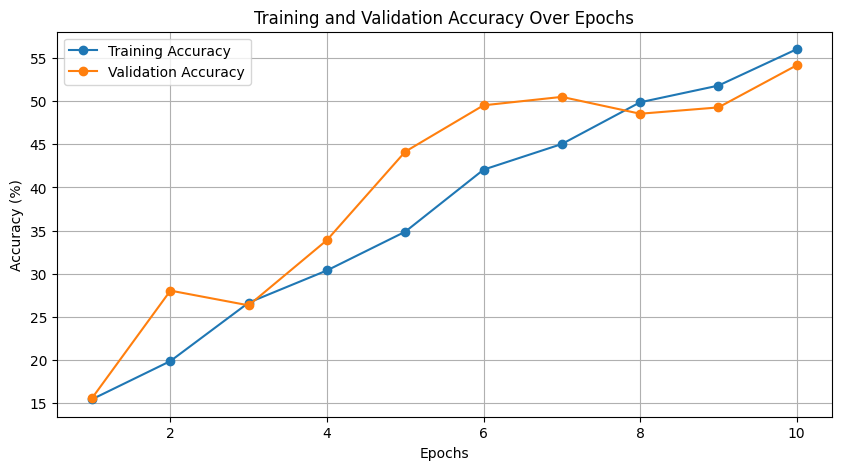

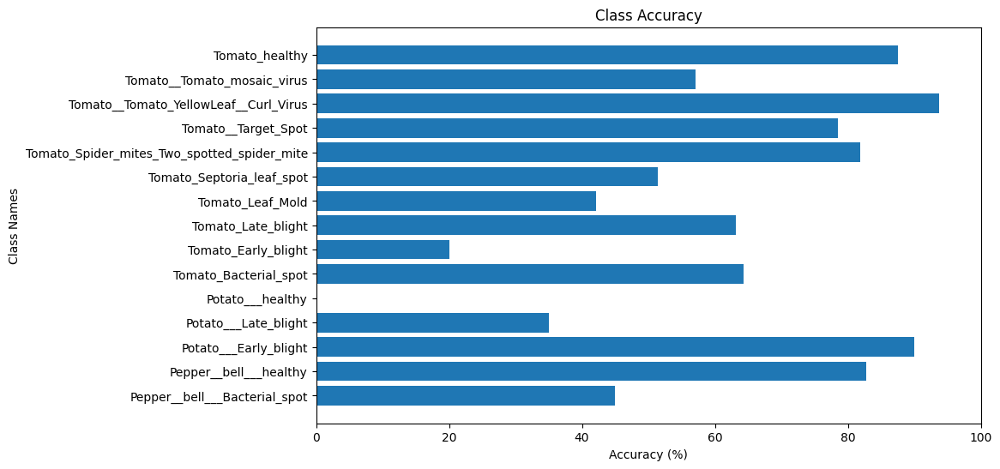

                                    Class_names  Accuracy (%)
0                 Pepper__bell___Bacterial_spot     45.000000
1                        Pepper__bell___healthy     82.758621
2                         Potato___Early_blight     90.000000
3                          Potato___Late_blight     35.000000
4                              Potato___healthy      0.000000
5                         Tomato_Bacterial_spot     64.285714
6                           Tomato_Early_blight     20.000000
7                            Tomato_Late_blight     63.157895
8                              Tomato_Leaf_Mold     42.105263
9                     Tomato_Septoria_leaf_spot     51.428571
10  Tomato_Spider_mites_Two_spotted_spider_mite     81.818182
11                          Tomato__Target_Spot     78.571429
12        Tomato__Tomato_YellowLeaf__Curl_Virus     93.750000
13                  Tomato__Tomato_mosaic_virus     57.142857
14                               Tomato_healthy     87.500000


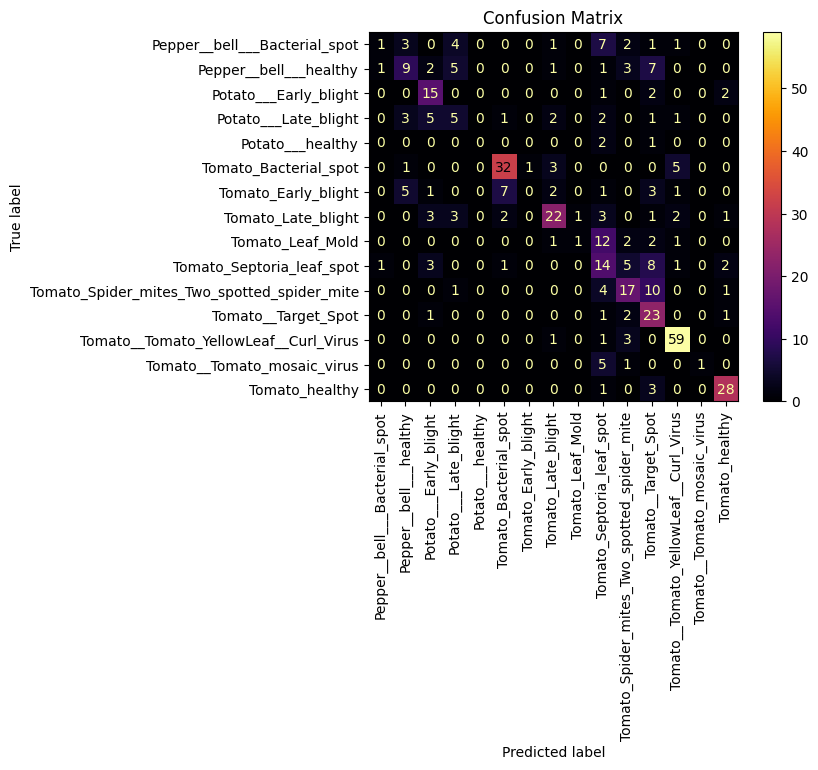

In [ ]:
model = MD_4_CustomCNN(num_classes=15).cuda()

params={
    'epochs':10,
    'criterion':nn.CrossEntropyLoss(),
    'lr':0.0001,
    'momentum':0.1
}
optimizer = optim.Adam(model.parameters(), lr=params['lr'])

result=training_model(model,params)
Model_Comparison.append(result)

evaluation(model,val_loader,class_labels,result['train_accuracy_list'],result['val_accuracy_list'],true_labels_val, predicted_classes_val, num_classes)

## 5.2 Batch Normalization

### Model 5 EPS value=1e-5

In [ ]:
class CustomBatchNorm2d(nn.Module):
    def __init__(self, num_features, eps=1e-5, momentum=0.1):
        super(CustomBatchNorm2d, self).__init__()
        self.num_features = num_features
        self.eps = eps
        self.momentum = momentum
        self.weight = nn.Parameter(torch.ones(1, num_features, 1, 1).cuda())
        self.bias = nn.Parameter(torch.zeros(1, num_features, 1, 1).cuda())
        self.running_mean = torch.zeros(1, num_features, 1, 1).cuda()
        self.running_var = torch.ones(1, num_features, 1, 1).cuda()

    def forward(self, x):
        if self.training:
            mean = x.mean(dim=(0, 2, 3), keepdim=True)
            var = x.var(dim=(0, 2, 3), unbiased=False, keepdim=True)
            self.running_mean = (1 - self.momentum) * self.running_mean + self.momentum * mean
            self.running_var = (1 - self.momentum) * self.running_var + self.momentum * var
        else:
            mean = self.running_mean
            var = self.running_var

        x = (x - mean) / torch.sqrt(var + self.eps)
        x = x * self.weight + self.bias
        return x



class MD_5_CustomCNNWithCustomBN(nn.Module):
    def __init__(self, num_classes):
        self.name='MD_5CustomCNNWithCustomBN'
        super(MD_5_CustomCNNWithCustomBN, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            CustomBatchNorm2d(64),   # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            CustomBatchNorm2d(64),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            CustomBatchNorm2d(128),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            CustomBatchNorm2d(128),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )
        self.avgpool = nn.AdaptiveAvgPool2d((7, 7))
        self.classifier = nn.Sequential(
            nn.Linear(512 * 7 * 7, 4096),
            nn.BatchNorm1d(4096),  # Add batch normalization for fully connected layers
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.BatchNorm1d(4096),  # Add batch normalization for fully connected layers
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.BatchNorm1d(4096),  # Add batch normalization for fully connected layers
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

Epoch [1/10] -Training Loss: 2.3982, Validation Loss: 2.9080, Training Accuracy: 28.87%, Validation Accuracy: 41.95%
Epoch [2/10] -Training Loss: 1.9026, Validation Loss: 1.8162, Training Accuracy: 45.65%, Validation Accuracy: 47.07%
Epoch [3/10] -Training Loss: 1.6350, Validation Loss: 1.8677, Training Accuracy: 51.17%, Validation Accuracy: 48.78%
Epoch [4/10] -Training Loss: 1.4686, Validation Loss: 1.2456, Training Accuracy: 55.18%, Validation Accuracy: 57.32%
Epoch [5/10] -Training Loss: 1.3088, Validation Loss: 1.1319, Training Accuracy: 60.43%, Validation Accuracy: 62.44%
Epoch [6/10] -Training Loss: 1.2517, Validation Loss: 0.8605, Training Accuracy: 62.15%, Validation Accuracy: 73.17%
Epoch [7/10] -Training Loss: 1.2232, Validation Loss: 1.8964, Training Accuracy: 64.09%, Validation Accuracy: 51.22%
Epoch [8/10] -Training Loss: 1.1164, Validation Loss: 1.4249, Training Accuracy: 66.44%, Validation Accuracy: 60.24%
Epoch [9/10] -Training Loss: 1.0633, Validation Loss: 1.3021, Tr

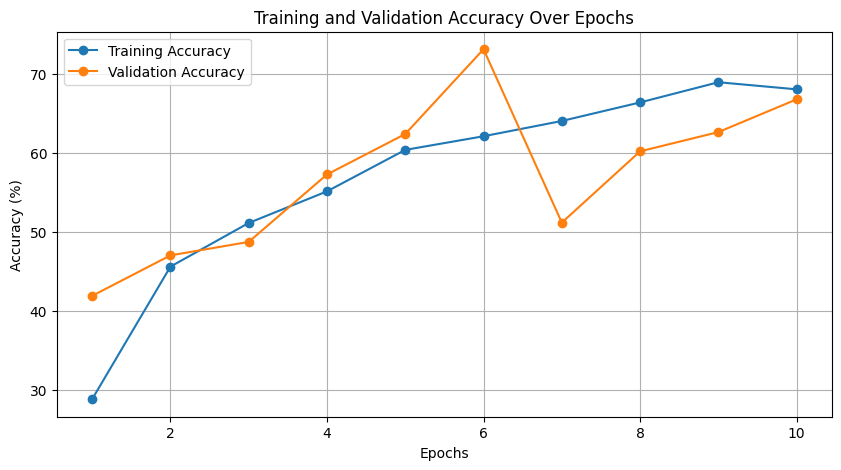

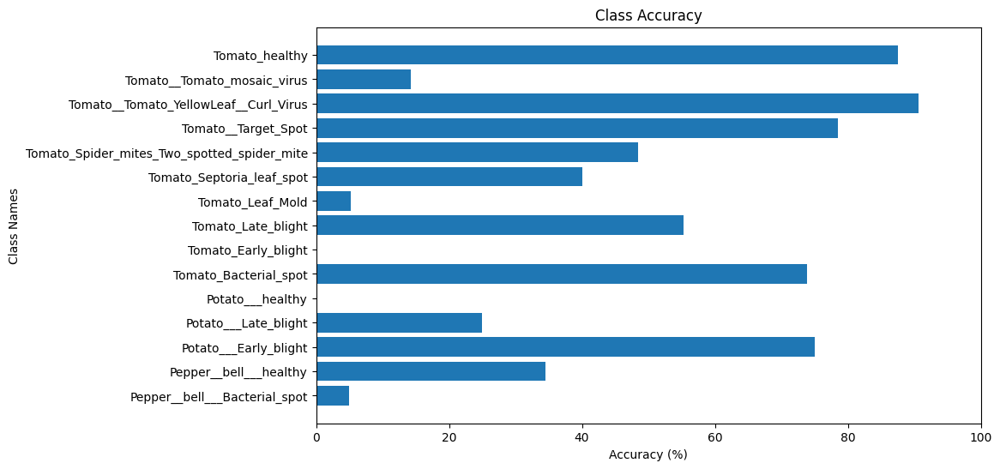

                                    Class_names  Accuracy (%)
0                 Pepper__bell___Bacterial_spot      5.000000
1                        Pepper__bell___healthy     34.482759
2                         Potato___Early_blight     75.000000
3                          Potato___Late_blight     25.000000
4                              Potato___healthy      0.000000
5                         Tomato_Bacterial_spot     73.809524
6                           Tomato_Early_blight      0.000000
7                            Tomato_Late_blight     55.263158
8                              Tomato_Leaf_Mold      5.263158
9                     Tomato_Septoria_leaf_spot     40.000000
10  Tomato_Spider_mites_Two_spotted_spider_mite     48.484848
11                          Tomato__Target_Spot     78.571429
12        Tomato__Tomato_YellowLeaf__Curl_Virus     90.625000
13                  Tomato__Tomato_mosaic_virus     14.285714
14                               Tomato_healthy     87.500000


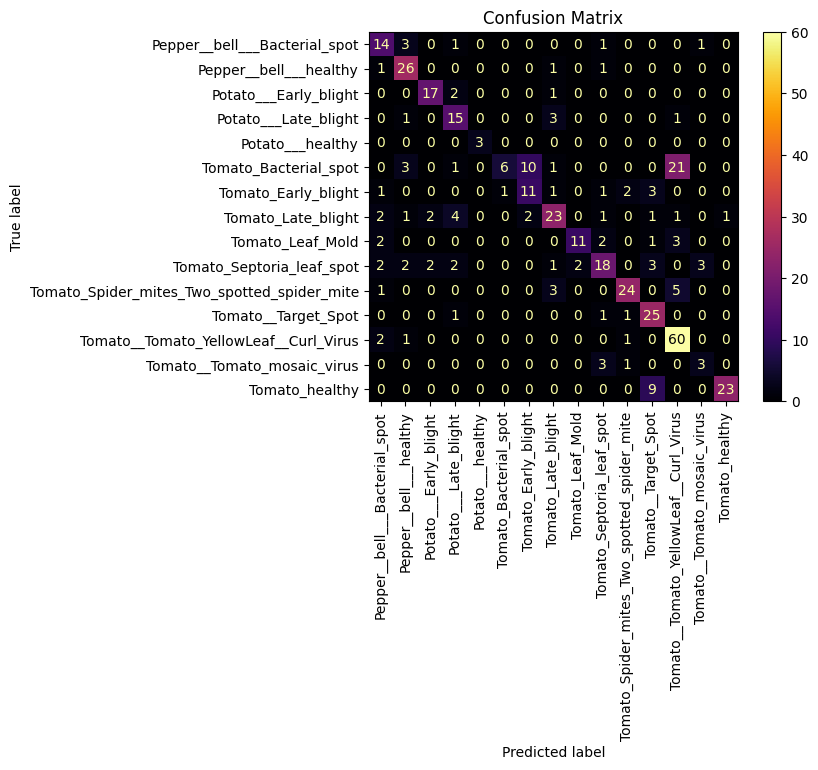

In [ ]:
model = MD_5_CustomCNNWithCustomBN(num_classes=15).cuda()

params={
    'epochs':10,
    'criterion':nn.CrossEntropyLoss(),
    'lr':0.0006,
    'momentum':0.1
}
optimizer = optim.Adam(model.parameters(), lr=params['lr'])

result=training_model(model,params)
Model_Comparison.append(result)

evaluation(model,val_loader,class_labels,result['train_accuracy_list'],result['val_accuracy_list'],true_labels_val, predicted_classes_val, num_classes)

### Model 6 EPS value=1e-1

In [ ]:
class MD_6_CustomBatchNorm2d(nn.Module):
    def __init__(self, num_features, eps=1e-1, momentum=0.1):
        super(MD_6_CustomBatchNorm2d, self).__init__()
        self.num_features = num_features
        self.eps = eps
        self.momentum = momentum
        self.weight = nn.Parameter(torch.ones(1, num_features, 1, 1).cuda())
        self.bias = nn.Parameter(torch.zeros(1, num_features, 1, 1).cuda())
        self.running_mean = torch.zeros(1, num_features, 1, 1).cuda()
        self.running_var = torch.ones(1, num_features, 1, 1).cuda()

    def forward(self, x):
        if self.training:
            mean = x.mean(dim=(0, 2, 3), keepdim=True)
            var = x.var(dim=(0, 2, 3), unbiased=False, keepdim=True)
            self.running_mean = (1 - self.momentum) * self.running_mean + self.momentum * mean
            self.running_var = (1 - self.momentum) * self.running_var + self.momentum * var
        else:
            mean = self.running_mean
            var = self.running_var

        x = (x - mean) / torch.sqrt(var + self.eps)
        x = x * self.weight + self.bias
        return x



class MD_6_CustomCNNWithCustomBN(nn.Module):
    def __init__(self, num_classes):
        self.name='MD_6_CustomCNNWithCustomBN'
        super(MD_6_CustomCNNWithCustomBN, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            MD_6_CustomBatchNorm2d(64),   # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            MD_6_CustomBatchNorm2d(64),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            MD_6_CustomBatchNorm2d(128),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            MD_6_CustomBatchNorm2d(128),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            MD_6_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            MD_6_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            MD_6_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            MD_6_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            MD_6_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            MD_6_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )
        self.avgpool = nn.AdaptiveAvgPool2d((7, 7))
        self.classifier = nn.Sequential(
            nn.Linear(512 * 7 * 7, 4096),
            nn.BatchNorm1d(4096),  # Add batch normalization for fully connected layers
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.BatchNorm1d(4096),  # Add batch normalization for fully connected layers
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.BatchNorm1d(4096),  # Add batch normalization for fully connected layers
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

Epoch [1/10] -Training Loss: 2.4971, Validation Loss: 1.9016, Training Accuracy: 28.45%, Validation Accuracy: 37.80%
Epoch [2/10] -Training Loss: 2.1044, Validation Loss: 4.2010, Training Accuracy: 37.29%, Validation Accuracy: 33.66%
Epoch [3/10] -Training Loss: 1.8848, Validation Loss: 3.8026, Training Accuracy: 44.20%, Validation Accuracy: 44.63%
Epoch [4/10] -Training Loss: 1.7220, Validation Loss: 1.4082, Training Accuracy: 49.03%, Validation Accuracy: 58.29%
Epoch [5/10] -Training Loss: 1.6207, Validation Loss: 1.7384, Training Accuracy: 51.86%, Validation Accuracy: 59.27%
Epoch [6/10] -Training Loss: 1.5838, Validation Loss: 1.1512, Training Accuracy: 52.28%, Validation Accuracy: 63.17%
Epoch [7/10] -Training Loss: 1.3752, Validation Loss: 1.3015, Training Accuracy: 56.77%, Validation Accuracy: 61.71%
Epoch [8/10] -Training Loss: 1.3875, Validation Loss: 1.2622, Training Accuracy: 59.32%, Validation Accuracy: 59.76%
Epoch [9/10] -Training Loss: 1.4059, Validation Loss: 1.3002, Tr

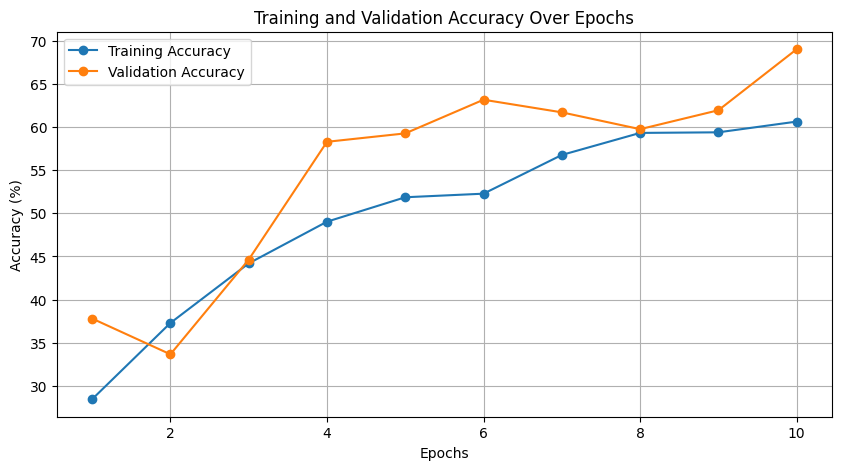

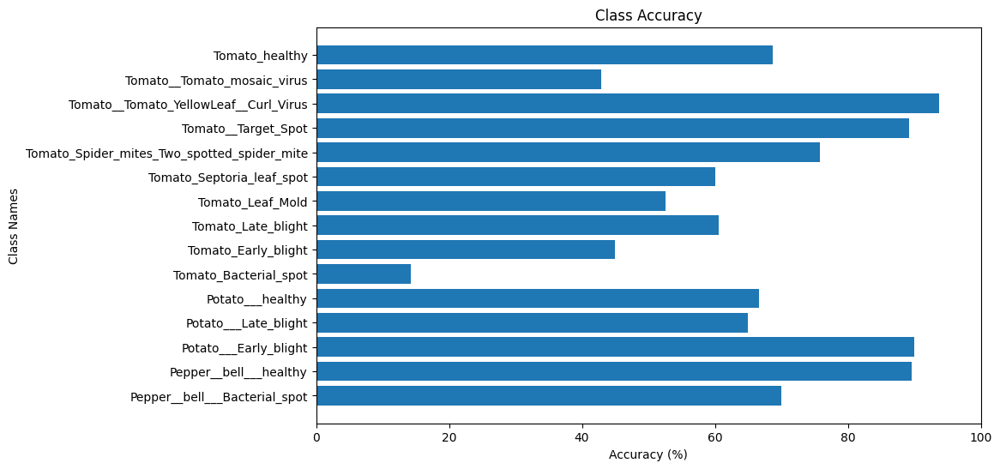

                                    Class_names  Accuracy (%)
0                 Pepper__bell___Bacterial_spot     70.000000
1                        Pepper__bell___healthy     89.655172
2                         Potato___Early_blight     90.000000
3                          Potato___Late_blight     65.000000
4                              Potato___healthy     66.666667
5                         Tomato_Bacterial_spot     14.285714
6                           Tomato_Early_blight     45.000000
7                            Tomato_Late_blight     60.526316
8                              Tomato_Leaf_Mold     52.631579
9                     Tomato_Septoria_leaf_spot     60.000000
10  Tomato_Spider_mites_Two_spotted_spider_mite     75.757576
11                          Tomato__Target_Spot     89.285714
12        Tomato__Tomato_YellowLeaf__Curl_Virus     93.750000
13                  Tomato__Tomato_mosaic_virus     42.857143
14                               Tomato_healthy     68.750000


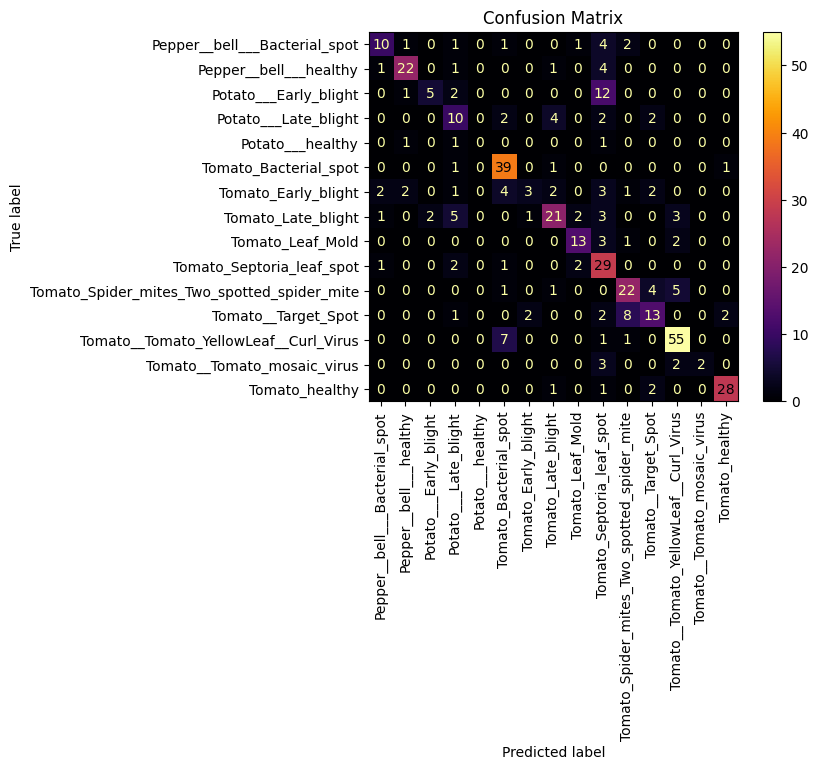

In [ ]:
model = MD_6_CustomCNNWithCustomBN(num_classes=15).cuda()

params={
    'epochs':10,
    'criterion':nn.CrossEntropyLoss(),
    'lr':0.0006,
    'momentum':0.1
}
optimizer = optim.Adam(model.parameters(), lr=params['lr'])

result=training_model(model,params)
Model_Comparison.append(result)

evaluation(model,val_loader,class_labels,result['train_accuracy_list'],result['val_accuracy_list'],true_labels_val, predicted_classes_val, num_classes)

### Model 7 EPS value=1e-7

In [ ]:
class MD_7_CustomBatchNorm2d(nn.Module):
    def __init__(self, num_features, eps=1e-7, momentum=0.1):
        super(MD_7_CustomBatchNorm2d, self).__init__()
        self.num_features = num_features
        self.eps = eps
        self.momentum = momentum
        self.weight = nn.Parameter(torch.ones(1, num_features, 1, 1).cuda())
        self.bias = nn.Parameter(torch.zeros(1, num_features, 1, 1).cuda())
        self.running_mean = torch.zeros(1, num_features, 1, 1).cuda()
        self.running_var = torch.ones(1, num_features, 1, 1).cuda()

    def forward(self, x):
        if self.training:
            mean = x.mean(dim=(0, 2, 3), keepdim=True)
            var = x.var(dim=(0, 2, 3), unbiased=False, keepdim=True)
            self.running_mean = (1 - self.momentum) * self.running_mean + self.momentum * mean
            self.running_var = (1 - self.momentum) * self.running_var + self.momentum * var
        else:
            mean = self.running_mean
            var = self.running_var

        x = (x - mean) / torch.sqrt(var + self.eps)
        x = x * self.weight + self.bias
        return x



class MD_7_CustomCNNWithCustomBN(nn.Module):
    def __init__(self, num_classes):
        self.name='MD_7_CustomCNNWithCustomBN'
        super(MD_7_CustomCNNWithCustomBN, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            MD_7_CustomBatchNorm2d(64),   # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            MD_7_CustomBatchNorm2d(64),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            MD_7_CustomBatchNorm2d(128),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            MD_7_CustomBatchNorm2d(128),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            MD_7_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            MD_7_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            MD_7_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            MD_7_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            MD_7_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            MD_7_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )
        self.avgpool = nn.AdaptiveAvgPool2d((7, 7))
        self.classifier = nn.Sequential(
            nn.Linear(512 * 7 * 7, 4096),
            nn.BatchNorm1d(4096),  # Add batch normalization for fully connected layers
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.BatchNorm1d(4096),  # Add batch normalization for fully connected layers
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.BatchNorm1d(4096),  # Add batch normalization for fully connected layers
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

Epoch [1/10] -Training Loss: 2.3370, Validation Loss: 2.3325, Training Accuracy: 30.46%, Validation Accuracy: 38.54%
Epoch [2/10] -Training Loss: 1.9919, Validation Loss: 2.3440, Training Accuracy: 38.60%, Validation Accuracy: 42.68%
Epoch [3/10] -Training Loss: 1.6688, Validation Loss: 1.5632, Training Accuracy: 48.48%, Validation Accuracy: 51.22%
Epoch [4/10] -Training Loss: 1.6461, Validation Loss: 1.4989, Training Accuracy: 49.72%, Validation Accuracy: 60.24%
Epoch [5/10] -Training Loss: 1.5007, Validation Loss: 1.6876, Training Accuracy: 55.39%, Validation Accuracy: 50.73%
Epoch [6/10] -Training Loss: 1.3119, Validation Loss: 1.0714, Training Accuracy: 61.26%, Validation Accuracy: 67.80%
Epoch [7/10] -Training Loss: 1.2850, Validation Loss: 0.9370, Training Accuracy: 60.98%, Validation Accuracy: 69.51%
Epoch [8/10] -Training Loss: 1.2876, Validation Loss: 1.7301, Training Accuracy: 62.57%, Validation Accuracy: 53.41%
Epoch [9/10] -Training Loss: 1.2166, Validation Loss: 1.2998, Tr

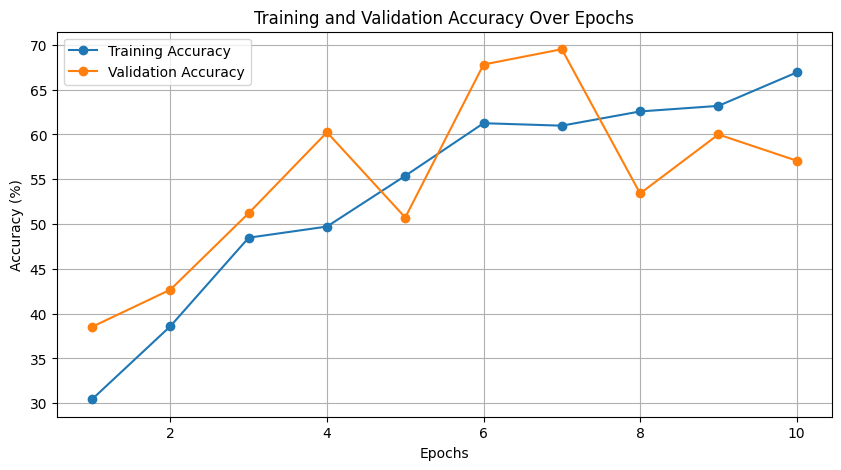

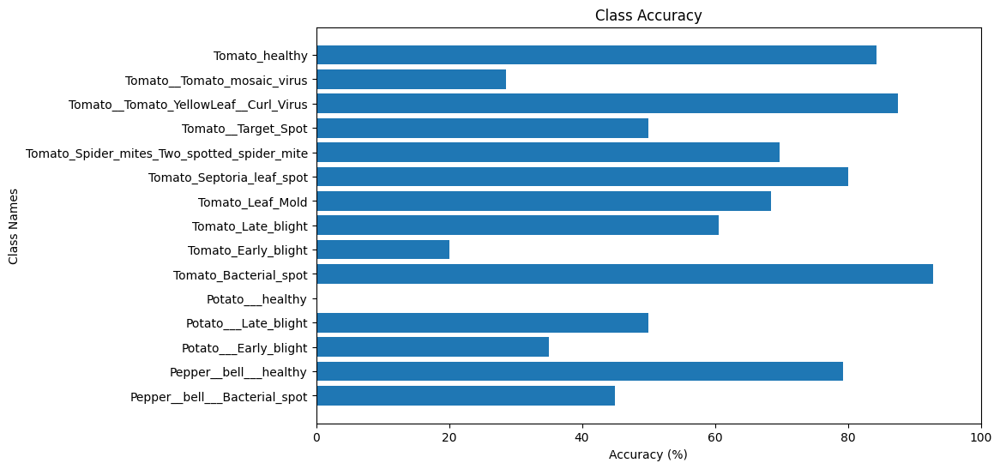

                                    Class_names  Accuracy (%)
0                 Pepper__bell___Bacterial_spot     45.000000
1                        Pepper__bell___healthy     79.310345
2                         Potato___Early_blight     35.000000
3                          Potato___Late_blight     50.000000
4                              Potato___healthy      0.000000
5                         Tomato_Bacterial_spot     92.857143
6                           Tomato_Early_blight     20.000000
7                            Tomato_Late_blight     60.526316
8                              Tomato_Leaf_Mold     68.421053
9                     Tomato_Septoria_leaf_spot     80.000000
10  Tomato_Spider_mites_Two_spotted_spider_mite     69.696970
11                          Tomato__Target_Spot     50.000000
12        Tomato__Tomato_YellowLeaf__Curl_Virus     87.500000
13                  Tomato__Tomato_mosaic_virus     28.571429
14                               Tomato_healthy     84.375000


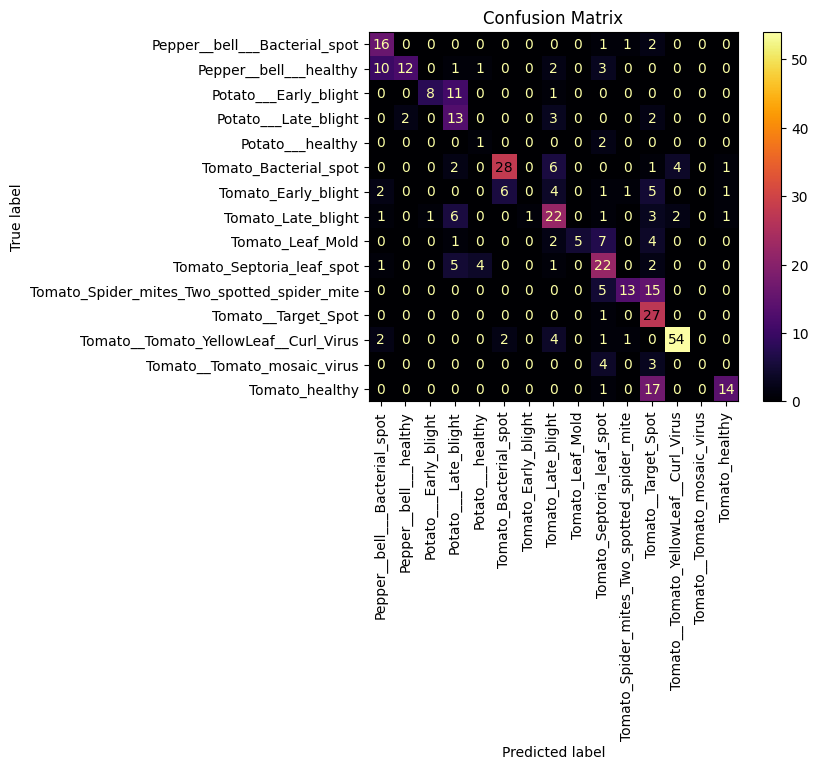

In [ ]:
model = MD_7_CustomCNNWithCustomBN(num_classes=15).cuda()

params={
    'epochs':10,
    'criterion':nn.CrossEntropyLoss(),
    'lr':0.0006,
    'momentum':0.1
}
optimizer = optim.Adam(model.parameters(), lr=params['lr'])

result=training_model(model,params)
Model_Comparison.append(result)

evaluation(model,val_loader,class_labels,result['train_accuracy_list'],result['val_accuracy_list'],true_labels_val, predicted_classes_val, num_classes)

### Model 8 Momentum changed from 0.1 to 0.9

In [ ]:
class MD_8_CustomBatchNorm2d(nn.Module):
    def __init__(self, num_features, eps=1e-7, momentum=0.9):
        super(MD_8_CustomBatchNorm2d, self).__init__()
        self.num_features = num_features
        self.eps = eps
        self.momentum = momentum
        self.weight = nn.Parameter(torch.ones(1, num_features, 1, 1).cuda())
        self.bias = nn.Parameter(torch.zeros(1, num_features, 1, 1).cuda())
        self.running_mean = torch.zeros(1, num_features, 1, 1).cuda()
        self.running_var = torch.ones(1, num_features, 1, 1).cuda()

    def forward(self, x):
        if self.training:
            mean = x.mean(dim=(0, 2, 3), keepdim=True)
            var = x.var(dim=(0, 2, 3), unbiased=False, keepdim=True)
            self.running_mean = (1 - self.momentum) * self.running_mean + self.momentum * mean
            self.running_var = (1 - self.momentum) * self.running_var + self.momentum * var
        else:
            mean = self.running_mean
            var = self.running_var

        x = (x - mean) / torch.sqrt(var + self.eps)
        x = x * self.weight + self.bias
        return x



class MD_8_CustomCNNWithCustomBN(nn.Module):
    def __init__(self, num_classes):
        self.name='MD_8_CustomCNNWithCustomBN'
        super(MD_8_CustomCNNWithCustomBN, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            MD_8_CustomBatchNorm2d(64),   # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            MD_8_CustomBatchNorm2d(64),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            MD_8_CustomBatchNorm2d(128),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            MD_8_CustomBatchNorm2d(128),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            MD_8_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            MD_8_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            MD_8_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            MD_8_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            MD_8_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            MD_8_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )
        self.avgpool = nn.AdaptiveAvgPool2d((7, 7))
        self.classifier = nn.Sequential(
            nn.Linear(512 * 7 * 7, 4096),
            nn.BatchNorm1d(4096),  # Add batch normalization for fully connected layers
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.BatchNorm1d(4096),  # Add batch normalization for fully connected layers
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.BatchNorm1d(4096),  # Add batch normalization for fully connected layers
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

Epoch [1/10] -Training Loss: 2.3368, Validation Loss: 2.1583, Training Accuracy: 31.35%, Validation Accuracy: 43.66%
Epoch [2/10] -Training Loss: 1.8279, Validation Loss: 1.5186, Training Accuracy: 44.96%, Validation Accuracy: 51.22%
Epoch [3/10] -Training Loss: 1.5674, Validation Loss: 1.6085, Training Accuracy: 53.04%, Validation Accuracy: 48.05%
Epoch [4/10] -Training Loss: 1.4702, Validation Loss: 1.0908, Training Accuracy: 53.87%, Validation Accuracy: 63.17%
Epoch [5/10] -Training Loss: 1.3682, Validation Loss: 1.1357, Training Accuracy: 60.01%, Validation Accuracy: 60.98%
Epoch [6/10] -Training Loss: 1.3278, Validation Loss: 1.3094, Training Accuracy: 61.53%, Validation Accuracy: 57.80%
Epoch [7/10] -Training Loss: 1.1436, Validation Loss: 1.2132, Training Accuracy: 65.19%, Validation Accuracy: 57.07%
Epoch [8/10] -Training Loss: 1.1851, Validation Loss: 1.1321, Training Accuracy: 64.30%, Validation Accuracy: 68.29%
Epoch [9/10] -Training Loss: 1.0961, Validation Loss: 0.9134, Tr

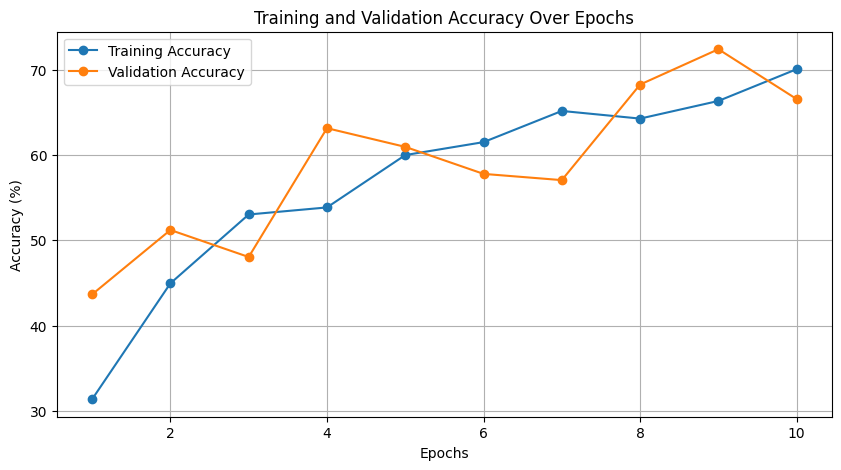

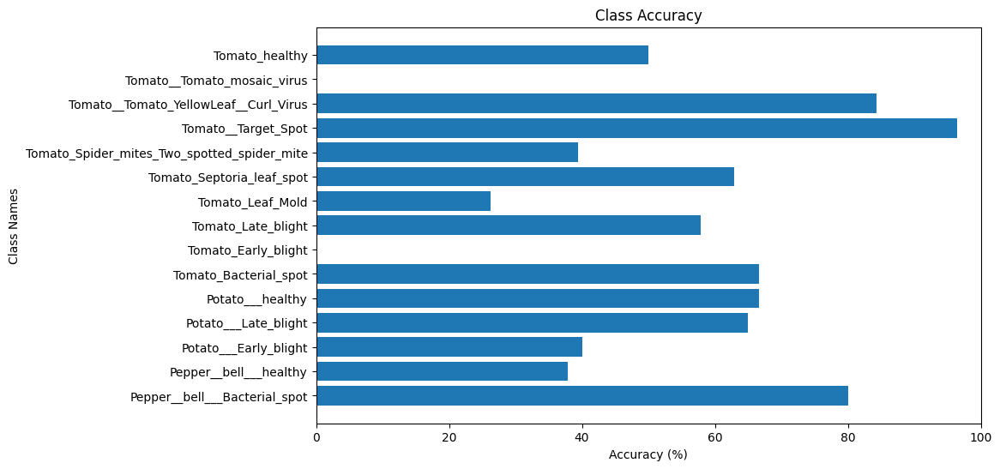

                                    Class_names  Accuracy (%)
0                 Pepper__bell___Bacterial_spot     80.000000
1                        Pepper__bell___healthy     37.931034
2                         Potato___Early_blight     40.000000
3                          Potato___Late_blight     65.000000
4                              Potato___healthy     66.666667
5                         Tomato_Bacterial_spot     66.666667
6                           Tomato_Early_blight      0.000000
7                            Tomato_Late_blight     57.894737
8                              Tomato_Leaf_Mold     26.315789
9                     Tomato_Septoria_leaf_spot     62.857143
10  Tomato_Spider_mites_Two_spotted_spider_mite     39.393939
11                          Tomato__Target_Spot     96.428571
12        Tomato__Tomato_YellowLeaf__Curl_Virus     84.375000
13                  Tomato__Tomato_mosaic_virus      0.000000
14                               Tomato_healthy     50.000000


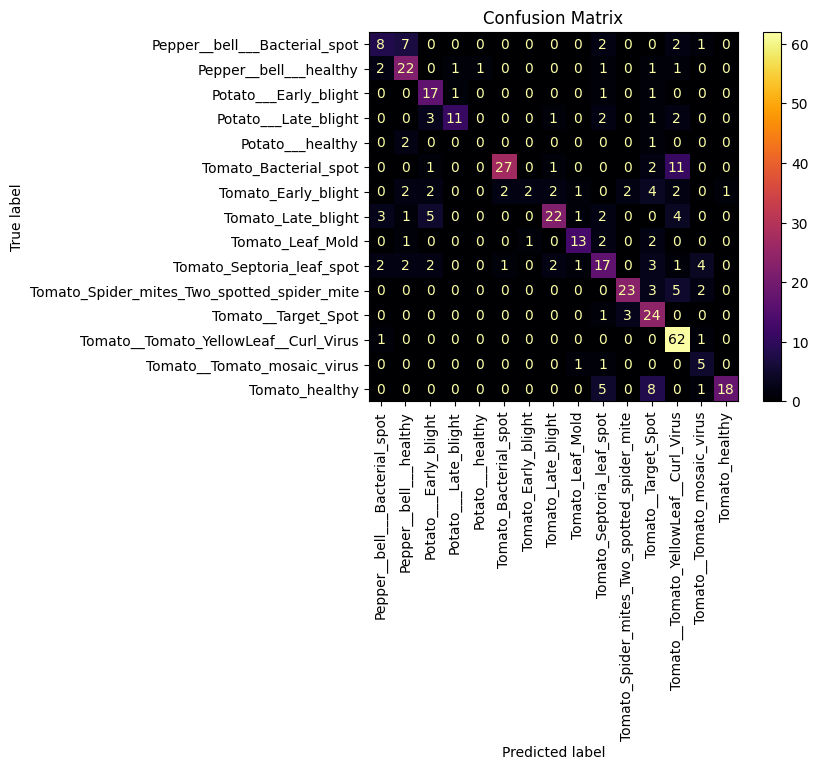

In [ ]:
model = MD_8_CustomCNNWithCustomBN(num_classes=15).cuda()

params={
    'epochs':10,
    'criterion':nn.CrossEntropyLoss(),
    'lr':0.0006,
    'momentum':0.1
}
optimizer = optim.Adam(model.parameters(), lr=params['lr'])

result=training_model(model,params)
Model_Comparison.append(result)

evaluation(model,val_loader,class_labels,result['train_accuracy_list'],result['val_accuracy_list'],true_labels_val, predicted_classes_val, num_classes)

### Model 9 Momentum Set to 0.5

In [ ]:
class MD_9_CustomBatchNorm2d(nn.Module):
    def __init__(self, num_features, eps=1e-7, momentum=0.5):
        super(MD_9_CustomBatchNorm2d, self).__init__()
        self.num_features = num_features
        self.eps = eps
        self.momentum = momentum
        self.weight = nn.Parameter(torch.ones(1, num_features, 1, 1).cuda())
        self.bias = nn.Parameter(torch.zeros(1, num_features, 1, 1).cuda())
        self.running_mean = torch.zeros(1, num_features, 1, 1).cuda()
        self.running_var = torch.ones(1, num_features, 1, 1).cuda()

    def forward(self, x):
        if self.training:
            mean = x.mean(dim=(0, 2, 3), keepdim=True)
            var = x.var(dim=(0, 2, 3), unbiased=False, keepdim=True)
            self.running_mean = (1 - self.momentum) * self.running_mean + self.momentum * mean
            self.running_var = (1 - self.momentum) * self.running_var + self.momentum * var
        else:
            mean = self.running_mean
            var = self.running_var

        x = (x - mean) / torch.sqrt(var + self.eps)
        x = x * self.weight + self.bias
        return x



class MD_9_CustomCNNWithCustomBN(nn.Module):
    def __init__(self, num_classes):
        self.name='MD_9_CustomCNNWithCustomBN'
        super(MD_9_CustomCNNWithCustomBN, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            MD_9_CustomBatchNorm2d(64),   # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            MD_9_CustomBatchNorm2d(64),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            MD_9_CustomBatchNorm2d(128),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            MD_9_CustomBatchNorm2d(128),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            MD_9_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            MD_9_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            MD_9_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            MD_9_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            MD_9_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            MD_9_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )
        self.avgpool = nn.AdaptiveAvgPool2d((7, 7))
        self.classifier = nn.Sequential(
            nn.Linear(512 * 7 * 7, 4096),
            nn.BatchNorm1d(4096),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.BatchNorm1d(4096),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.BatchNorm1d(4096),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

Epoch [1/10] -Training Loss: 2.3490, Validation Loss: 1.5383, Training Accuracy: 33.29%, Validation Accuracy: 50.98%
Epoch [2/10] -Training Loss: 1.8790, Validation Loss: 1.9478, Training Accuracy: 47.03%, Validation Accuracy: 41.22%
Epoch [3/10] -Training Loss: 1.8287, Validation Loss: 1.5839, Training Accuracy: 50.21%, Validation Accuracy: 52.44%
Epoch [4/10] -Training Loss: 1.5261, Validation Loss: 1.0716, Training Accuracy: 56.49%, Validation Accuracy: 64.63%
Epoch [5/10] -Training Loss: 1.3893, Validation Loss: 1.3421, Training Accuracy: 57.94%, Validation Accuracy: 59.51%
Epoch [6/10] -Training Loss: 1.3150, Validation Loss: 1.2859, Training Accuracy: 59.81%, Validation Accuracy: 59.76%
Epoch [7/10] -Training Loss: 1.3871, Validation Loss: 1.1192, Training Accuracy: 58.98%, Validation Accuracy: 62.20%
Epoch [8/10] -Training Loss: 1.3692, Validation Loss: 1.0471, Training Accuracy: 61.53%, Validation Accuracy: 65.37%
Epoch [9/10] -Training Loss: 1.1131, Validation Loss: 0.8438, Tr

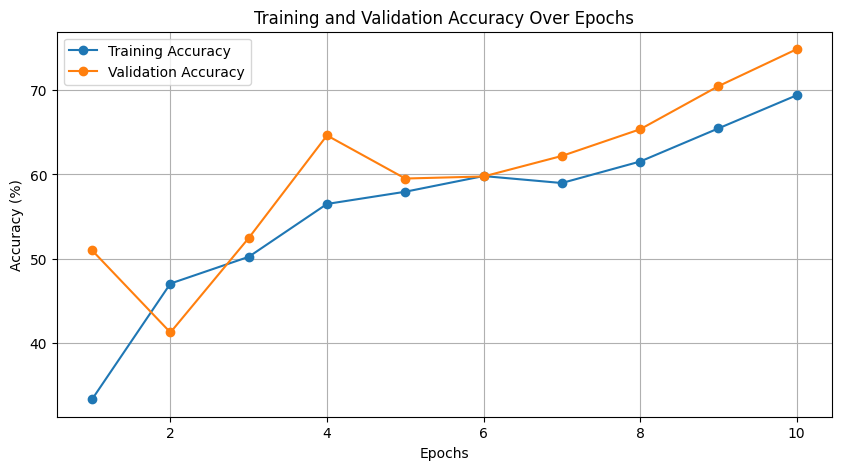

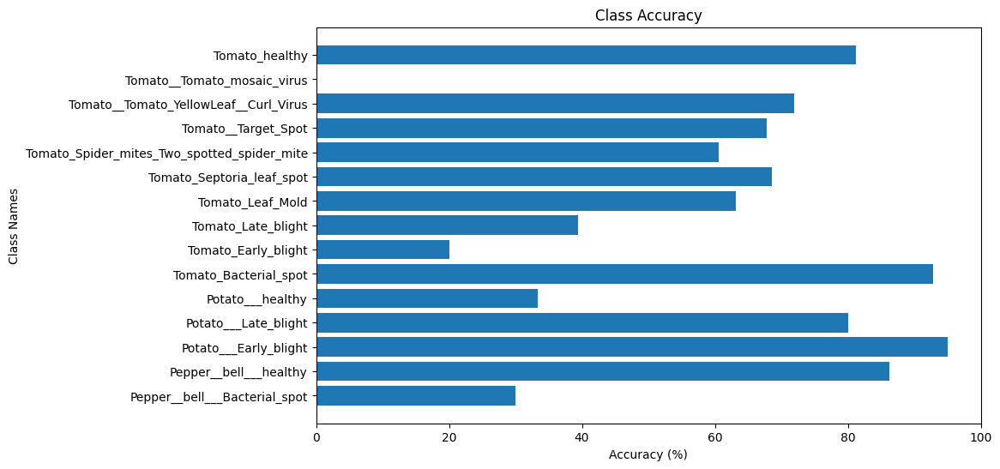

                                    Class_names  Accuracy (%)
0                 Pepper__bell___Bacterial_spot     30.000000
1                        Pepper__bell___healthy     86.206897
2                         Potato___Early_blight     95.000000
3                          Potato___Late_blight     80.000000
4                              Potato___healthy     33.333333
5                         Tomato_Bacterial_spot     92.857143
6                           Tomato_Early_blight     20.000000
7                            Tomato_Late_blight     39.473684
8                              Tomato_Leaf_Mold     63.157895
9                     Tomato_Septoria_leaf_spot     68.571429
10  Tomato_Spider_mites_Two_spotted_spider_mite     60.606061
11                          Tomato__Target_Spot     67.857143
12        Tomato__Tomato_YellowLeaf__Curl_Virus     71.875000
13                  Tomato__Tomato_mosaic_virus      0.000000
14                               Tomato_healthy     81.250000


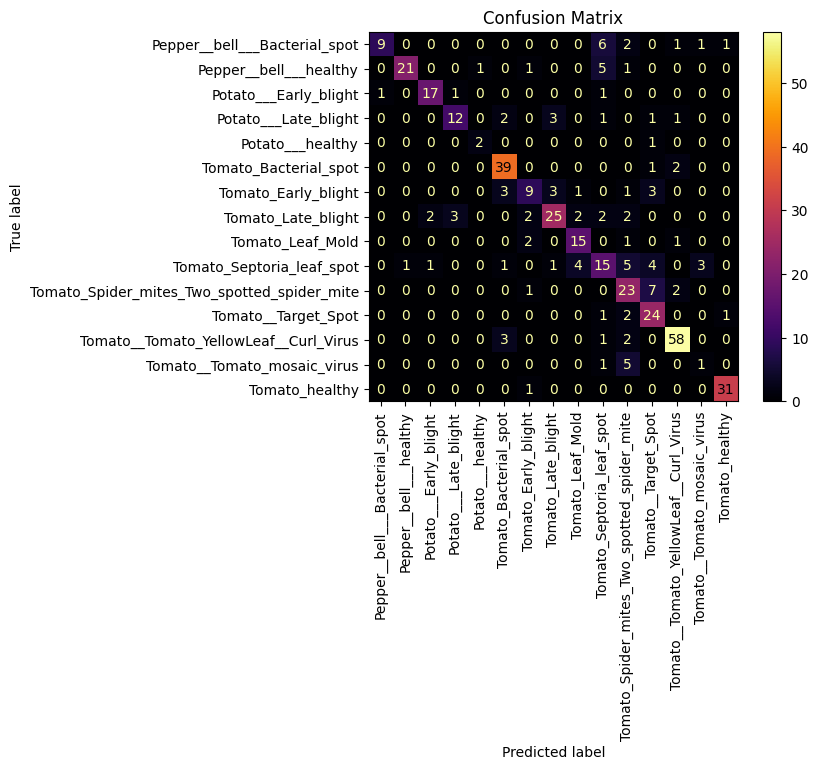

In [ ]:
model = MD_9_CustomCNNWithCustomBN(num_classes=15).cuda()

params={
    'epochs':10,
    'criterion':nn.CrossEntropyLoss(),
    'lr':0.0006,
    'momentum':0.1
}
optimizer = optim.Adam(model.parameters(), lr=params['lr'])

result=training_model(model,params)
# Model_Comparison.append(result)

evaluation(model,val_loader,class_labels,result['train_accuracy_list'],result['val_accuracy_list'],true_labels_val, predicted_classes_val, num_classes)

## 5.3 Green Chanel Enhancement

### Model 10 Green Channel * 2

In [ ]:
class MD_10_CustomGreenEnhancementLayer(nn.Module):
    def __init__(self):
        super(MD_10_CustomGreenEnhancementLayer, self).__init__()

    def forward(self, x):

        green_channel = x[:, 1, :, :].clone()
        x[:, 1, :, :] = green_channel * 2.0
        return x

class MD_10_CustomBatchNorm2d(nn.Module):
    def __init__(self, num_features, eps=1e-7, momentum=0.1):
        super(MD_10_CustomBatchNorm2d, self).__init__()
        self.num_features = num_features
        self.eps = eps
        self.momentum = momentum
        self.weight = nn.Parameter(torch.ones(1, num_features, 1, 1).cuda())  # Move weight to GPU
        self.bias = nn.Parameter(torch.zeros(1, num_features, 1, 1).cuda())  # Move bias to GPU
        self.running_mean = torch.zeros(1, num_features, 1, 1).cuda()  # Move running_mean to GPU
        self.running_var = torch.ones(1, num_features, 1, 1).cuda()  # Move running_var to GPU

    def forward(self, x):
        if self.training:
            mean = x.mean(dim=(0, 2, 3), keepdim=True)
            var = x.var(dim=(0, 2, 3), unbiased=False, keepdim=True)
            self.running_mean = (1 - self.momentum) * self.running_mean + self.momentum * mean
            self.running_var = (1 - self.momentum) * self.running_var + self.momentum * var
        else:
            mean = self.running_mean
            var = self.running_var

        x = (x - mean) / torch.sqrt(var + self.eps)
        x = x * self.weight + self.bias
        return x

class MD_10_CustomCNNWithColorTransform(nn.Module):
    def __init__(self, num_classes):
        self.name='MD_10_CustomCNNWithColorTransform'
        super(MD_10_CustomCNNWithColorTransform, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            MD_10_CustomBatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            MD_10_CustomBatchNorm2d(64),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            MD_10_CustomBatchNorm2d(128),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            MD_10_CustomBatchNorm2d(128),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            MD_10_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            MD_10_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            MD_10_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            MD_10_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            MD_10_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            MD_10_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            MD_10_CustomGreenEnhancementLayer()
        )
        self.avgpool = nn.AdaptiveAvgPool2d((7, 7))
        self.classifier = nn.Sequential(
            nn.Linear(512 * 7 * 7, 4096),
            nn.BatchNorm1d(4096),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.BatchNorm1d(4096),  # Add batch normalization for fully connected layers
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.BatchNorm1d(4096),  # Add batch normalization for fully connected layers
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

Epoch [1/10] -Training Loss: 1.6783, Validation Loss: 1.1002, Training Accuracy: 46.48%, Validation Accuracy: 64.15%
Epoch [2/10] -Training Loss: 1.1206, Validation Loss: 1.1043, Training Accuracy: 64.09%, Validation Accuracy: 64.39%
Epoch [3/10] -Training Loss: 0.9771, Validation Loss: 0.8577, Training Accuracy: 67.54%, Validation Accuracy: 70.73%
Epoch [4/10] -Training Loss: 0.8426, Validation Loss: 0.8441, Training Accuracy: 72.24%, Validation Accuracy: 73.17%
Epoch [5/10] -Training Loss: 0.7210, Validation Loss: 0.5993, Training Accuracy: 76.10%, Validation Accuracy: 80.73%
Epoch [6/10] -Training Loss: 0.6163, Validation Loss: 0.6648, Training Accuracy: 79.56%, Validation Accuracy: 75.61%
Epoch [7/10] -Training Loss: 0.6255, Validation Loss: 0.7316, Training Accuracy: 79.01%, Validation Accuracy: 75.61%
Epoch [8/10] -Training Loss: 0.5728, Validation Loss: 0.6636, Training Accuracy: 80.80%, Validation Accuracy: 77.56%
Epoch [9/10] -Training Loss: 0.4864, Validation Loss: 0.4508, Tr

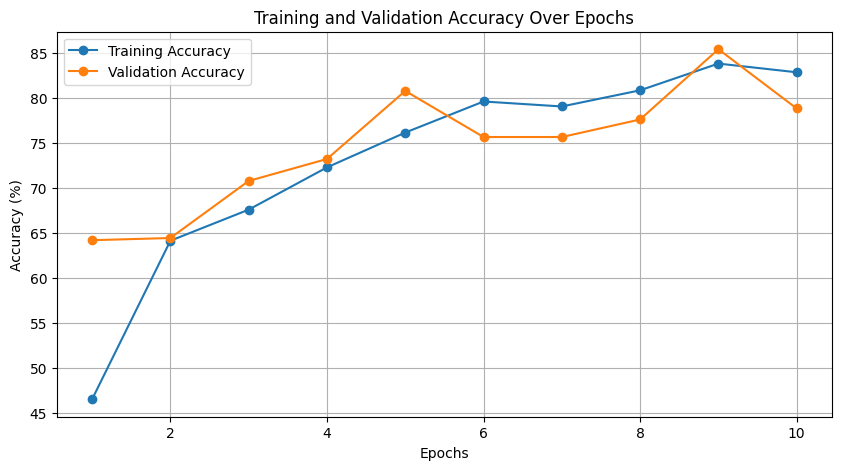

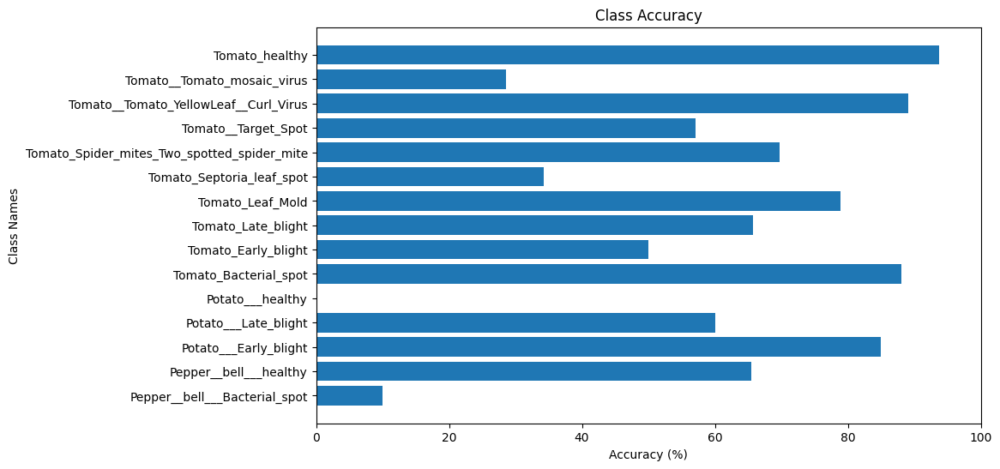

                                    Class_names  Accuracy (%)
0                 Pepper__bell___Bacterial_spot     10.000000
1                        Pepper__bell___healthy     65.517241
2                         Potato___Early_blight     85.000000
3                          Potato___Late_blight     60.000000
4                              Potato___healthy      0.000000
5                         Tomato_Bacterial_spot     88.095238
6                           Tomato_Early_blight     50.000000
7                            Tomato_Late_blight     65.789474
8                              Tomato_Leaf_Mold     78.947368
9                     Tomato_Septoria_leaf_spot     34.285714
10  Tomato_Spider_mites_Two_spotted_spider_mite     69.696970
11                          Tomato__Target_Spot     57.142857
12        Tomato__Tomato_YellowLeaf__Curl_Virus     89.062500
13                  Tomato__Tomato_mosaic_virus     28.571429
14                               Tomato_healthy     93.750000


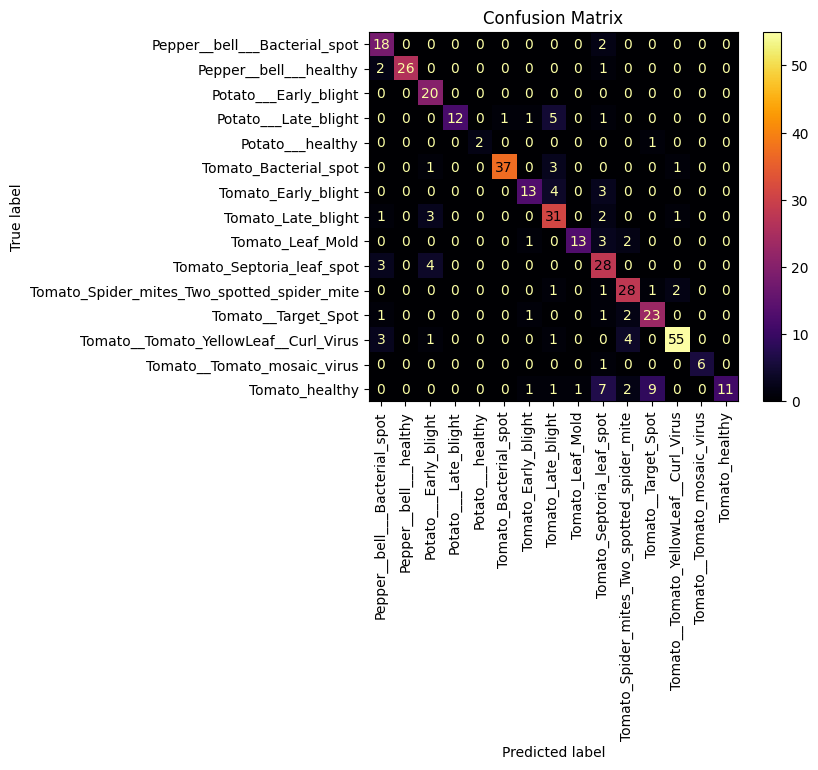

In [ ]:
model = MD_10_CustomCNNWithColorTransform(num_classes=15).cuda()

params={
    'epochs':10,
    'criterion':nn.CrossEntropyLoss(),
    'lr':0.0001,
    'momentum':0.1
}
optimizer = optim.Adam(model.parameters(), lr=params['lr'])

result=training_model(model,params)
Model_Comparison.append(result)

evaluation(model,val_loader,class_labels,result['train_accuracy_list'],result['val_accuracy_list'],true_labels_val, predicted_classes_val, num_classes)

### Model 11 Green Channel * 5

In [ ]:
class MD_11_CustomGreenEnhancementLayer(nn.Module):
    def __init__(self):
        super(MD_11_CustomGreenEnhancementLayer, self).__init__()

    def forward(self, x):
        green_channel = x[:, 1, :, :].clone()
        x[:, 1, :, :] = green_channel * 5.0
        return x

class MD_11_CustomBatchNorm2d(nn.Module):
    def __init__(self, num_features, eps=1e-7, momentum=0.1):
        super(MD_11_CustomBatchNorm2d, self).__init__()
        self.num_features = num_features
        self.eps = eps
        self.momentum = momentum
        self.weight = nn.Parameter(torch.ones(1, num_features, 1, 1).cuda())  # Move weight to GPU
        self.bias = nn.Parameter(torch.zeros(1, num_features, 1, 1).cuda())  # Move bias to GPU
        self.running_mean = torch.zeros(1, num_features, 1, 1).cuda()  # Move running_mean to GPU
        self.running_var = torch.ones(1, num_features, 1, 1).cuda()  # Move running_var to GPU

    def forward(self, x):
        if self.training:
            mean = x.mean(dim=(0, 2, 3), keepdim=True)
            var = x.var(dim=(0, 2, 3), unbiased=False, keepdim=True)
            self.running_mean = (1 - self.momentum) * self.running_mean + self.momentum * mean
            self.running_var = (1 - self.momentum) * self.running_var + self.momentum * var
        else:
            mean = self.running_mean
            var = self.running_var

        x = (x - mean) / torch.sqrt(var + self.eps)
        x = x * self.weight + self.bias
        return x

class MD_11_CustomCNNWithColorTransform(nn.Module):
    def __init__(self, num_classes):
        self.name='MD_11_CustomCNNWithColorTransform'
        super(MD_11_CustomCNNWithColorTransform, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            MD_11_CustomBatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            MD_11_CustomBatchNorm2d(64),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            MD_11_CustomBatchNorm2d(128),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            MD_11_CustomBatchNorm2d(128),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            MD_11_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            MD_11_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            MD_11_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            MD_11_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            MD_11_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            MD_11_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            MD_11_CustomGreenEnhancementLayer()
        )
        self.avgpool = nn.AdaptiveAvgPool2d((7, 7))
        self.classifier = nn.Sequential(
            nn.Linear(512 * 7 * 7, 4096),
            nn.BatchNorm1d(4096),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.BatchNorm1d(4096),  # Add batch normalization for fully connected layers
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.BatchNorm1d(4096),  # Add batch normalization for fully connected layers
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

Epoch [1/10] -Training Loss: 1.7016, Validation Loss: 1.2050, Training Accuracy: 46.48%, Validation Accuracy: 59.51%
Epoch [2/10] -Training Loss: 1.1277, Validation Loss: 0.8671, Training Accuracy: 64.78%, Validation Accuracy: 69.27%
Epoch [3/10] -Training Loss: 0.9235, Validation Loss: 0.7983, Training Accuracy: 68.72%, Validation Accuracy: 71.95%
Epoch [4/10] -Training Loss: 0.8786, Validation Loss: 0.7532, Training Accuracy: 72.10%, Validation Accuracy: 75.12%
Epoch [5/10] -Training Loss: 0.7429, Validation Loss: 0.8533, Training Accuracy: 76.17%, Validation Accuracy: 71.46%
Epoch [6/10] -Training Loss: 0.6791, Validation Loss: 0.7398, Training Accuracy: 77.69%, Validation Accuracy: 74.88%
Epoch [7/10] -Training Loss: 0.6238, Validation Loss: 0.7214, Training Accuracy: 78.80%, Validation Accuracy: 76.83%
Epoch [8/10] -Training Loss: 0.5819, Validation Loss: 0.5829, Training Accuracy: 81.49%, Validation Accuracy: 81.46%
Epoch [9/10] -Training Loss: 0.5040, Validation Loss: 0.7495, Tr

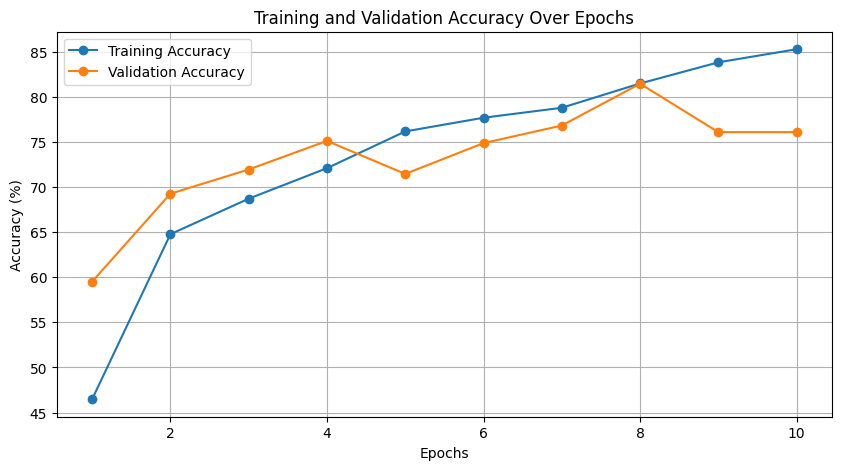

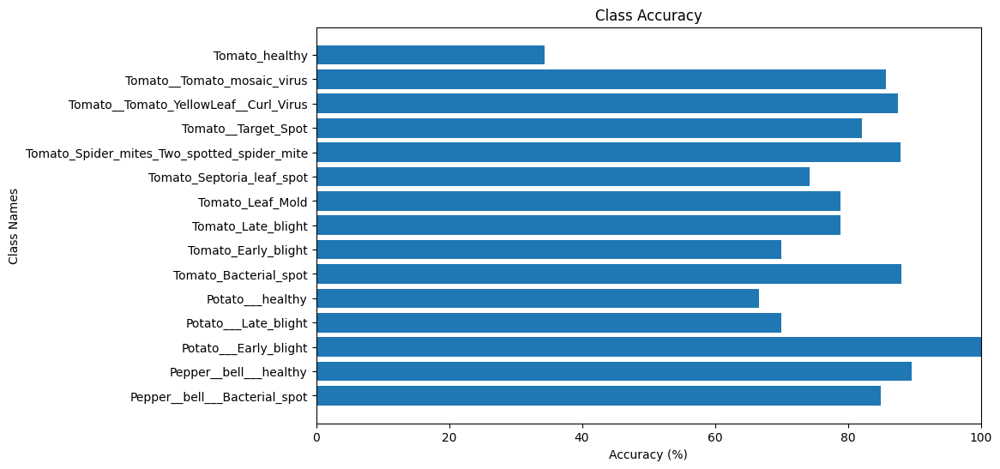

                                    Class_names  Accuracy (%)
0                 Pepper__bell___Bacterial_spot     85.000000
1                        Pepper__bell___healthy     89.655172
2                         Potato___Early_blight    100.000000
3                          Potato___Late_blight     70.000000
4                              Potato___healthy     66.666667
5                         Tomato_Bacterial_spot     88.095238
6                           Tomato_Early_blight     70.000000
7                            Tomato_Late_blight     78.947368
8                              Tomato_Leaf_Mold     78.947368
9                     Tomato_Septoria_leaf_spot     74.285714
10  Tomato_Spider_mites_Two_spotted_spider_mite     87.878788
11                          Tomato__Target_Spot     82.142857
12        Tomato__Tomato_YellowLeaf__Curl_Virus     87.500000
13                  Tomato__Tomato_mosaic_virus     85.714286
14                               Tomato_healthy     34.375000


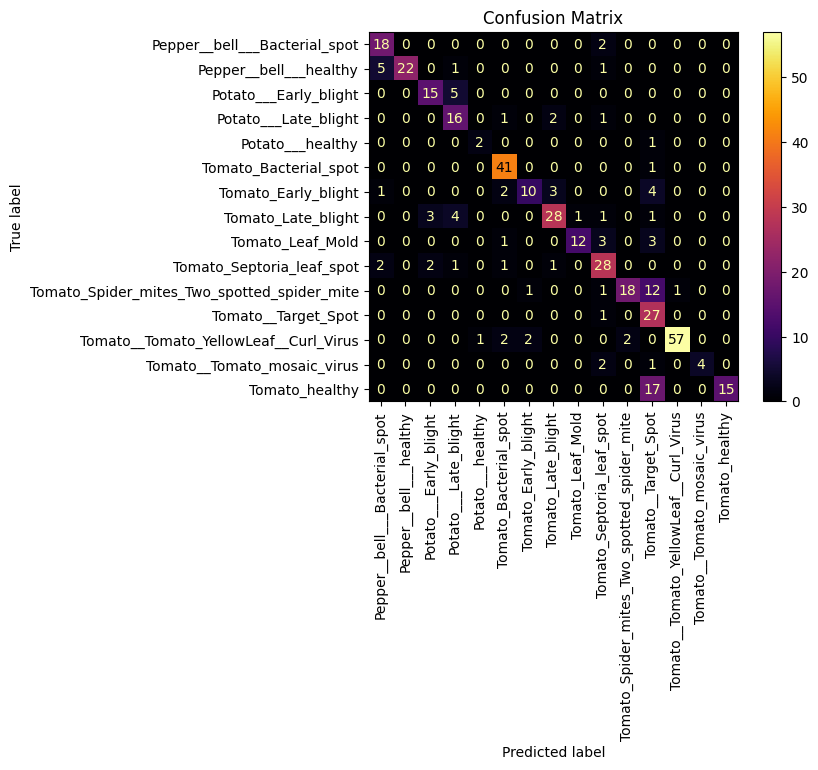

In [ ]:
model = MD_11_CustomCNNWithColorTransform(num_classes=15).cuda()

params={
    'epochs':10,
    'criterion':nn.CrossEntropyLoss(),
    'lr':0.0001,
    'momentum':0.1
}
optimizer = optim.Adam(model.parameters(), lr=params['lr'])

result=training_model(model,params)
Model_Comparison.append(result)

evaluation(model,val_loader,class_labels,result['train_accuracy_list'],result['val_accuracy_list'],true_labels_val, predicted_classes_val, num_classes)

### Model 12 Green Channel squared




In [ ]:
# square

class MD_12_CustomGreenEnhancementLayer(nn.Module):
    def __init__(self):
        super(MD_12_CustomGreenEnhancementLayer, self).__init__()

    def forward(self, x):
        green_channel = x[:, 1, :, :].clone()
        x[:, 1, :, :] = green_channel ** 2.0
        return x

class MD_12_CustomBatchNorm2d(nn.Module):
    def __init__(self, num_features, eps=1e-7, momentum=0.1):
        super(MD_12_CustomBatchNorm2d, self).__init__()
        self.num_features = num_features
        self.eps = eps
        self.momentum = momentum
        self.weight = nn.Parameter(torch.ones(1, num_features, 1, 1).cuda()) 
        self.bias = nn.Parameter(torch.zeros(1, num_features, 1, 1).cuda())  
        self.running_mean = torch.zeros(1, num_features, 1, 1).cuda() 
        self.running_var = torch.ones(1, num_features, 1, 1).cuda() 

    def forward(self, x):
        if self.training:
            mean = x.mean(dim=(0, 2, 3), keepdim=True)
            var = x.var(dim=(0, 2, 3), unbiased=False, keepdim=True)
            self.running_mean = (1 - self.momentum) * self.running_mean + self.momentum * mean
            self.running_var = (1 - self.momentum) * self.running_var + self.momentum * var
        else:
            mean = self.running_mean
            var = self.running_var

        x = (x - mean) / torch.sqrt(var + self.eps)
        x = x * self.weight + self.bias
        return x

class MD_12_CustomCNNWithColorTransform(nn.Module):
    def __init__(self, num_classes):
        self.name='MD_12_CustomCNNWithColorTransform'
        super(MD_12_CustomCNNWithColorTransform, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            MD_12_CustomBatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            MD_12_CustomBatchNorm2d(64),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            MD_12_CustomBatchNorm2d(128),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            MD_12_CustomBatchNorm2d(128),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            MD_12_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            MD_12_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            MD_12_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            MD_12_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            MD_12_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            MD_12_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            MD_12_CustomGreenEnhancementLayer()
        )
        self.avgpool = nn.AdaptiveAvgPool2d((7, 7))
        self.classifier = nn.Sequential(
            nn.Linear(512 * 7 * 7, 4096),
            nn.BatchNorm1d(4096),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.BatchNorm1d(4096),  # Add batch normalization for fully connected layers
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.BatchNorm1d(4096),  # Add batch normalization for fully connected layers
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

Epoch [1/10] -Training Loss: 1.8002, Validation Loss: 1.2839, Training Accuracy: 43.30%, Validation Accuracy: 59.02%
Epoch [2/10] -Training Loss: 1.2344, Validation Loss: 1.2568, Training Accuracy: 59.94%, Validation Accuracy: 63.17%
Epoch [3/10] -Training Loss: 1.0066, Validation Loss: 0.8977, Training Accuracy: 68.23%, Validation Accuracy: 69.76%
Epoch [4/10] -Training Loss: 0.8758, Validation Loss: 0.9670, Training Accuracy: 71.13%, Validation Accuracy: 69.76%
Epoch [5/10] -Training Loss: 0.8243, Validation Loss: 1.1637, Training Accuracy: 73.20%, Validation Accuracy: 65.85%
Epoch [6/10] -Training Loss: 0.6790, Validation Loss: 0.5906, Training Accuracy: 77.49%, Validation Accuracy: 77.80%
Epoch [7/10] -Training Loss: 0.5900, Validation Loss: 0.5396, Training Accuracy: 81.22%, Validation Accuracy: 81.71%
Epoch [8/10] -Training Loss: 0.5758, Validation Loss: 0.6582, Training Accuracy: 80.39%, Validation Accuracy: 78.05%
Epoch [9/10] -Training Loss: 0.4909, Validation Loss: 0.4427, Tr

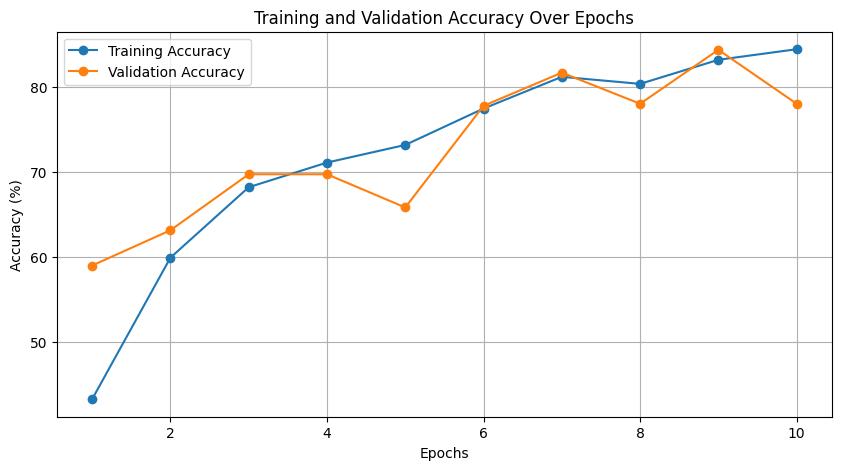

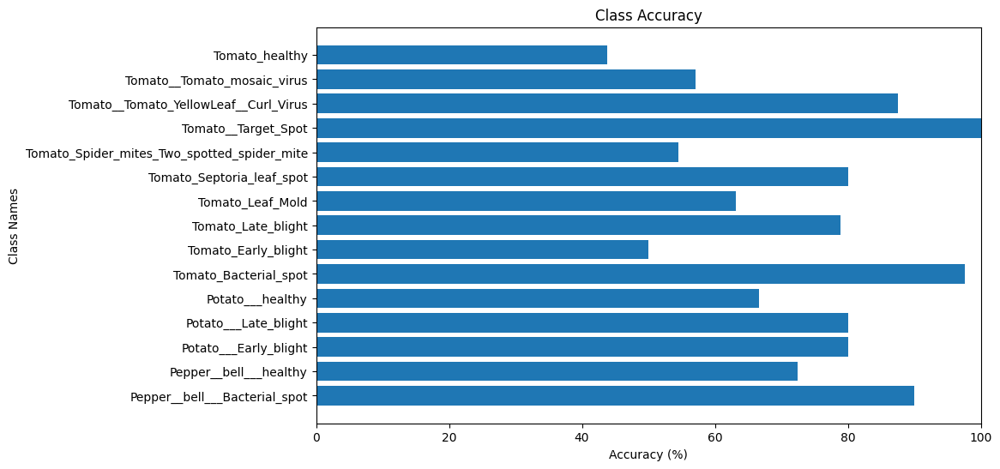

                                    Class_names  Accuracy (%)
0                 Pepper__bell___Bacterial_spot     90.000000
1                        Pepper__bell___healthy     72.413793
2                         Potato___Early_blight     80.000000
3                          Potato___Late_blight     80.000000
4                              Potato___healthy     66.666667
5                         Tomato_Bacterial_spot     97.619048
6                           Tomato_Early_blight     50.000000
7                            Tomato_Late_blight     78.947368
8                              Tomato_Leaf_Mold     63.157895
9                     Tomato_Septoria_leaf_spot     80.000000
10  Tomato_Spider_mites_Two_spotted_spider_mite     54.545455
11                          Tomato__Target_Spot    100.000000
12        Tomato__Tomato_YellowLeaf__Curl_Virus     87.500000
13                  Tomato__Tomato_mosaic_virus     57.142857
14                               Tomato_healthy     43.750000


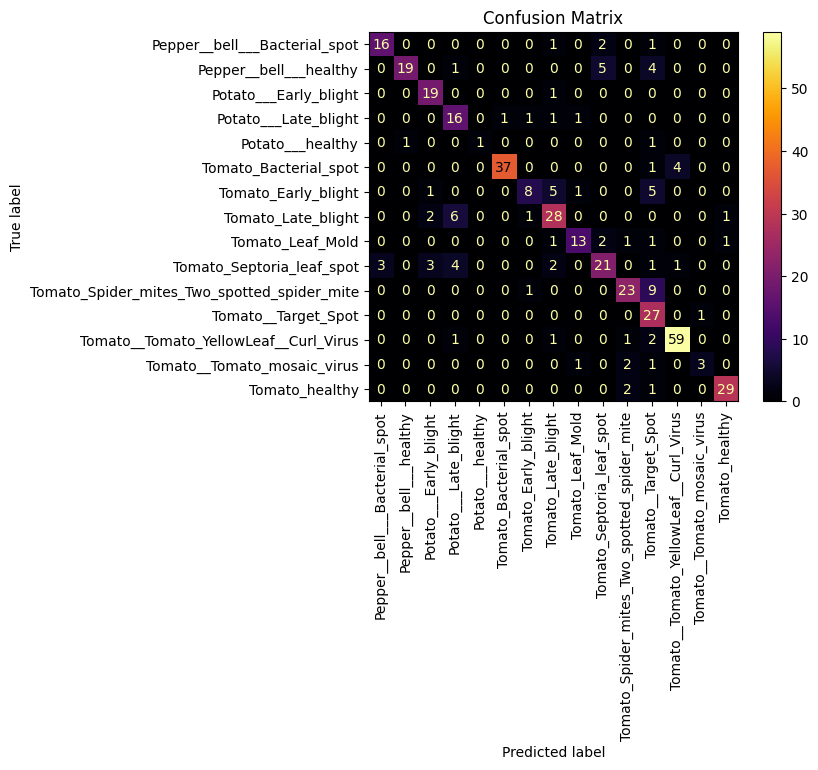

In [ ]:
model = MD_12_CustomCNNWithColorTransform(num_classes=15).cuda()

params={
    'epochs':10,
    'criterion':nn.CrossEntropyLoss(),
    'lr':0.0001,
    'momentum':0.1
}
optimizer = optim.Adam(model.parameters(), lr=params['lr'])

result=training_model(model,params)
Model_Comparison.append(result)

evaluation(model,val_loader,class_labels,result['train_accuracy_list'],result['val_accuracy_list'],true_labels_val, predicted_classes_val, num_classes)

### Model 13 Green Channel cubed

In [ ]:
# cube

class MD_13_CustomGreenEnhancementLayer(nn.Module):
    def __init__(self):
        super(MD_13_CustomGreenEnhancementLayer, self).__init__()

    def forward(self, x):

        green_channel = x[:, 1, :, :].clone()
        x[:, 1, :, :] = green_channel ** 3.0
        return x

class MD_13_CustomBatchNorm2d(nn.Module):
    def __init__(self, num_features, eps=1e-7, momentum=0.1):
        super(MD_13_CustomBatchNorm2d, self).__init__()
        self.num_features = num_features
        self.eps = eps
        self.momentum = momentum
        self.weight = nn.Parameter(torch.ones(1, num_features, 1, 1).cuda())  # Move weight to GPU
        self.bias = nn.Parameter(torch.zeros(1, num_features, 1, 1).cuda())  # Move bias to GPU
        self.running_mean = torch.zeros(1, num_features, 1, 1).cuda()  # Move running_mean to GPU
        self.running_var = torch.ones(1, num_features, 1, 1).cuda()  # Move running_var to GPU

    def forward(self, x):
        if self.training:
            mean = x.mean(dim=(0, 2, 3), keepdim=True)
            var = x.var(dim=(0, 2, 3), unbiased=False, keepdim=True)
            self.running_mean = (1 - self.momentum) * self.running_mean + self.momentum * mean
            self.running_var = (1 - self.momentum) * self.running_var + self.momentum * var
        else:
            mean = self.running_mean
            var = self.running_var

        x = (x - mean) / torch.sqrt(var + self.eps)
        x = x * self.weight + self.bias
        return x

class MD_13_CustomCNNWithColorTransform(nn.Module):
    def __init__(self, num_classes):
        self.name='MD_13_CustomCNNWithColorTransform'
        super(MD_13_CustomCNNWithColorTransform, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            MD_13_CustomBatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            MD_13_CustomBatchNorm2d(64),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            MD_13_CustomBatchNorm2d(128),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            MD_13_CustomBatchNorm2d(128),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            MD_13_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            MD_13_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            MD_13_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            MD_13_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            MD_13_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            MD_13_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            MD_13_CustomGreenEnhancementLayer()
        )
        self.avgpool = nn.AdaptiveAvgPool2d((7, 7))
        self.classifier = nn.Sequential(
            nn.Linear(512 * 7 * 7, 4096),
            nn.BatchNorm1d(4096),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.BatchNorm1d(4096),  # Add batch normalization for fully connected layers
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.BatchNorm1d(4096),  # Add batch normalization for fully connected layers
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

Epoch [1/10] -Training Loss: 1.7741, Validation Loss: 1.1477, Training Accuracy: 44.61%, Validation Accuracy: 65.12%
Epoch [2/10] -Training Loss: 1.1780, Validation Loss: 0.8587, Training Accuracy: 62.09%, Validation Accuracy: 71.22%
Epoch [3/10] -Training Loss: 0.9996, Validation Loss: 0.9370, Training Accuracy: 68.37%, Validation Accuracy: 70.49%
Epoch [4/10] -Training Loss: 0.8799, Validation Loss: 0.8911, Training Accuracy: 70.72%, Validation Accuracy: 70.49%
Epoch [5/10] -Training Loss: 0.7929, Validation Loss: 0.8853, Training Accuracy: 73.34%, Validation Accuracy: 70.49%
Epoch [6/10] -Training Loss: 0.7120, Validation Loss: 0.6779, Training Accuracy: 76.24%, Validation Accuracy: 78.54%
Epoch [7/10] -Training Loss: 0.6241, Validation Loss: 0.7316, Training Accuracy: 79.63%, Validation Accuracy: 75.61%
Epoch [8/10] -Training Loss: 0.5573, Validation Loss: 0.7445, Training Accuracy: 81.56%, Validation Accuracy: 75.12%
Epoch [9/10] -Training Loss: 0.5266, Validation Loss: 0.5932, Tr

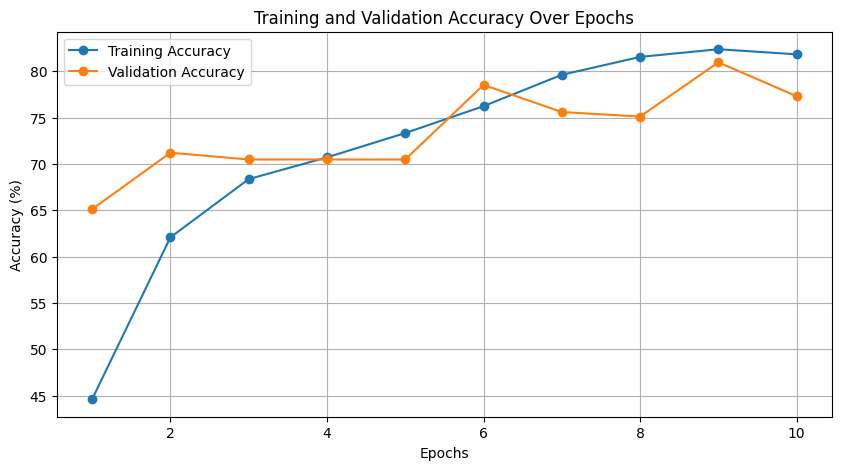

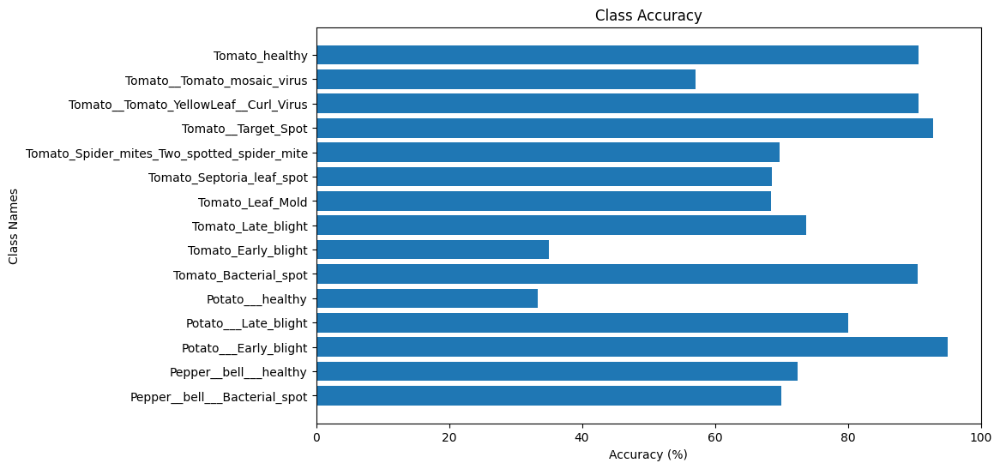

                                    Class_names  Accuracy (%)
0                 Pepper__bell___Bacterial_spot     70.000000
1                        Pepper__bell___healthy     72.413793
2                         Potato___Early_blight     95.000000
3                          Potato___Late_blight     80.000000
4                              Potato___healthy     33.333333
5                         Tomato_Bacterial_spot     90.476190
6                           Tomato_Early_blight     35.000000
7                            Tomato_Late_blight     73.684211
8                              Tomato_Leaf_Mold     68.421053
9                     Tomato_Septoria_leaf_spot     68.571429
10  Tomato_Spider_mites_Two_spotted_spider_mite     69.696970
11                          Tomato__Target_Spot     92.857143
12        Tomato__Tomato_YellowLeaf__Curl_Virus     90.625000
13                  Tomato__Tomato_mosaic_virus     57.142857
14                               Tomato_healthy     90.625000


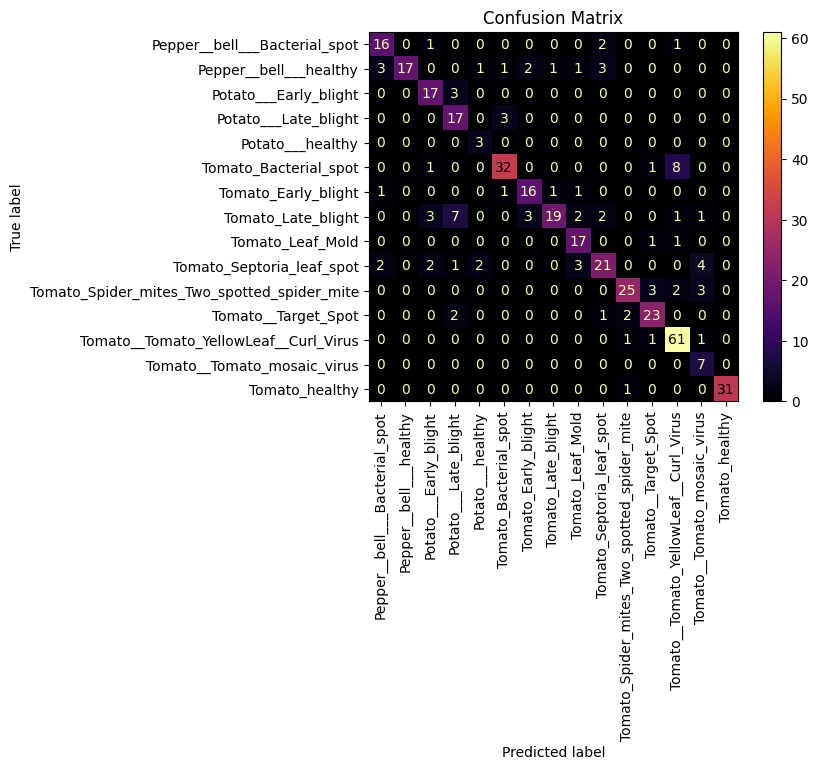

In [ ]:
model = MD_13_CustomCNNWithColorTransform(num_classes=15).cuda()

params={
    'epochs':10,
    'criterion':nn.CrossEntropyLoss(),
    'lr':0.0001,
    'momentum':0.1
}
optimizer = optim.Adam(model.parameters(), lr=params['lr'])

result=training_model(model,params)
Model_Comparison.append(result)

evaluation(model,val_loader,class_labels,result['train_accuracy_list'],result['val_accuracy_list'],true_labels_val, predicted_classes_val, num_classes)

### Model 14 Green Channel * E


In [ ]:
# eps

class MD_14_CustomGreenEnhancementLayer(nn.Module):
    def __init__(self):
        super(MD_14_CustomGreenEnhancementLayer, self).__init__()

    def forward(self, x):
        green_channel = x[:, 1, :, :].clone()
        x[:, 1, :, :] = torch.exp(green_channel)
        return x

class MD_14_CustomBatchNorm2d(nn.Module):
    def __init__(self, num_features, eps=1e-7, momentum=0.1):
        super(MD_14_CustomBatchNorm2d, self).__init__()
        self.num_features = num_features
        self.eps = eps
        self.momentum = momentum
        self.weight = nn.Parameter(torch.ones(1, num_features, 1, 1).cuda())  # Move weight to GPU
        self.bias = nn.Parameter(torch.zeros(1, num_features, 1, 1).cuda())  # Move bias to GPU
        self.running_mean = torch.zeros(1, num_features, 1, 1).cuda()  # Move running_mean to GPU
        self.running_var = torch.ones(1, num_features, 1, 1).cuda()  # Move running_var to GPU

    def forward(self, x):
        if self.training:
            mean = x.mean(dim=(0, 2, 3), keepdim=True)
            var = x.var(dim=(0, 2, 3), unbiased=False, keepdim=True)
            self.running_mean = (1 - self.momentum) * self.running_mean + self.momentum * mean
            self.running_var = (1 - self.momentum) * self.running_var + self.momentum * var
        else:
            mean = self.running_mean
            var = self.running_var

        x = (x - mean) / torch.sqrt(var + self.eps)
        x = x * self.weight + self.bias
        return x

class MD_14_CustomCNNWithColorTransform(nn.Module):
    def __init__(self, num_classes):
        self.name='MD_14_CustomCNNWithColorTransform'
        super(MD_14_CustomCNNWithColorTransform, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            MD_14_CustomBatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            MD_14_CustomBatchNorm2d(64),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            MD_14_CustomBatchNorm2d(128),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            MD_14_CustomBatchNorm2d(128),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            MD_14_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            MD_14_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            MD_14_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            MD_14_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            MD_14_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            MD_14_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            MD_14_CustomGreenEnhancementLayer()
        )
        self.avgpool = nn.AdaptiveAvgPool2d((7, 7))
        self.classifier = nn.Sequential(
            nn.Linear(512 * 7 * 7, 4096),
            nn.BatchNorm1d(4096),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.BatchNorm1d(4096),  # Add batch normalization for fully connected layers
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.BatchNorm1d(4096),  # Add batch normalization for fully connected layers
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

Epoch [1/10] -Training Loss: 1.7898, Validation Loss: 1.1100, Training Accuracy: 43.85%, Validation Accuracy: 63.90%
Epoch [2/10] -Training Loss: 1.1251, Validation Loss: 0.9501, Training Accuracy: 64.23%, Validation Accuracy: 68.05%
Epoch [3/10] -Training Loss: 0.9145, Validation Loss: 1.0138, Training Accuracy: 70.37%, Validation Accuracy: 66.34%
Epoch [4/10] -Training Loss: 0.8329, Validation Loss: 0.8632, Training Accuracy: 71.89%, Validation Accuracy: 70.00%
Epoch [5/10] -Training Loss: 0.7468, Validation Loss: 0.6937, Training Accuracy: 74.79%, Validation Accuracy: 76.34%
Epoch [6/10] -Training Loss: 0.6554, Validation Loss: 0.6484, Training Accuracy: 77.97%, Validation Accuracy: 79.02%
Epoch [7/10] -Training Loss: 0.6626, Validation Loss: 0.5340, Training Accuracy: 78.04%, Validation Accuracy: 81.22%
Epoch [8/10] -Training Loss: 0.6442, Validation Loss: 0.6389, Training Accuracy: 78.94%, Validation Accuracy: 78.29%
Epoch [9/10] -Training Loss: 0.5099, Validation Loss: 1.2790, Tr

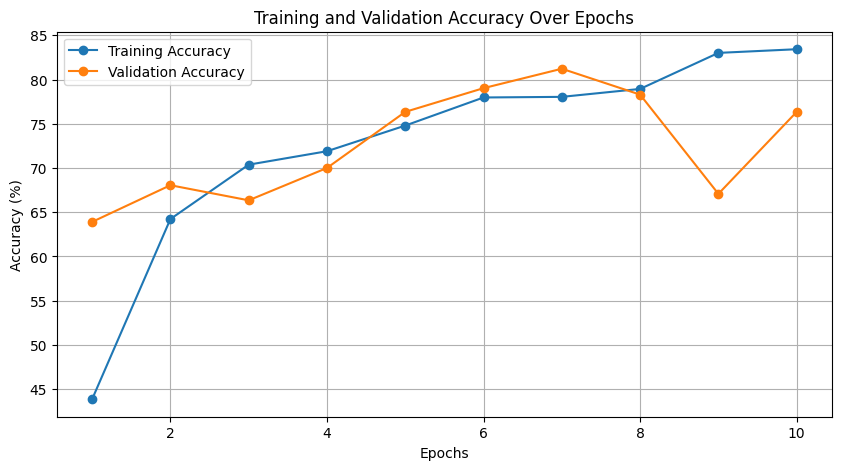

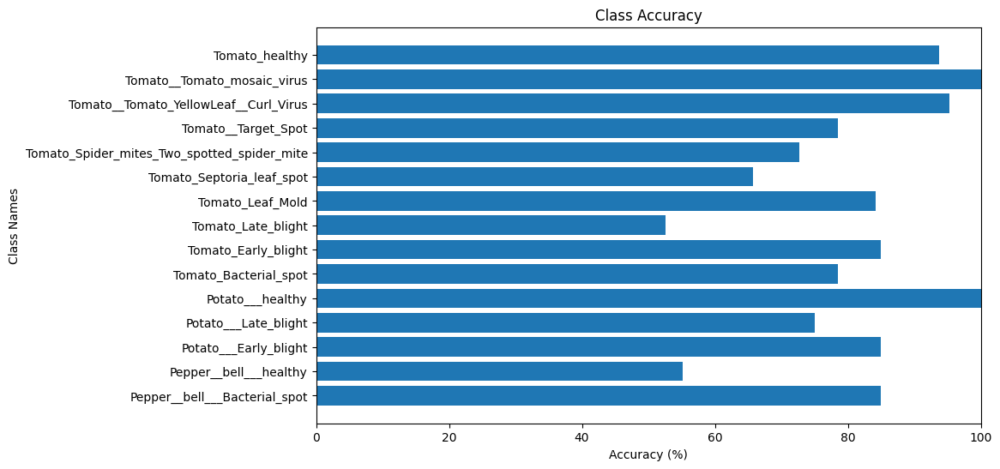

                                    Class_names  Accuracy (%)
0                 Pepper__bell___Bacterial_spot     85.000000
1                        Pepper__bell___healthy     55.172414
2                         Potato___Early_blight     85.000000
3                          Potato___Late_blight     75.000000
4                              Potato___healthy    100.000000
5                         Tomato_Bacterial_spot     78.571429
6                           Tomato_Early_blight     85.000000
7                            Tomato_Late_blight     52.631579
8                              Tomato_Leaf_Mold     84.210526
9                     Tomato_Septoria_leaf_spot     65.714286
10  Tomato_Spider_mites_Two_spotted_spider_mite     72.727273
11                          Tomato__Target_Spot     78.571429
12        Tomato__Tomato_YellowLeaf__Curl_Virus     95.312500
13                  Tomato__Tomato_mosaic_virus    100.000000
14                               Tomato_healthy     93.750000


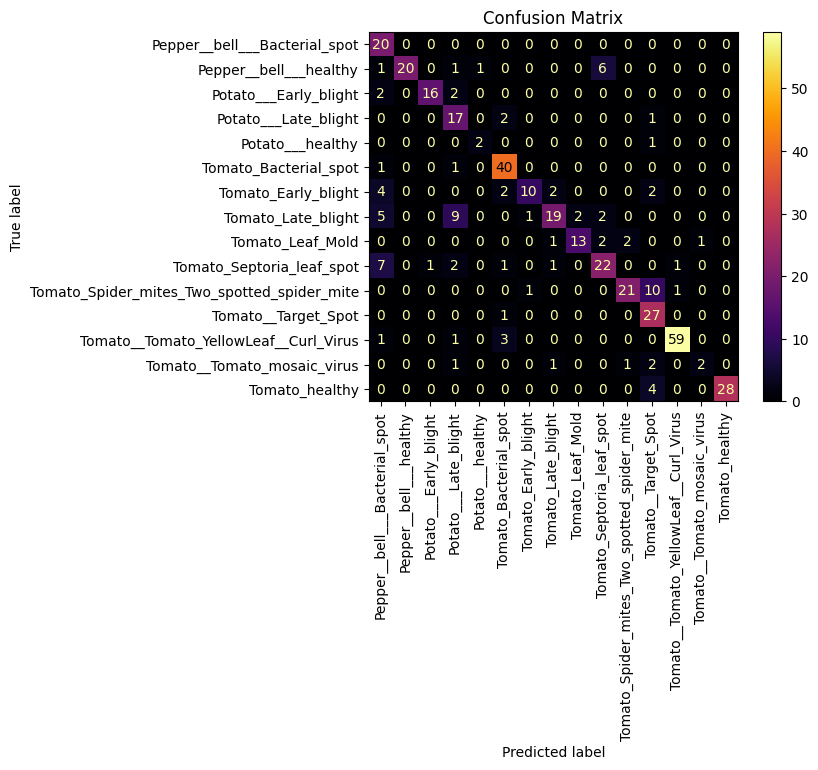

In [ ]:
model = MD_14_CustomCNNWithColorTransform(num_classes=15).cuda()

params={
    'epochs':10,
    'criterion':nn.CrossEntropyLoss(),
    'lr':0.0001,
    'momentum':0.1
}
optimizer = optim.Adam(model.parameters(), lr=params['lr'])

result=training_model(model,params)
Model_Comparison.append(result)

evaluation(model,val_loader,class_labels,result['train_accuracy_list'],result['val_accuracy_list'],true_labels_val, predicted_classes_val, num_classes)

## 5.4 Optimizer Tuning


### Model 15 SGD Optimizer

In [ ]:
class MD_15_CustomGreenEnhancementLayer(nn.Module):
    def __init__(self):
        super(MD_15_CustomGreenEnhancementLayer, self).__init__()

    def forward(self, x):
        green_channel = x[:, 1, :, :].clone()
        x[:, 1, :, :] = green_channel * 2.0
        return x

class MD_15_CustomBatchNorm2d(nn.Module):
    def __init__(self, num_features, eps=1e-7, momentum=0.1):
        super(MD_15_CustomBatchNorm2d, self).__init__()
        self.num_features = num_features
        self.eps = eps
        self.momentum = momentum
        self.weight = nn.Parameter(torch.ones(1, num_features, 1, 1).cuda())  # Move weight to GPU
        self.bias = nn.Parameter(torch.zeros(1, num_features, 1, 1).cuda())  # Move bias to GPU
        self.running_mean = torch.zeros(1, num_features, 1, 1).cuda()  # Move running_mean to GPU
        self.running_var = torch.ones(1, num_features, 1, 1).cuda()  # Move running_var to GPU

    def forward(self, x):
        if self.training:
            mean = x.mean(dim=(0, 2, 3), keepdim=True)
            var = x.var(dim=(0, 2, 3), unbiased=False, keepdim=True)
            self.running_mean = (1 - self.momentum) * self.running_mean + self.momentum * mean
            self.running_var = (1 - self.momentum) * self.running_var + self.momentum * var
        else:
            mean = self.running_mean
            var = self.running_var

        x = (x - mean) / torch.sqrt(var + self.eps)
        x = x * self.weight + self.bias
        return x

class MD_15_CustomCNNWithColorTransform(nn.Module):
    def __init__(self, num_classes):
        self.name='MD_15_CustomCNNWithColorTransform'
        super(MD_15_CustomCNNWithColorTransform, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            MD_15_CustomBatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            MD_15_CustomBatchNorm2d(64),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            MD_15_CustomBatchNorm2d(128),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            MD_15_CustomBatchNorm2d(128),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            MD_15_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            MD_15_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            MD_15_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            MD_15_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            MD_15_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            MD_15_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            MD_15_CustomGreenEnhancementLayer()
        )
        self.avgpool = nn.AdaptiveAvgPool2d((7, 7))
        self.classifier = nn.Sequential(
            nn.Linear(512 * 7 * 7, 4096),
            nn.BatchNorm1d(4096),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.BatchNorm1d(4096),  # Add batch normalization for fully connected layers
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.BatchNorm1d(4096),  # Add batch normalization for fully connected layers
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

Epoch [1/10] -Training Loss: 2.7761, Validation Loss: 2.5657, Training Accuracy: 9.60%, Validation Accuracy: 29.51%
Epoch [2/10] -Training Loss: 2.6109, Validation Loss: 2.4363, Training Accuracy: 16.09%, Validation Accuracy: 34.39%
Epoch [3/10] -Training Loss: 2.4617, Validation Loss: 2.3222, Training Accuracy: 21.75%, Validation Accuracy: 37.07%
Epoch [4/10] -Training Loss: 2.3841, Validation Loss: 2.2287, Training Accuracy: 25.00%, Validation Accuracy: 35.85%
Epoch [5/10] -Training Loss: 2.2982, Validation Loss: 2.1525, Training Accuracy: 28.52%, Validation Accuracy: 40.00%
Epoch [6/10] -Training Loss: 2.2156, Validation Loss: 2.0921, Training Accuracy: 32.60%, Validation Accuracy: 43.17%
Epoch [7/10] -Training Loss: 2.1961, Validation Loss: 2.0411, Training Accuracy: 31.91%, Validation Accuracy: 42.68%
Epoch [8/10] -Training Loss: 2.1276, Validation Loss: 1.9987, Training Accuracy: 34.81%, Validation Accuracy: 45.85%
Epoch [9/10] -Training Loss: 2.0562, Validation Loss: 1.9156, Tra

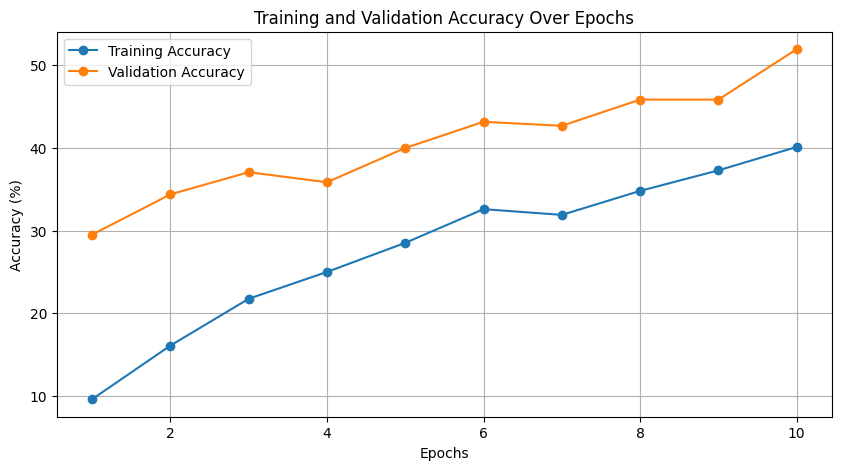

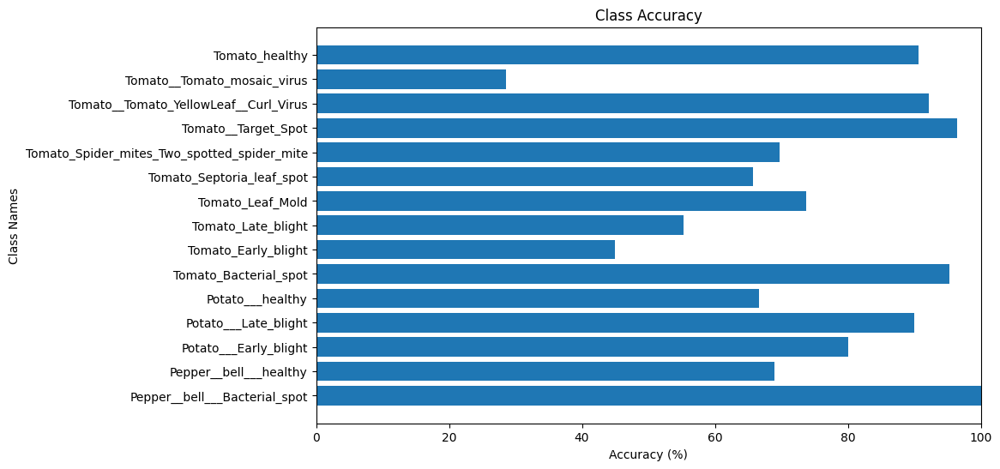

                                    Class_names  Accuracy (%)
0                 Pepper__bell___Bacterial_spot    100.000000
1                        Pepper__bell___healthy     68.965517
2                         Potato___Early_blight     80.000000
3                          Potato___Late_blight     90.000000
4                              Potato___healthy     66.666667
5                         Tomato_Bacterial_spot     95.238095
6                           Tomato_Early_blight     45.000000
7                            Tomato_Late_blight     55.263158
8                              Tomato_Leaf_Mold     73.684211
9                     Tomato_Septoria_leaf_spot     65.714286
10  Tomato_Spider_mites_Two_spotted_spider_mite     69.696970
11                          Tomato__Target_Spot     96.428571
12        Tomato__Tomato_YellowLeaf__Curl_Virus     92.187500
13                  Tomato__Tomato_mosaic_virus     28.571429
14                               Tomato_healthy     90.625000


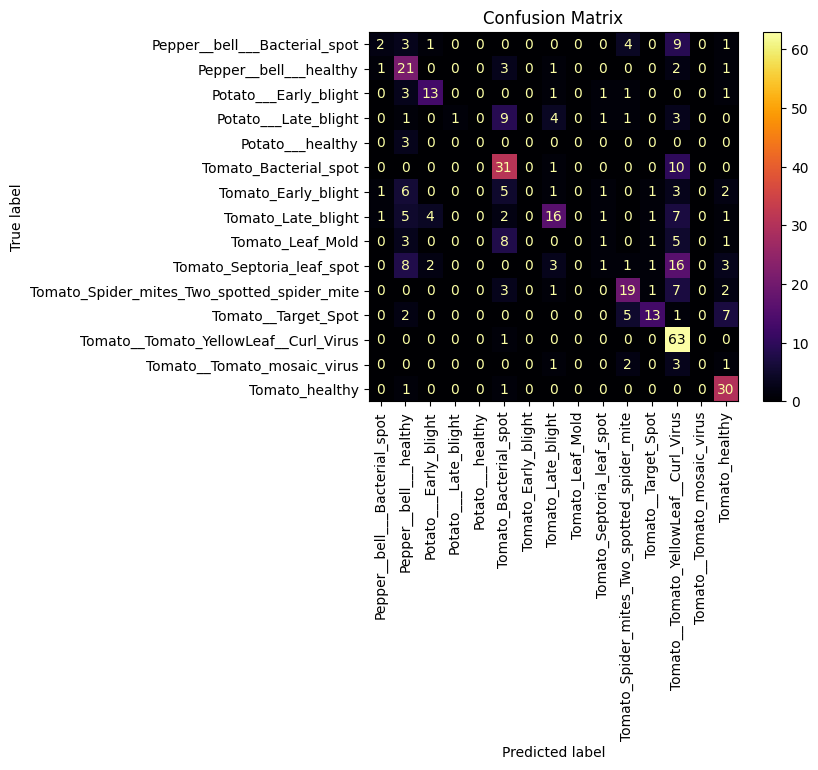

In [ ]:
model = MD_15_CustomCNNWithColorTransform(num_classes=15).cuda()

params={
    'epochs':10,
    'criterion':nn.CrossEntropyLoss(),
    'lr':0.0001,
    'momentum':0.1
}
optimizer = optim.SGD(model.parameters(), lr=params['lr'])

result=training_model(model,params)
Model_Comparison.append(result)

evaluation(model,val_loader,class_labels,result['train_accuracy_list'],result['val_accuracy_list'],true_labels_val, predicted_classes_val, num_classes)

### Model 16 RMSProp

In [ ]:
class MD_16_CustomGreenEnhancementLayer(nn.Module):
    def __init__(self):
        super(MD_16_CustomGreenEnhancementLayer, self).__init__()

    def forward(self, x):
        green_channel = x[:, 1, :, :].clone()
        x[:, 1, :, :] = green_channel * 2.0
        return x

class MD_16_CustomBatchNorm2d(nn.Module):
    def __init__(self, num_features, eps=1e-7, momentum=0.1):
        super(MD_16_CustomBatchNorm2d, self).__init__()
        self.num_features = num_features
        self.eps = eps
        self.momentum = momentum
        self.weight = nn.Parameter(torch.ones(1, num_features, 1, 1).cuda())  # Move weight to GPU
        self.bias = nn.Parameter(torch.zeros(1, num_features, 1, 1).cuda())  # Move bias to GPU
        self.running_mean = torch.zeros(1, num_features, 1, 1).cuda()  # Move running_mean to GPU
        self.running_var = torch.ones(1, num_features, 1, 1).cuda()  # Move running_var to GPU

    def forward(self, x):
        if self.training:
            mean = x.mean(dim=(0, 2, 3), keepdim=True)
            var = x.var(dim=(0, 2, 3), unbiased=False, keepdim=True)
            self.running_mean = (1 - self.momentum) * self.running_mean + self.momentum * mean
            self.running_var = (1 - self.momentum) * self.running_var + self.momentum * var
        else:
            mean = self.running_mean
            var = self.running_var

        x = (x - mean) / torch.sqrt(var + self.eps)
        x = x * self.weight + self.bias
        return x

class MD_16_CustomCNNWithColorTransform(nn.Module):
    def __init__(self, num_classes):
        self.name='MD_16_CustomCNNWithColorTransform'
        super(MD_16_CustomCNNWithColorTransform, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            MD_16_CustomBatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            MD_16_CustomBatchNorm2d(64),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            MD_16_CustomBatchNorm2d(128),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            MD_16_CustomBatchNorm2d(128),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            MD_16_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            MD_16_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            MD_16_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            MD_16_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            MD_16_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            MD_16_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            MD_16_CustomGreenEnhancementLayer()
        )
        self.avgpool = nn.AdaptiveAvgPool2d((7, 7))
        self.classifier = nn.Sequential(
            nn.Linear(512 * 7 * 7, 4096),
            nn.BatchNorm1d(4096),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.BatchNorm1d(4096),  # Add batch normalization for fully connected layers
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.BatchNorm1d(4096),  # Add batch normalization for fully connected layers
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

Epoch [1/10] -Training Loss: 2.0516, Validation Loss: 1.6889, Training Accuracy: 38.67%, Validation Accuracy: 45.12%
Epoch [2/10] -Training Loss: 1.3836, Validation Loss: 1.2262, Training Accuracy: 57.11%, Validation Accuracy: 64.39%
Epoch [3/10] -Training Loss: 1.1626, Validation Loss: 2.9907, Training Accuracy: 62.29%, Validation Accuracy: 48.05%
Epoch [4/10] -Training Loss: 1.0592, Validation Loss: 0.9003, Training Accuracy: 65.61%, Validation Accuracy: 69.27%
Epoch [5/10] -Training Loss: 0.8590, Validation Loss: 1.3756, Training Accuracy: 71.20%, Validation Accuracy: 58.29%
Epoch [6/10] -Training Loss: 0.8293, Validation Loss: 1.0521, Training Accuracy: 72.79%, Validation Accuracy: 65.85%
Epoch [7/10] -Training Loss: 0.7609, Validation Loss: 2.1966, Training Accuracy: 76.04%, Validation Accuracy: 49.51%
Epoch [8/10] -Training Loss: 0.7023, Validation Loss: 0.9595, Training Accuracy: 77.07%, Validation Accuracy: 70.24%
Epoch [9/10] -Training Loss: 0.6868, Validation Loss: 1.4857, Tr

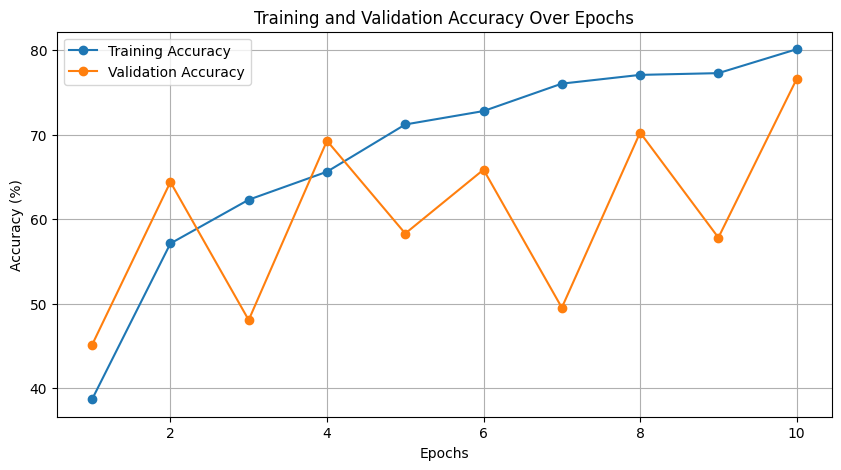

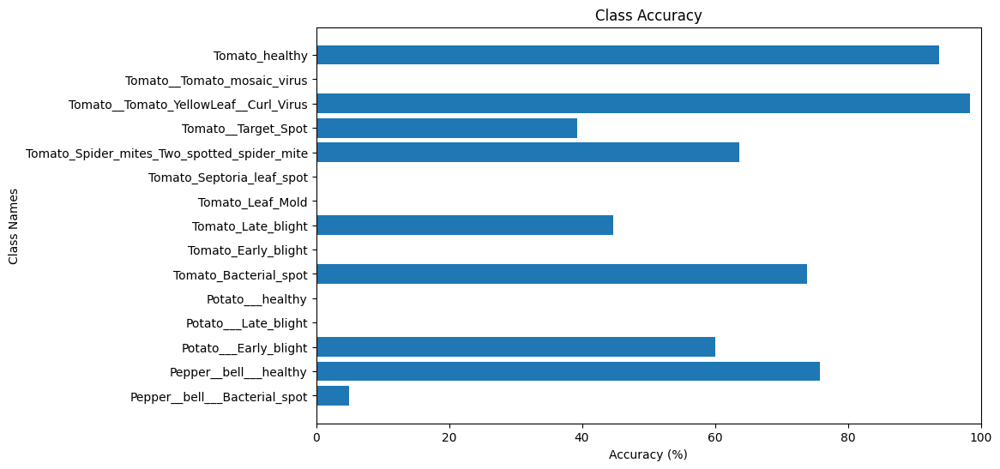

                                    Class_names  Accuracy (%)
0                 Pepper__bell___Bacterial_spot      5.000000
1                        Pepper__bell___healthy     75.862069
2                         Potato___Early_blight     60.000000
3                          Potato___Late_blight      0.000000
4                              Potato___healthy      0.000000
5                         Tomato_Bacterial_spot     73.809524
6                           Tomato_Early_blight      0.000000
7                            Tomato_Late_blight     44.736842
8                              Tomato_Leaf_Mold      0.000000
9                     Tomato_Septoria_leaf_spot      0.000000
10  Tomato_Spider_mites_Two_spotted_spider_mite     63.636364
11                          Tomato__Target_Spot     39.285714
12        Tomato__Tomato_YellowLeaf__Curl_Virus     98.437500
13                  Tomato__Tomato_mosaic_virus      0.000000
14                               Tomato_healthy     93.750000


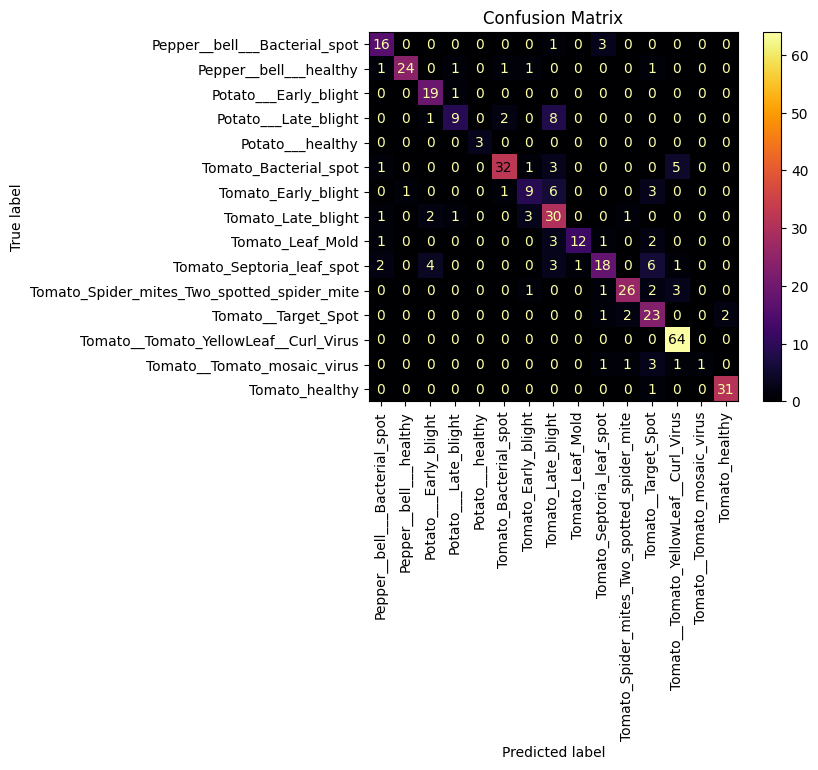

In [ ]:
model = MD_16_CustomCNNWithColorTransform(num_classes=15).cuda()

params={
    'epochs':10,
    'criterion':nn.CrossEntropyLoss(),
    'lr':0.0001,
    'momentum':0.1
}
optimizer = optim.RMSprop(model.parameters(), lr=params['lr'])
result=training_model(model,params)
Model_Comparison.append(result)

evaluation(model,val_loader,class_labels,result['train_accuracy_list'],result['val_accuracy_list'],true_labels_val, predicted_classes_val, num_classes)

### Model 17 Adagrad

In [ ]:
class MD_17_CustomGreenEnhancementLayer(nn.Module):
    def __init__(self):
        super(MD_17_CustomGreenEnhancementLayer, self).__init__()

    def forward(self, x):

        green_channel = x[:, 1, :, :].clone()
        x[:, 1, :, :] = green_channel * 2.0

        return x

class MD_17_CustomBatchNorm2d(nn.Module):
    def __init__(self, num_features, eps=1e-7, momentum=0.1):
        super(MD_17_CustomBatchNorm2d, self).__init__()
        self.num_features = num_features
        self.eps = eps
        self.momentum = momentum
        self.weight = nn.Parameter(torch.ones(1, num_features, 1, 1).cuda())  # Move weight to GPU
        self.bias = nn.Parameter(torch.zeros(1, num_features, 1, 1).cuda())  # Move bias to GPU
        self.running_mean = torch.zeros(1, num_features, 1, 1).cuda()  # Move running_mean to GPU
        self.running_var = torch.ones(1, num_features, 1, 1).cuda()  # Move running_var to GPU

    def forward(self, x):
        if self.training:
            mean = x.mean(dim=(0, 2, 3), keepdim=True)
            var = x.var(dim=(0, 2, 3), unbiased=False, keepdim=True)
            self.running_mean = (1 - self.momentum) * self.running_mean + self.momentum * mean
            self.running_var = (1 - self.momentum) * self.running_var + self.momentum * var
        else:
            mean = self.running_mean
            var = self.running_var

        x = (x - mean) / torch.sqrt(var + self.eps)
        x = x * self.weight + self.bias
        return x

class MD_17_CustomCNNWithColorTransform(nn.Module):
    def __init__(self, num_classes):
        self.name='MD_17_CustomCNNWithColorTransform'
        super(MD_17_CustomCNNWithColorTransform, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            MD_17_CustomBatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            MD_17_CustomBatchNorm2d(64),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            MD_17_CustomBatchNorm2d(128),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            MD_17_CustomBatchNorm2d(128),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            MD_17_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            MD_17_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            MD_17_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            MD_17_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            MD_17_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            MD_17_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            MD_17_CustomGreenEnhancementLayer()
        )
        self.avgpool = nn.AdaptiveAvgPool2d((7, 7))
        self.classifier = nn.Sequential(
            nn.Linear(512 * 7 * 7, 4096),
            nn.BatchNorm1d(4096),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.BatchNorm1d(4096),  # Add batch normalization for fully connected layers
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.BatchNorm1d(4096),  # Add batch normalization for fully connected layers
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

Epoch [1/10] -Training Loss: 1.9733, Validation Loss: 1.4877, Training Accuracy: 41.09%, Validation Accuracy: 60.98%
Epoch [2/10] -Training Loss: 1.4220, Validation Loss: 1.1211, Training Accuracy: 60.29%, Validation Accuracy: 69.51%
Epoch [3/10] -Training Loss: 1.2051, Validation Loss: 0.9780, Training Accuracy: 66.02%, Validation Accuracy: 72.44%
Epoch [4/10] -Training Loss: 1.0860, Validation Loss: 0.9130, Training Accuracy: 68.99%, Validation Accuracy: 74.39%
Epoch [5/10] -Training Loss: 0.9901, Validation Loss: 0.7885, Training Accuracy: 71.96%, Validation Accuracy: 80.49%
Epoch [6/10] -Training Loss: 0.9067, Validation Loss: 0.7577, Training Accuracy: 73.20%, Validation Accuracy: 80.00%
Epoch [7/10] -Training Loss: 0.8725, Validation Loss: 0.7261, Training Accuracy: 76.17%, Validation Accuracy: 79.27%
Epoch [8/10] -Training Loss: 0.8092, Validation Loss: 0.7081, Training Accuracy: 77.00%, Validation Accuracy: 80.00%
Epoch [9/10] -Training Loss: 0.7717, Validation Loss: 0.6507, Tr

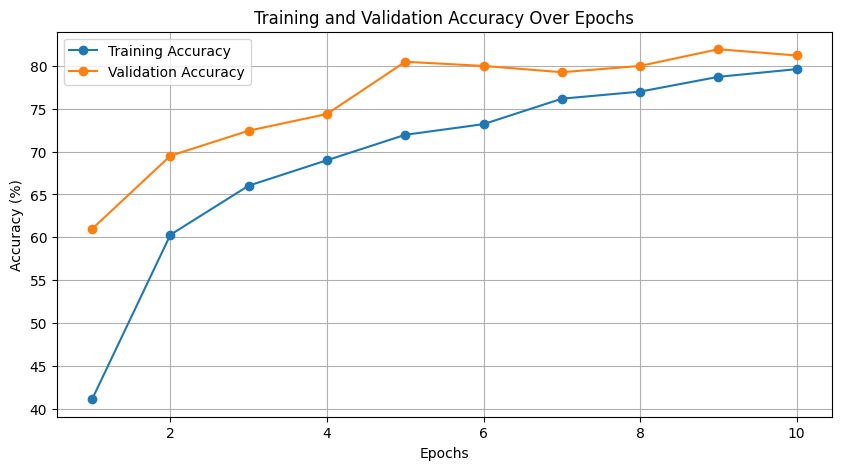

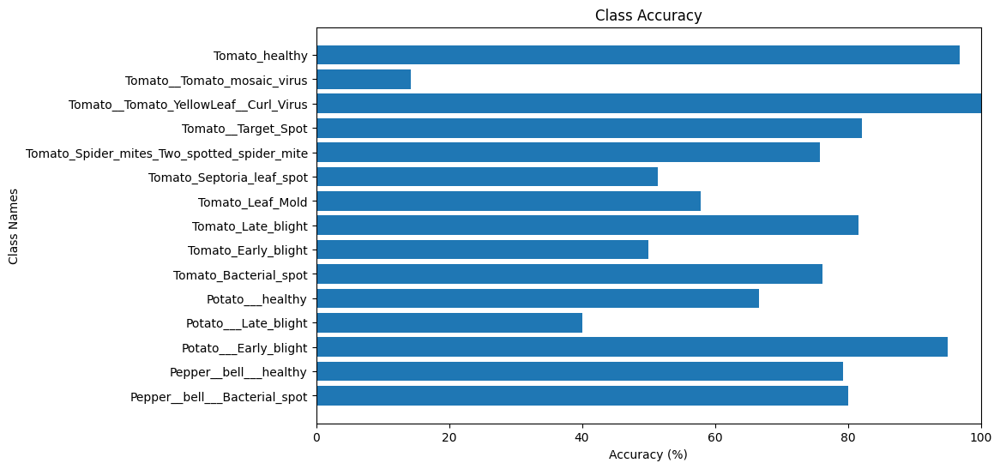

                                    Class_names  Accuracy (%)
0                 Pepper__bell___Bacterial_spot     80.000000
1                        Pepper__bell___healthy     79.310345
2                         Potato___Early_blight     95.000000
3                          Potato___Late_blight     40.000000
4                              Potato___healthy     66.666667
5                         Tomato_Bacterial_spot     76.190476
6                           Tomato_Early_blight     50.000000
7                            Tomato_Late_blight     81.578947
8                              Tomato_Leaf_Mold     57.894737
9                     Tomato_Septoria_leaf_spot     51.428571
10  Tomato_Spider_mites_Two_spotted_spider_mite     75.757576
11                          Tomato__Target_Spot     82.142857
12        Tomato__Tomato_YellowLeaf__Curl_Virus    100.000000
13                  Tomato__Tomato_mosaic_virus     14.285714
14                               Tomato_healthy     96.875000


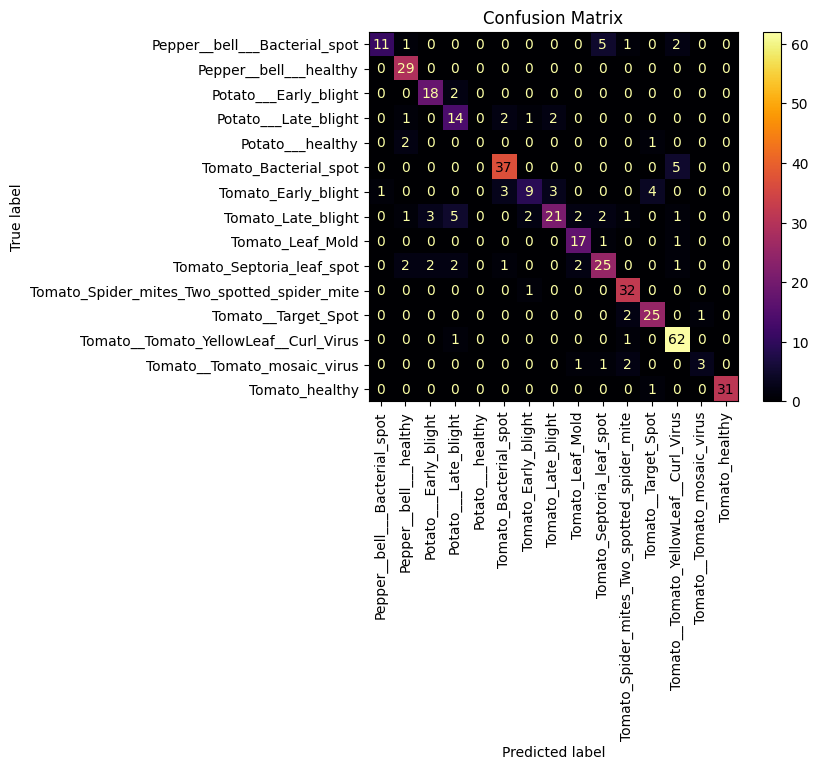

In [ ]:
model = MD_17_CustomCNNWithColorTransform(num_classes=15).cuda()

params={
    'epochs':10,
    'criterion':nn.CrossEntropyLoss(),
    'lr':0.0001,
    'momentum':0.1
}
optimizer = optim.Adagrad(model.parameters(), lr=params['lr'])

result=training_model(model,params)
Model_Comparison.append(result)

evaluation(model,val_loader,class_labels,result['train_accuracy_list'],result['val_accuracy_list'],true_labels_val, predicted_classes_val, num_classes)

### Model 18 Adadelta

In [ ]:
class MD_18_CustomGreenEnhancementLayer(nn.Module):
    def __init__(self):
        super(MD_18_CustomGreenEnhancementLayer, self).__init__()

    def forward(self, x):
        # Enhance the green channel (index 1) by multiplying it by a learned weight
        # x[:, 1, :, :] = x[:, 1, :, :] ** 2.0
        # enhanced_green = x[:, 1, :, :] ** 2 # Adjust the weight as needed
        # x[:, 1, :, :] = enhanced_green
        green_channel = x[:, 1, :, :].clone()
        x[:, 1, :, :] = green_channel * 2.0
        # x[:, 1, :, :] = torch.exp(green_channel)
        return x

class MD_18_CustomBatchNorm2d(nn.Module):
    def __init__(self, num_features, eps=1e-7, momentum=0.1):
        super(MD_18_CustomBatchNorm2d, self).__init__()
        self.num_features = num_features
        self.eps = eps
        self.momentum = momentum
        self.weight = nn.Parameter(torch.ones(1, num_features, 1, 1).cuda())  # Move weight to GPU
        self.bias = nn.Parameter(torch.zeros(1, num_features, 1, 1).cuda())  # Move bias to GPU
        self.running_mean = torch.zeros(1, num_features, 1, 1).cuda()  # Move running_mean to GPU
        self.running_var = torch.ones(1, num_features, 1, 1).cuda()  # Move running_var to GPU

    def forward(self, x):
        if self.training:
            mean = x.mean(dim=(0, 2, 3), keepdim=True)
            var = x.var(dim=(0, 2, 3), unbiased=False, keepdim=True)
            self.running_mean = (1 - self.momentum) * self.running_mean + self.momentum * mean
            self.running_var = (1 - self.momentum) * self.running_var + self.momentum * var
        else:
            mean = self.running_mean
            var = self.running_var

        x = (x - mean) / torch.sqrt(var + self.eps)
        x = x * self.weight + self.bias
        return x

class MD_18_CustomCNNWithColorTransform(nn.Module):
    def __init__(self, num_classes):
        self.name='MD_18_CustomCNNWithColorTransform'
        super(MD_18_CustomCNNWithColorTransform, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            MD_18_CustomBatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            MD_18_CustomBatchNorm2d(64),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            MD_18_CustomBatchNorm2d(128),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            MD_18_CustomBatchNorm2d(128),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            MD_18_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            MD_18_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            MD_18_CustomBatchNorm2d(256),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            MD_18_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            MD_18_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            MD_18_CustomBatchNorm2d(512),  # Add batch normalization
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
            MD_18_CustomGreenEnhancementLayer()
        )
        self.avgpool = nn.AdaptiveAvgPool2d((7, 7))
        self.classifier = nn.Sequential(
            nn.Linear(512 * 7 * 7, 4096),
            nn.BatchNorm1d(4096),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.BatchNorm1d(4096),  # Add batch normalization for fully connected layers
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.BatchNorm1d(4096),  # Add batch normalization for fully connected layers
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

Epoch [1/10] -Training Loss: 2.8119, Validation Loss: 2.6567, Training Accuracy: 8.49%, Validation Accuracy: 12.93%
Epoch [2/10] -Training Loss: 2.7728, Validation Loss: 2.6361, Training Accuracy: 9.25%, Validation Accuracy: 16.10%
Epoch [3/10] -Training Loss: 2.7355, Validation Loss: 2.6135, Training Accuracy: 11.67%, Validation Accuracy: 22.20%
Epoch [4/10] -Training Loss: 2.7203, Validation Loss: 2.5898, Training Accuracy: 11.40%, Validation Accuracy: 24.15%
Epoch [5/10] -Training Loss: 2.6850, Validation Loss: 2.5603, Training Accuracy: 11.95%, Validation Accuracy: 27.80%
Epoch [6/10] -Training Loss: 2.6506, Validation Loss: 2.5430, Training Accuracy: 13.81%, Validation Accuracy: 27.32%
Epoch [7/10] -Training Loss: 2.6323, Validation Loss: 2.5218, Training Accuracy: 14.92%, Validation Accuracy: 29.76%
Epoch [8/10] -Training Loss: 2.6189, Validation Loss: 2.4916, Training Accuracy: 15.12%, Validation Accuracy: 32.20%
Epoch [9/10] -Training Loss: 2.5708, Validation Loss: 2.4677, Trai

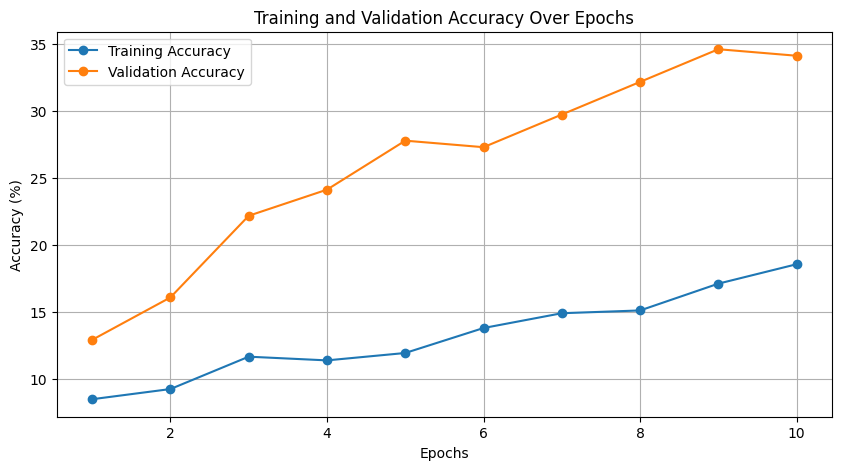

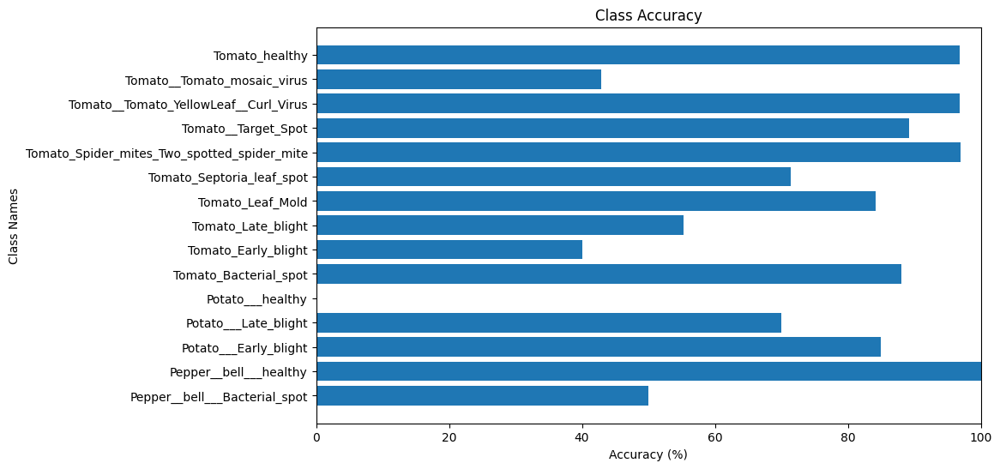

                                    Class_names  Accuracy (%)
0                 Pepper__bell___Bacterial_spot     50.000000
1                        Pepper__bell___healthy    100.000000
2                         Potato___Early_blight     85.000000
3                          Potato___Late_blight     70.000000
4                              Potato___healthy      0.000000
5                         Tomato_Bacterial_spot     88.095238
6                           Tomato_Early_blight     40.000000
7                            Tomato_Late_blight     55.263158
8                              Tomato_Leaf_Mold     84.210526
9                     Tomato_Septoria_leaf_spot     71.428571
10  Tomato_Spider_mites_Two_spotted_spider_mite     96.969697
11                          Tomato__Target_Spot     89.285714
12        Tomato__Tomato_YellowLeaf__Curl_Virus     96.875000
13                  Tomato__Tomato_mosaic_virus     42.857143
14                               Tomato_healthy     96.875000


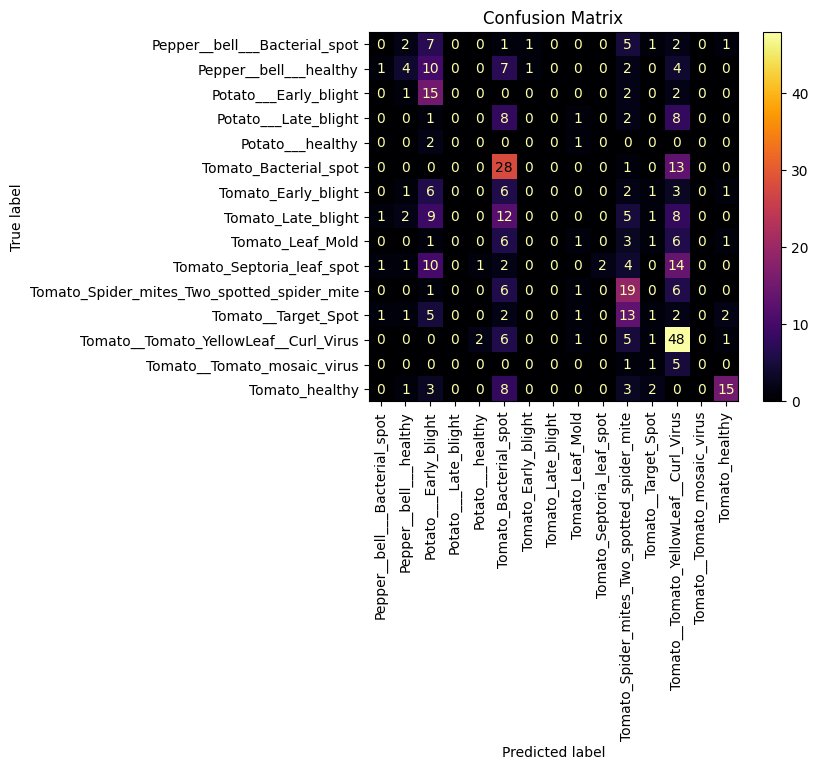

In [ ]:
model = MD_18_CustomCNNWithColorTransform(num_classes=15).cuda()

params={
    'epochs':10,
    'criterion':nn.CrossEntropyLoss(),
    'lr':0.0001,
    'momentum':0.1
}
optimizer = optim.Adadelta(model.parameters(), lr=params['lr'])
result=training_model(model,params)
Model_Comparison.append(result)

evaluation(model,val_loader,class_labels,result['train_accuracy_list'],result['val_accuracy_list'],true_labels_val, predicted_classes_val, num_classes)

## 5.5 Established CNN

Based on same dataset established CNN models are trained

In [ ]:
# Define the models
model_alexnet = alexnet(num_classes=num_classes)  # Replace 'num_classes' with the number of classes in your dataset
model_densenet = densenet121(num_classes=num_classes)
model_resnet = resnet18(num_classes=num_classes)
model_vgg = vgg16(num_classes=num_classes)

# Specify the model names for reference in the result
model_alexnet.name = "AlexNet"
model_densenet.name = "DenseNet"
model_resnet.name = "ResNet"
model_vgg.name = "VGG"

# Create a list of models to train and evaluate
models_to_train = [model_alexnet, model_densenet, model_resnet, model_vgg]

# Define training parameters
params={
    'epochs':10,
    'criterion':nn.CrossEntropyLoss(),
    'lr':0.0001,
    'momentum':0.1
}

# Create a list to store the results for each model
results = []




### Model Alexnet

Epoch [1/10] -Training Loss: 0.7476, Validation Loss: 1.1257, Training Accuracy: 74.86%, Validation Accuracy: 63.90%
Epoch [2/10] -Training Loss: 0.6482, Validation Loss: 0.8064, Training Accuracy: 78.11%, Validation Accuracy: 74.88%
Epoch [3/10] -Training Loss: 0.5724, Validation Loss: 0.8347, Training Accuracy: 80.25%, Validation Accuracy: 73.90%
Epoch [4/10] -Training Loss: 0.5251, Validation Loss: 0.7217, Training Accuracy: 82.11%, Validation Accuracy: 76.83%
Epoch [5/10] -Training Loss: 0.5342, Validation Loss: 0.7976, Training Accuracy: 81.49%, Validation Accuracy: 74.39%
Epoch [6/10] -Training Loss: 0.4328, Validation Loss: 0.7943, Training Accuracy: 84.46%, Validation Accuracy: 78.29%
Epoch [7/10] -Training Loss: 0.4065, Validation Loss: 0.6662, Training Accuracy: 85.84%, Validation Accuracy: 80.49%
Epoch [8/10] -Training Loss: 0.3995, Validation Loss: 0.7888, Training Accuracy: 87.36%, Validation Accuracy: 77.07%
Epoch [9/10] -Training Loss: 0.3740, Validation Loss: 1.0384, Tr

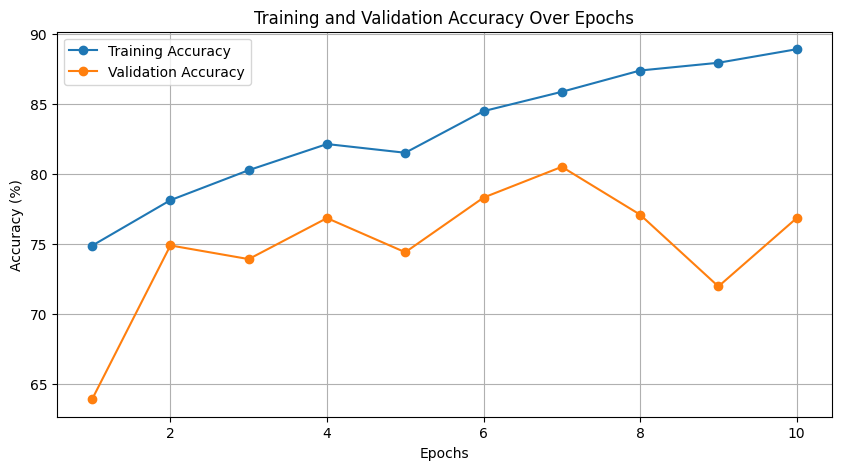

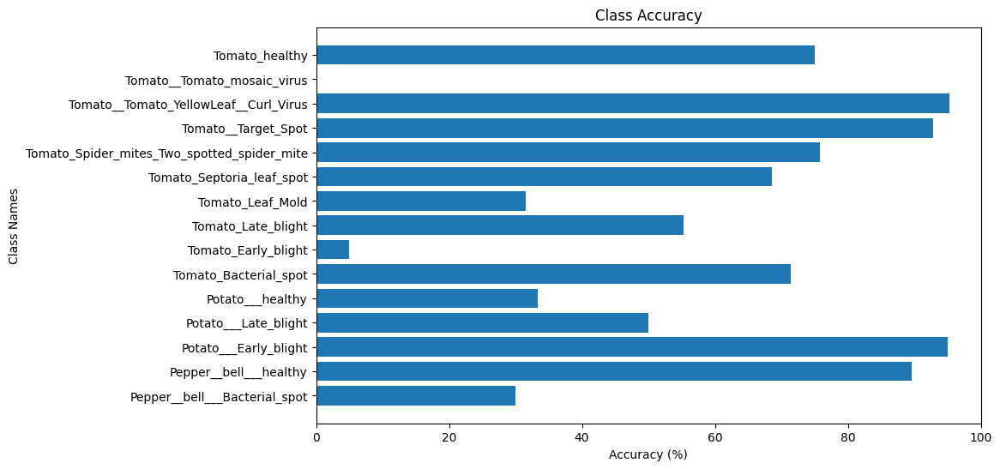

                                    Class_names  Accuracy (%)
0                 Pepper__bell___Bacterial_spot     30.000000
1                        Pepper__bell___healthy     89.655172
2                         Potato___Early_blight     95.000000
3                          Potato___Late_blight     50.000000
4                              Potato___healthy     33.333333
5                         Tomato_Bacterial_spot     71.428571
6                           Tomato_Early_blight      5.000000
7                            Tomato_Late_blight     55.263158
8                              Tomato_Leaf_Mold     31.578947
9                     Tomato_Septoria_leaf_spot     68.571429
10  Tomato_Spider_mites_Two_spotted_spider_mite     75.757576
11                          Tomato__Target_Spot     92.857143
12        Tomato__Tomato_YellowLeaf__Curl_Virus     95.312500
13                  Tomato__Tomato_mosaic_virus      0.000000
14                               Tomato_healthy     75.000000


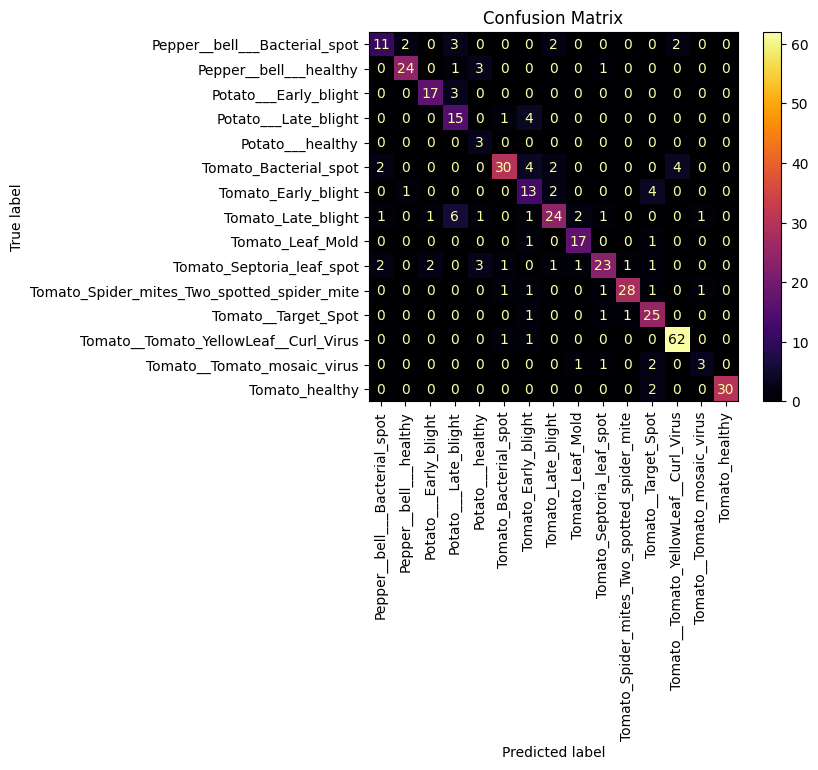

In [ ]:
model = model_alexnet.cuda()

optimizer = optim.Adam(model.parameters(), lr=params['lr'])
result=training_model(model,params)
Model_Comparison.append(result)
print(f'\n\n{model.name}:')
evaluation(model,val_loader,class_labels,result['train_accuracy_list'],result['val_accuracy_list'],true_labels_val, predicted_classes_val, num_classes)



### Model densenet

Epoch [1/10] -Training Loss: 1.8839, Validation Loss: 1.2650, Training Accuracy: 45.10%, Validation Accuracy: 60.49%
Epoch [2/10] -Training Loss: 1.2303, Validation Loss: 0.9380, Training Accuracy: 63.74%, Validation Accuracy: 71.46%
Epoch [3/10] -Training Loss: 0.9875, Validation Loss: 0.7787, Training Accuracy: 70.72%, Validation Accuracy: 76.10%
Epoch [4/10] -Training Loss: 0.8531, Validation Loss: 0.7057, Training Accuracy: 74.31%, Validation Accuracy: 80.24%
Epoch [5/10] -Training Loss: 0.7821, Validation Loss: 0.6708, Training Accuracy: 76.31%, Validation Accuracy: 78.54%
Epoch [6/10] -Training Loss: 0.6778, Validation Loss: 0.6479, Training Accuracy: 78.73%, Validation Accuracy: 78.29%
Epoch [7/10] -Training Loss: 0.5711, Validation Loss: 0.5913, Training Accuracy: 82.73%, Validation Accuracy: 81.95%
Epoch [8/10] -Training Loss: 0.5321, Validation Loss: 0.5487, Training Accuracy: 83.91%, Validation Accuracy: 80.49%
Epoch [9/10] -Training Loss: 0.4496, Validation Loss: 0.5313, Tr

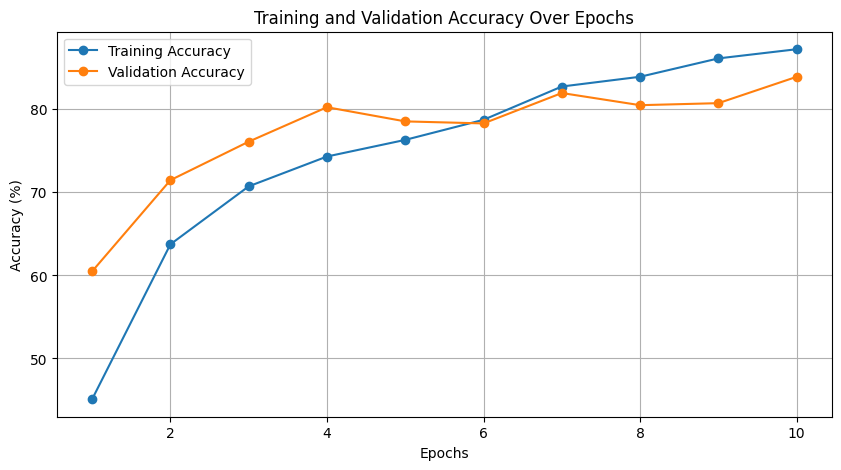

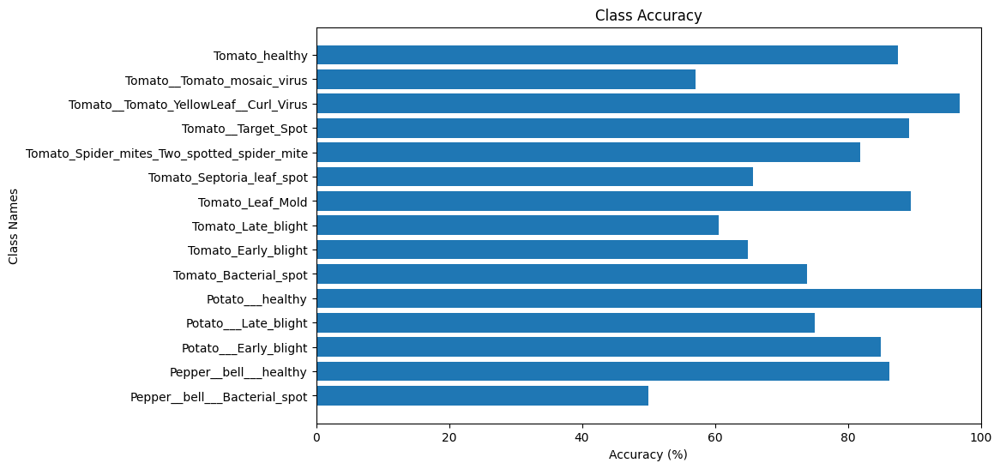

                                    Class_names  Accuracy (%)
0                 Pepper__bell___Bacterial_spot     50.000000
1                        Pepper__bell___healthy     86.206897
2                         Potato___Early_blight     85.000000
3                          Potato___Late_blight     75.000000
4                              Potato___healthy    100.000000
5                         Tomato_Bacterial_spot     73.809524
6                           Tomato_Early_blight     65.000000
7                            Tomato_Late_blight     60.526316
8                              Tomato_Leaf_Mold     89.473684
9                     Tomato_Septoria_leaf_spot     65.714286
10  Tomato_Spider_mites_Two_spotted_spider_mite     81.818182
11                          Tomato__Target_Spot     89.285714
12        Tomato__Tomato_YellowLeaf__Curl_Virus     96.875000
13                  Tomato__Tomato_mosaic_virus     57.142857
14                               Tomato_healthy     87.500000


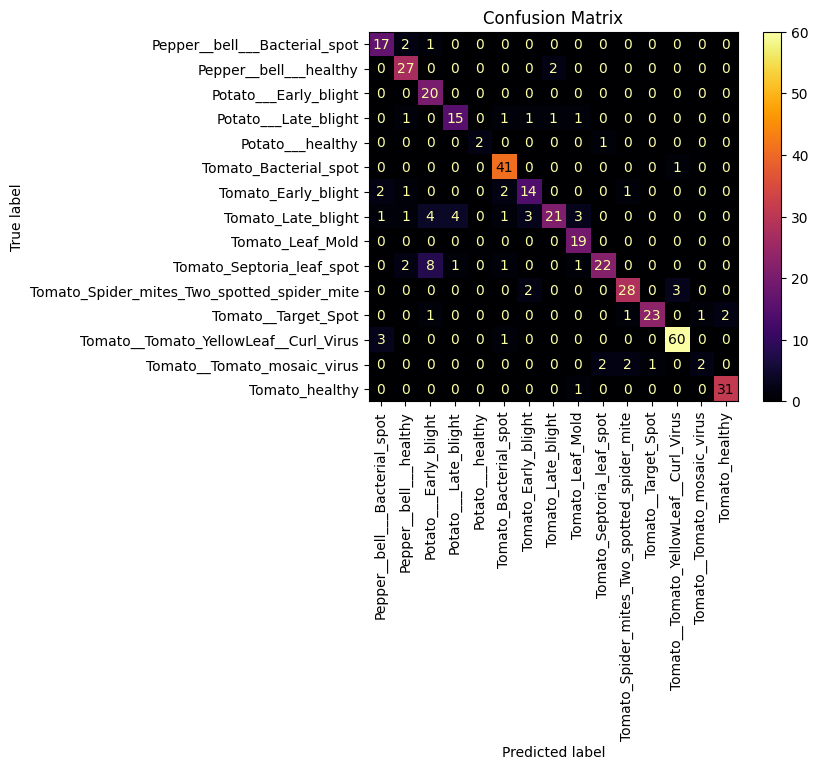

In [ ]:
model = model_densenet.cuda()

optimizer = optim.Adam(model.parameters(), lr=params['lr'])
result=training_model(model,params)
Model_Comparison.append(result)
print(f'\n\n{model.name}:')
evaluation(model,val_loader,class_labels,result['train_accuracy_list'],result['val_accuracy_list'],true_labels_val, predicted_classes_val, num_classes)


### Model resnet

Epoch [1/10] -Training Loss: 1.7504, Validation Loss: 1.3464, Training Accuracy: 43.78%, Validation Accuracy: 60.24%
Epoch [2/10] -Training Loss: 1.1111, Validation Loss: 1.0357, Training Accuracy: 64.92%, Validation Accuracy: 64.63%
Epoch [3/10] -Training Loss: 0.8969, Validation Loss: 1.2781, Training Accuracy: 70.99%, Validation Accuracy: 59.02%
Epoch [4/10] -Training Loss: 0.7612, Validation Loss: 0.8511, Training Accuracy: 75.35%, Validation Accuracy: 72.44%
Epoch [5/10] -Training Loss: 0.6656, Validation Loss: 1.0668, Training Accuracy: 77.83%, Validation Accuracy: 64.88%
Epoch [6/10] -Training Loss: 0.6104, Validation Loss: 0.7501, Training Accuracy: 80.52%, Validation Accuracy: 76.34%
Epoch [7/10] -Training Loss: 0.4674, Validation Loss: 0.5757, Training Accuracy: 85.01%, Validation Accuracy: 81.71%
Epoch [8/10] -Training Loss: 0.4023, Validation Loss: 0.5785, Training Accuracy: 88.05%, Validation Accuracy: 80.00%
Epoch [9/10] -Training Loss: 0.3877, Validation Loss: 0.4734, Tr

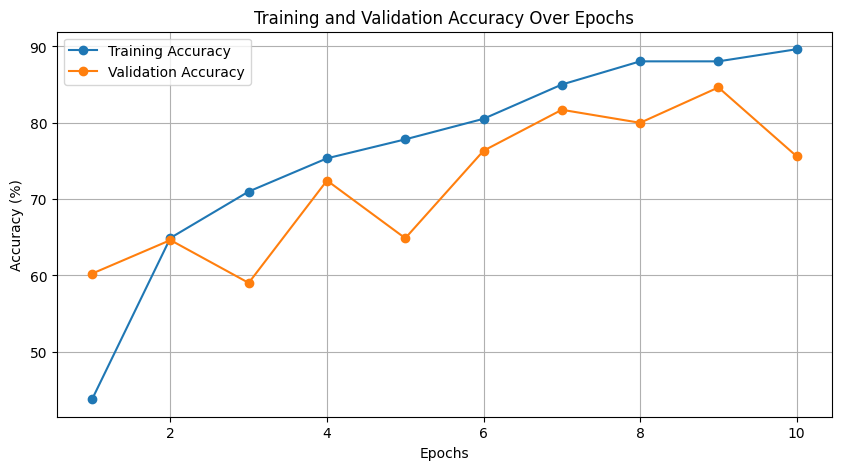

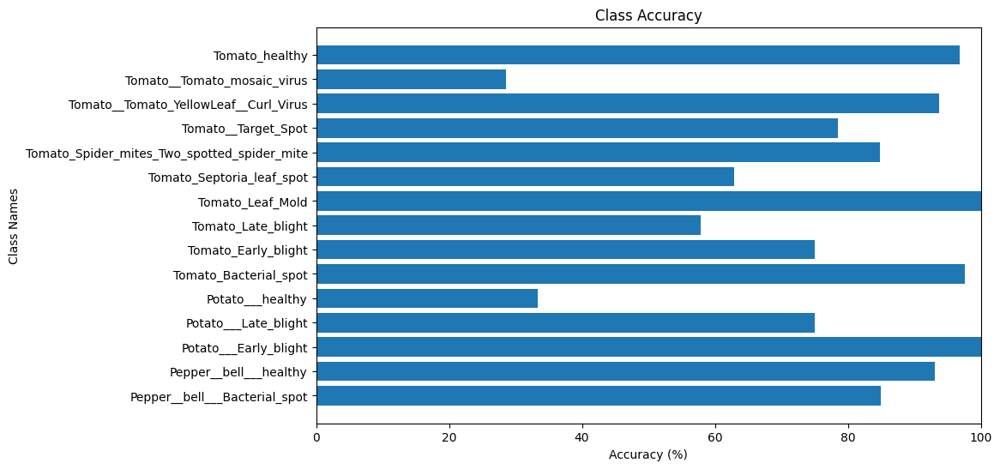

                                    Class_names  Accuracy (%)
0                 Pepper__bell___Bacterial_spot     85.000000
1                        Pepper__bell___healthy     93.103448
2                         Potato___Early_blight    100.000000
3                          Potato___Late_blight     75.000000
4                              Potato___healthy     33.333333
5                         Tomato_Bacterial_spot     97.619048
6                           Tomato_Early_blight     75.000000
7                            Tomato_Late_blight     57.894737
8                              Tomato_Leaf_Mold    100.000000
9                     Tomato_Septoria_leaf_spot     62.857143
10  Tomato_Spider_mites_Two_spotted_spider_mite     84.848485
11                          Tomato__Target_Spot     78.571429
12        Tomato__Tomato_YellowLeaf__Curl_Virus     93.750000
13                  Tomato__Tomato_mosaic_virus     28.571429
14                               Tomato_healthy     96.875000


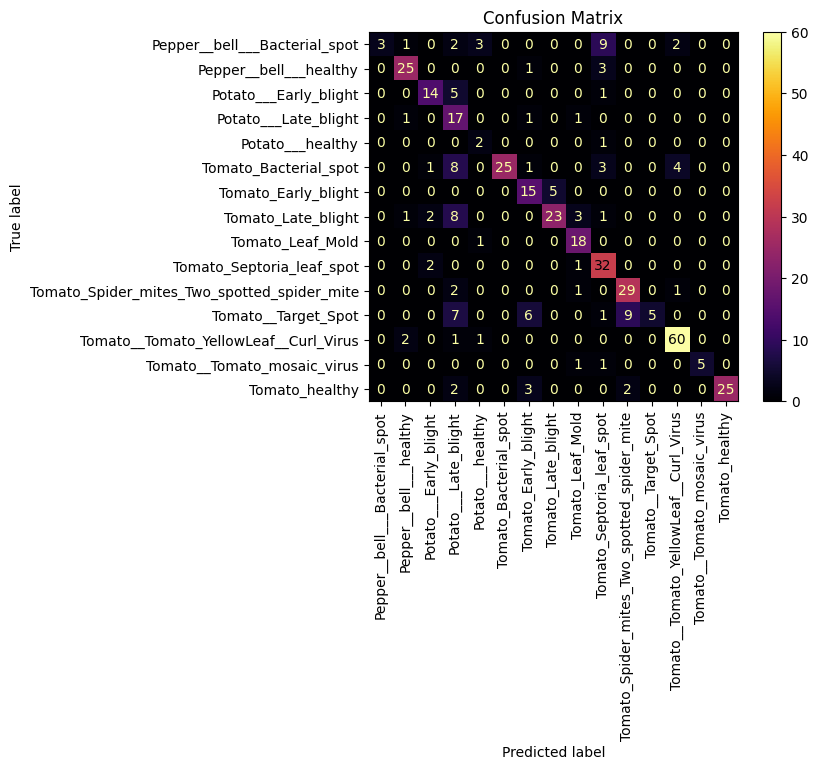

In [ ]:
model = model_resnet.cuda()

optimizer = optim.Adam(model.parameters(), lr=params['lr'])
result=training_model(model,params)
Model_Comparison.append(result)
print(f'\n\n{model.name}:')
evaluation(model,val_loader,class_labels,result['train_accuracy_list'],result['val_accuracy_list'],true_labels_val, predicted_classes_val, num_classes)


### Model VGG

Epoch [1/10] -Training Loss: 2.4336, Validation Loss: 2.2619, Training Accuracy: 18.30%, Validation Accuracy: 26.59%
Epoch [2/10] -Training Loss: 2.1073, Validation Loss: 2.0149, Training Accuracy: 31.28%, Validation Accuracy: 32.68%
Epoch [3/10] -Training Loss: 1.7790, Validation Loss: 1.8921, Training Accuracy: 43.16%, Validation Accuracy: 40.73%
Epoch [4/10] -Training Loss: 1.4819, Validation Loss: 1.3001, Training Accuracy: 52.69%, Validation Accuracy: 58.29%
Epoch [5/10] -Training Loss: 1.2304, Validation Loss: 1.1629, Training Accuracy: 60.29%, Validation Accuracy: 62.20%
Epoch [6/10] -Training Loss: 1.1242, Validation Loss: 1.2779, Training Accuracy: 62.50%, Validation Accuracy: 57.56%
Epoch [7/10] -Training Loss: 1.0300, Validation Loss: 1.3393, Training Accuracy: 64.92%, Validation Accuracy: 59.76%
Epoch [8/10] -Training Loss: 0.9101, Validation Loss: 1.1089, Training Accuracy: 68.92%, Validation Accuracy: 66.10%
Epoch [9/10] -Training Loss: 0.7848, Validation Loss: 1.2551, Tr

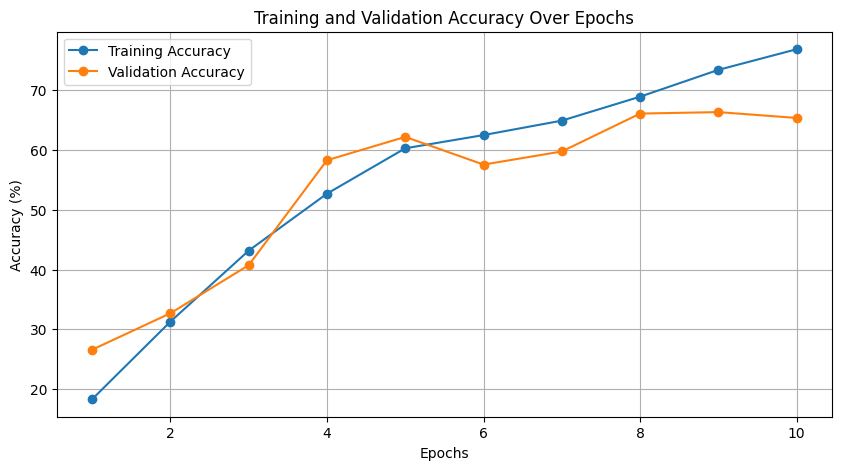

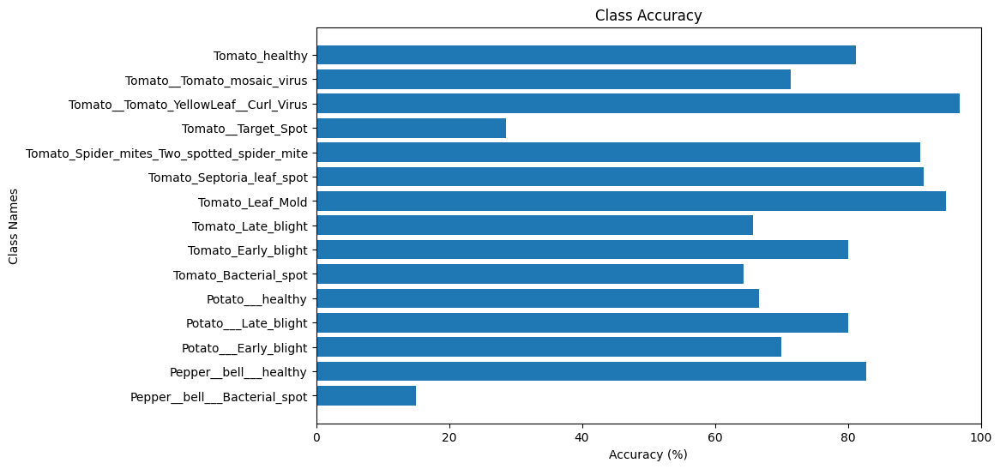

                                    Class_names  Accuracy (%)
0                 Pepper__bell___Bacterial_spot     15.000000
1                        Pepper__bell___healthy     82.758621
2                         Potato___Early_blight     70.000000
3                          Potato___Late_blight     80.000000
4                              Potato___healthy     66.666667
5                         Tomato_Bacterial_spot     64.285714
6                           Tomato_Early_blight     80.000000
7                            Tomato_Late_blight     65.789474
8                              Tomato_Leaf_Mold     94.736842
9                     Tomato_Septoria_leaf_spot     91.428571
10  Tomato_Spider_mites_Two_spotted_spider_mite     90.909091
11                          Tomato__Target_Spot     28.571429
12        Tomato__Tomato_YellowLeaf__Curl_Virus     96.875000
13                  Tomato__Tomato_mosaic_virus     71.428571
14                               Tomato_healthy     81.250000


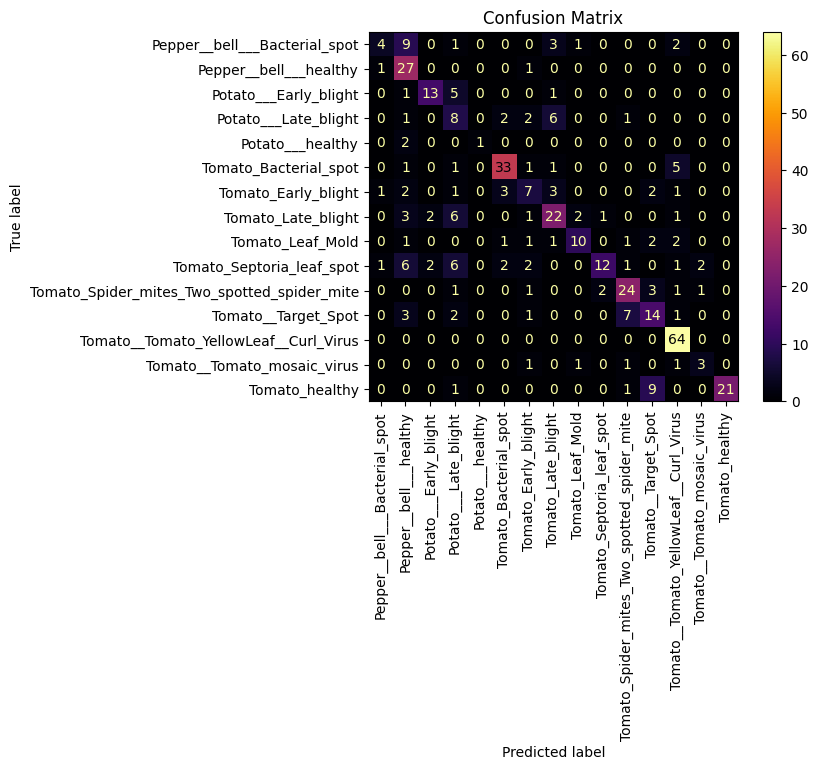

In [ ]:
model = model_vgg.cuda()

optimizer = optim.Adam(model.parameters(), lr=params['lr'])
result=training_model(model,params)
Model_Comparison.append(result)
print(f'\n\n{model.name}:')
evaluation(model,val_loader,class_labels,result['train_accuracy_list'],result['val_accuracy_list'],true_labels_val, predicted_classes_val, num_classes)


# 6.0 Model Comparison & Evaluation Function


In [ ]:
#Model Comparison
def model_compare():
    for i in Model_Comparison:
        print(f"{i['Name']} - Validation Accuracy : {i['Validation_Accuracy']}")
    model_names = [i['Name']for i in Model_Comparison]
    validation_accuracies = [i['Validation_Accuracy'] for i in Model_Comparison]

    # Plot bar graph
    plt.figure(figsize=(10, 6))
    plt.bar(model_names, validation_accuracies)
    plt.xlabel('Models')
    plt.ylabel('Validation Accuracy')
    plt.title('Validation Accuracy for Different Models')
    plt.grid(axis='y')

    # Rotate x-labels vertically
    plt.xticks(rotation='vertical')

    plt.tight_layout()  # Ensure labels are fully displayed
    plt.show()

MD_1_CustomCNN - Validation Accuracy : 73.65853658536585
MD_2_CustomCNN - Validation Accuracy : 74.14634146341463
MD_3_CustomCNN - Validation Accuracy : 68.29268292682927
MD_4_CustomCNN - Validation Accuracy : 54.146341463414636
MD_5CustomCNNWithCustomBN - Validation Accuracy : 73.17073170731707
MD_6_CustomCNNWithCustomBN - Validation Accuracy : 69.02439024390245
MD_7_CustomCNNWithCustomBN - Validation Accuracy : 69.51219512195122
MD_8_CustomCNNWithCustomBN - Validation Accuracy : 72.4390243902439
MD_9_CustomCNNWithCustomBN - Validation Accuracy : 74.8780487804878
MD_10_CustomCNNWithColorTransform - Validation Accuracy : 85.36585365853658
MD_11_CustomCNNWithColorTransform - Validation Accuracy : 81.46341463414635
MD_12_CustomCNNWithColorTransform - Validation Accuracy : 84.39024390243902
MD_13_CustomCNNWithColorTransform - Validation Accuracy : 80.97560975609755
MD_14_CustomCNNWithColorTransform - Validation Accuracy : 81.21951219512195
MD_15_CustomCNNWithColorTransform - Validation Ac

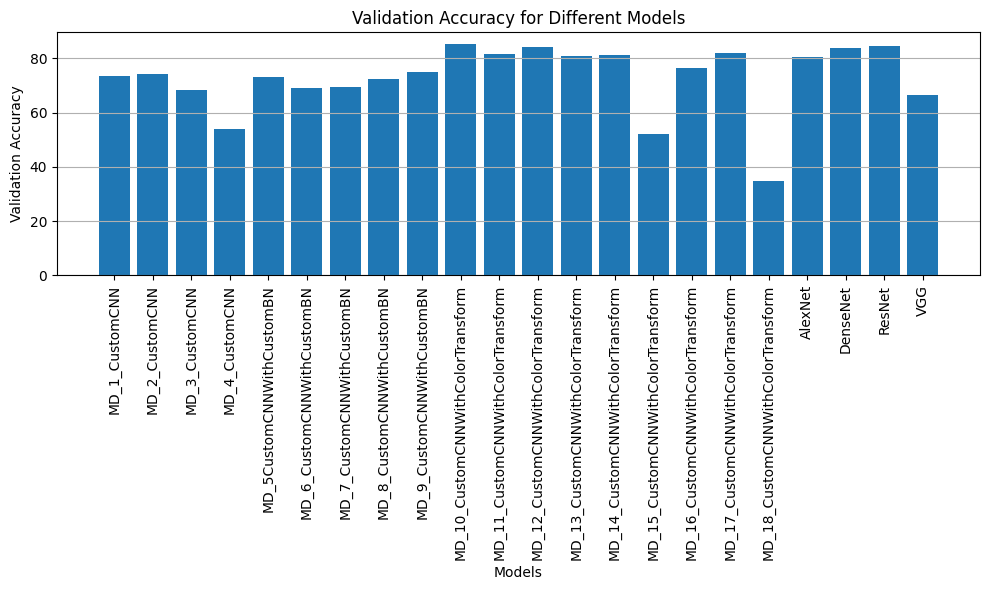

In [ ]:
model_compare()

In [ ]:
def model_compare_train():
    for i in Model_Comparison:
        print(f"{i['Name']} - Training Accuracy : {i['Training_Accuracy']}")
    model_names = [i['Name']for i in Model_Comparison]
    training_accuracies = [i['Training_Accuracy'] for i in Model_Comparison]

    # Plot bar graph
    plt.figure(figsize=(10, 6))
    plt.bar(model_names, training_accuracies)
    plt.xlabel('Models')
    plt.ylabel('Training Accuracy')
    plt.title('Training Accuracy for Different Models')
    plt.grid(axis='y')

    # Rotate x-labels vertically
    plt.xticks(rotation='vertical')

    plt.tight_layout()  # Ensure labels are fully displayed
    plt.show()

# 7.0 Hyper Parameter Tuning
hyper_params

    1. 'criterion':[nn.CrossEntropyLoss(),nn.MultiMarginLoss(),nn.NLLLoss()],
    2. 'lr':[0.00001,0.0001,0.001,0.01,0.1],
    3. 'momentum':[0.1,0.5,0.9]


In [ ]:
model = MD_10_CustomCNNWithColorTransform(num_classes=15).cuda()
best_hyper_params={

}
best_result={
    'Validation_Accuracy':0
}
hyper_params={
    'criterion':[nn.CrossEntropyLoss(),nn.MultiMarginLoss(),nn.NLLLoss()],
    'lr':[0.00001,0.0001,0.001,0.01,0.1],
    'momentum':[0.1,0.5,0.9]
}
for criterion in hyper_params['criterion']:
    for lr in hyper_params['lr']:
        params={
            'epochs':10,
            'criterion':criterion,
            'lr':lr,
            'momentum':0.1
        }
        optimizer = optim.Adam(model.parameters(), lr=params['lr'])
        result=training_model(model,params)
        if result['Validation_Accuracy']>best_result['Validation_Accuracy']:
            best_hyper_params=params
            best_result=result

print(f'\n\nBest Hyper parameters: {best_hyper_params}')


Epoch [1/10] -Training Loss: 2.3306, Validation Loss: 1.8055, Training Accuracy: 27.07%, Validation Accuracy: 54.88%
Epoch [2/10] -Training Loss: 1.7565, Validation Loss: 1.3856, Training Accuracy: 48.07%, Validation Accuracy: 61.95%
Epoch [3/10] -Training Loss: 1.4284, Validation Loss: 1.1212, Training Accuracy: 58.15%, Validation Accuracy: 70.98%
Epoch [4/10] -Training Loss: 1.2292, Validation Loss: 0.9614, Training Accuracy: 63.12%, Validation Accuracy: 74.15%
Epoch [5/10] -Training Loss: 1.0374, Validation Loss: 0.8551, Training Accuracy: 69.54%, Validation Accuracy: 75.85%
Epoch [6/10] -Training Loss: 0.8980, Validation Loss: 0.7749, Training Accuracy: 73.00%, Validation Accuracy: 77.56%
Epoch [7/10] -Training Loss: 0.7939, Validation Loss: 0.7204, Training Accuracy: 77.76%, Validation Accuracy: 80.49%
Epoch [8/10] -Training Loss: 0.7432, Validation Loss: 0.6295, Training Accuracy: 78.52%, Validation Accuracy: 84.15%
Epoch [9/10] -Training Loss: 0.6441, Validation Loss: 0.5708, Tr

# 8.0 Final Model

In [ ]:
# Load your training, validation and test datasets
train_dataset = datasets.ImageFolder(output_folder+'/train', transform=train_transform)
val_dataset = datasets.ImageFolder(output_folder+'/val', transform=train_transform)
test_dataset = datasets.ImageFolder(output_folder + '/test', transform=train_transform)

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=1, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False, num_workers=1, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=1, pin_memory=True)


In [ ]:
model = MD_10_CustomCNNWithColorTransform(num_classes=15).cuda()

params={
    'epochs':15,
    'criterion':nn.CrossEntropyLoss(),
    'lr':0.00001,
    'momentum':0.1
}
optimizer = optim.Adam(model.parameters(), lr=params['lr'])

result=training_model(model,params)




Epoch [1/15] -Training Loss: 0.9594, Validation Loss: 0.7085, Training Accuracy: 68.90%, Validation Accuracy: 76.30%
Epoch [2/15] -Training Loss: 0.5600, Validation Loss: 0.3708, Training Accuracy: 81.32%, Validation Accuracy: 87.31%
Epoch [3/15] -Training Loss: 0.4380, Validation Loss: 0.2796, Training Accuracy: 85.56%, Validation Accuracy: 90.90%
Epoch [4/15] -Training Loss: 0.3462, Validation Loss: 0.2681, Training Accuracy: 88.58%, Validation Accuracy: 90.54%
Epoch [5/15] -Training Loss: 0.2946, Validation Loss: 0.2533, Training Accuracy: 90.36%, Validation Accuracy: 91.82%
Epoch [6/15] -Training Loss: 0.2629, Validation Loss: 0.1880, Training Accuracy: 91.41%, Validation Accuracy: 93.69%
Epoch [7/15] -Training Loss: 0.2313, Validation Loss: 0.1440, Training Accuracy: 92.06%, Validation Accuracy: 95.49%
Epoch [8/15] -Training Loss: 0.2033, Validation Loss: 0.1337, Training Accuracy: 93.21%, Validation Accuracy: 95.44%
Epoch [9/15] -Training Loss: 0.1821, Validation Loss: 0.1235, Tr

Final Model on Validation Dataset

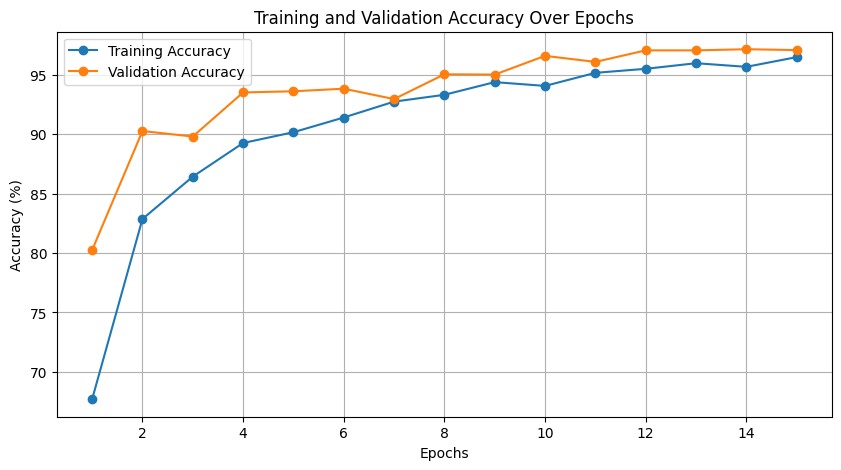

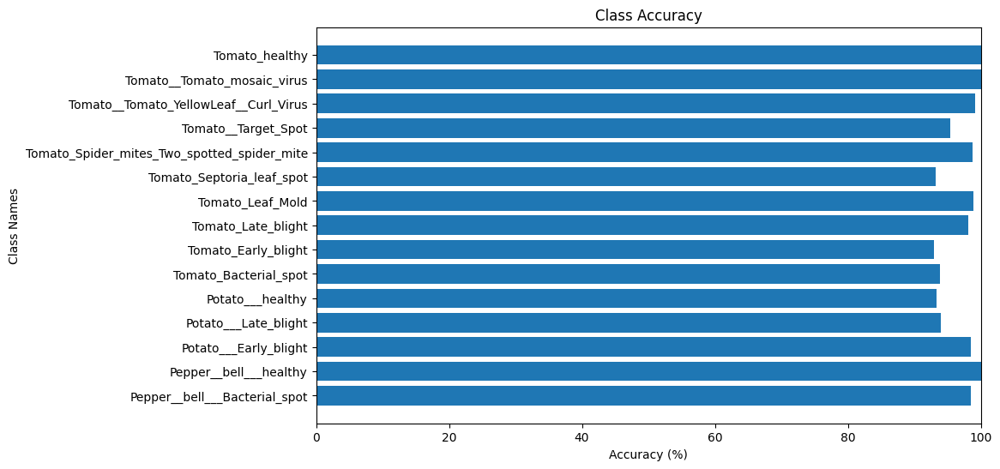

                                    Class_names  Accuracy (%)
0                 Pepper__bell___Bacterial_spot     98.492462
1                        Pepper__bell___healthy    100.000000
2                         Potato___Early_blight     98.500000
3                          Potato___Late_blight     94.000000
4                              Potato___healthy     93.333333
5                         Tomato_Bacterial_spot     93.882353
6                           Tomato_Early_blight     93.000000
7                            Tomato_Late_blight     98.162730
8                              Tomato_Leaf_Mold     98.947368
9                     Tomato_Septoria_leaf_spot     93.220339
10  Tomato_Spider_mites_Two_spotted_spider_mite     98.805970
11                          Tomato__Target_Spot     95.357143
12        Tomato__Tomato_YellowLeaf__Curl_Virus     99.219969
13                  Tomato__Tomato_mosaic_virus    100.000000
14                               Tomato_healthy    100.000000


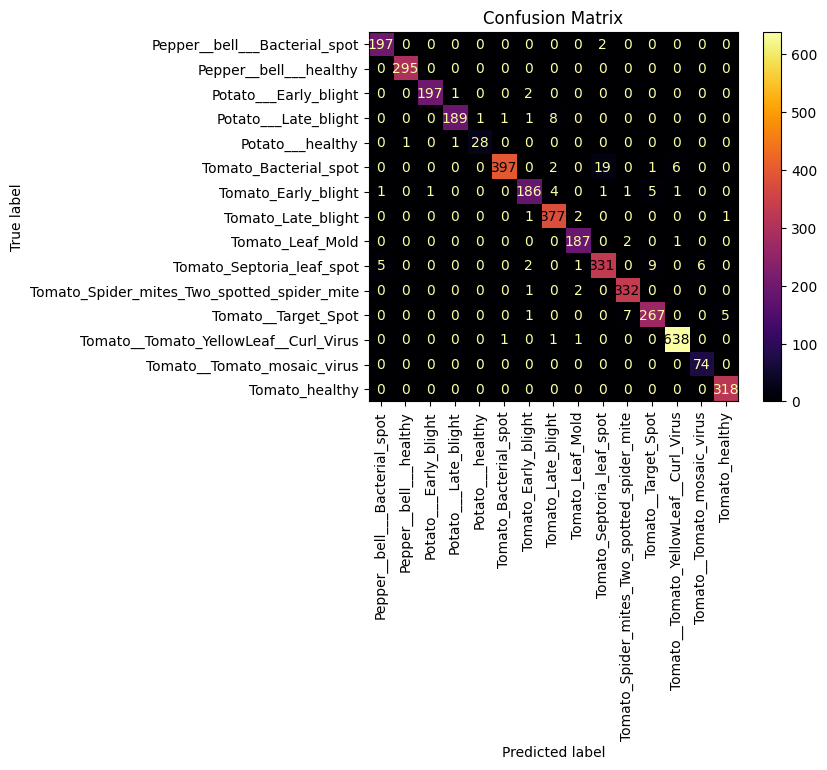

In [ ]:
evaluation(model,val_loader,class_labels,result['train_accuracy_list'],result['val_accuracy_list'],true_labels_val, predicted_classes_val, num_classes)

# 9.0 Final Model on Test Data

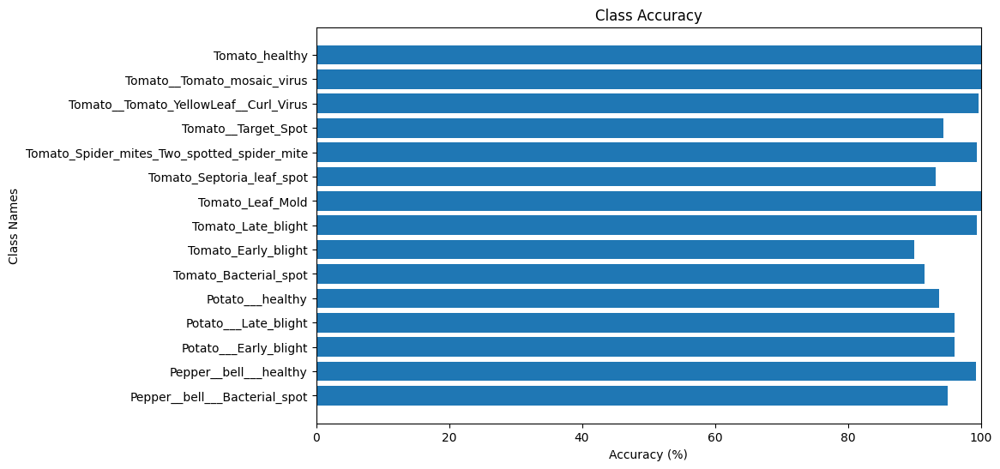

                                    Class_names  Accuracy (%)
0                 Pepper__bell___Bacterial_spot     95.049505
1                        Pepper__bell___healthy     99.328859
2                         Potato___Early_blight     96.000000
3                          Potato___Late_blight     96.000000
4                              Potato___healthy     93.750000
5                         Tomato_Bacterial_spot     91.588785
6                           Tomato_Early_blight     90.000000
7                            Tomato_Late_blight     99.479167
8                              Tomato_Leaf_Mold    100.000000
9                     Tomato_Septoria_leaf_spot     93.258427
10  Tomato_Spider_mites_Two_spotted_spider_mite     99.404762
11                          Tomato__Target_Spot     94.366197
12        Tomato__Tomato_YellowLeaf__Curl_Virus     99.689441
13                  Tomato__Tomato_mosaic_virus    100.000000
14                               Tomato_healthy    100.000000


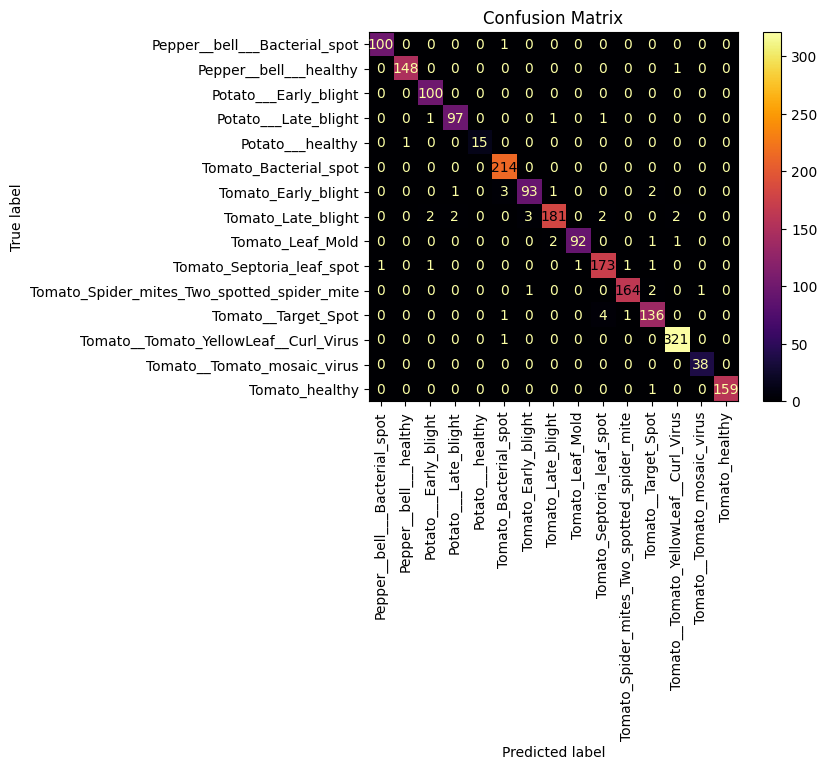

In [ ]:

print(class_accuracy(true_labels_test, predicted_classes_test, num_classes))
plot_confusion_matrix(model, test_loader, class_labels)

# 10.0 Conclusion and analysis
As we can see Model provided performance accuracy with more than 90% for all classes. In test cases and also more than 93% for validation dataset. It outperformed some established model such as resnet, alexnet etc. Having said that it does not mean the presented model is better than the established models. Compared to established model the presented model takes more time and the presented model was largly hypertuned to reach its peak performance. There are research on same dataset using resnet and other models such as densnet with more than 97% accuracy for indiviaual data because those established models are hypertuned and optimized. But in same condition the presented model may outperfrm some established models in favoured scenerio where green channel may be a deciding factor for data classification.  